In [1]:
# %matplotlib inline
# from IPython.display import Image


## Taking Root Data Challenge
### Addressing overlapping issues in farm trace data for quantifying carbon

By Carlina Kim

<img src="images/image2.png" width="300" height="450">

### Problem: want to avoid "double-counting" carbon 

- Overlapping for trace farms due to GPS errors or unclear farm boundaries.

- We want to minimize clients going back out to field to remap a farm. We want to help partners decide if parcels need to be edited, ignored, remapped or deleted


### Methods:

1) Identified all overlaps of Plot 1 and Plot 2 for each ID. 
  - `intersection`: coordinates of overlap areas 
  
2) Quantify the extent of overlaps. Create new calculations columns:
  - `overlap_area_plota_percent`
  - `overlap_area_plotb_percent`
  - `overlap_average_percent`: percentage of overlap average for plot 1 and plot 2 coverage

3) Metrics: Apply threshold of the trace farms overlap average percentage
   - If average overlap < 5%, IGNORED and use `union` to combine the plots and use this for measuring carbon (threshold can be decided based on appropriate value)
   - If average overlap >= 5% but <= 95, NEEDS REVIEW. Created new database for the ones needing review.
   - If overlap > 95%, DELETE one of the plot pair and use only 1 for carbon quantification.

### Solutions

1) `full_overlaps_df`: where plot pairs intersected > 95%, Flagging these ID's notifies project managers that the trace farms were either duplicated 

2) `union_plots_df`: for plot pairs with average < 5% , could also be the IDS to manually adjust.

3) `needs_review_df`: for plot pairs with 5% <= average overlap <= 95% 
  - using difference_a, difference_b, and intersection to get the carbon quantification


In [2]:
#import packages 

import pandas as pd
from shapely.geometry import Polygon, MultiPolygon
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely import wkt, geometry
from matplotlib import pyplot
import numpy as np
from preprocessing import convertWKT, percentage_area, createPlots, createPlotsPairs
import scipy as sp
import plotly.express as px
%load_ext autoreload
%autoreload 2

In [111]:
#reading in data 
data = pd.read_csv("data/sample-data.csv")
data.head()

,id,Pair_a,Pair_b
0,0,"POLYGON ((30.9195000615594 1.22320399310169, 3...","POLYGON ((30.9178628236499 1.22298964247023, 3..."
1,1,"POLYGON ((30.9154907 1.2168457697, 30.91549089...","POLYGON ((30.9176490186294 1.21758566108396, 3..."
2,2,"POLYGON ((31.7216862920056 1.83134403943523, 3...","POLYGON ((31.7216862920056 1.83134403943523, 3..."
3,3,"POLYGON ((31.7023455560315 1.83796156365404, 3...","POLYGON ((31.7023455560315 1.83796156365404, 3..."
4,4,"POLYGON ((31.7061141722958 1.83877089201203, 3...","POLYGON ((31.7061141722958 1.83877089201203, 3..."


In [112]:
df= data.copy()

#convert data type into geometry type
gdf = convertWKT(df, 'Pair_a')
gdf = convertWKT(df, 'Pair_b')

gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 513 entries, 0 to 512
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   id      513 non-null    int64   
 1   Pair_a  513 non-null    geometry
 2   Pair_b  513 non-null    geometry
dtypes: geometry(2), int64(1)
memory usage: 12.1 KB


In [113]:
example = gdf.loc[[0]].reset_index() #94
example.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   index   1 non-null      int64   
 1   id      1 non-null      int64   
 2   Pair_a  1 non-null      geometry
 3   Pair_b  1 non-null      geometry
dtypes: geometry(2), int64(2)
memory usage: 160.0 bytes


In [114]:
# !conda install -c conda-forge nodejs
# !jupyter labextension install @jupyter-widgets/jupyterlab-manager 
# !jupyter-matplotlib

In [ ]:
# %matplotlib notebook
# %matplotlib widget
# %matplotlib inline

createPlotsPairs(example, 'Example Plot', (5, 5), 0.7)

In [7]:
# import plotly
# import plotly.express as px
# plotly.offline.init_notebook_mode(connected=True)
# import plotly.graph_objects as go

# for slide in range(len(example)):
#     d = {'col1': ['Pair_a'], 'geometry': [example.Pair_a[slide]]}
#     new = gpd.GeoDataFrame(d, crs='EPSG:4326').set_index('col1')

#     fig = px.choropleth(new,
#         geojson=gpd.GeoSeries(new["geometry"]).__geo_interface__,
#         locations=new.index,
#         color=new["geometry"].apply(lambda p: len(p.exterior.coords)),
#                                   )
#     fig.update_geos(fitbounds="locations",  visible= False)

#     fig.show()

In [115]:
# new column for intersection of the two plots, like an inner join of polygon shapes
gdf['intersect_plots'] = gdf['Pair_a'].intersection(gdf['Pair_b'])

gdf[['id', 'intersect_plots']].to_csv('outputs/intersect_plots.csv', index= False)
gdf.head()

,id,Pair_a,Pair_b,intersect_plots
0,0,"POLYGON ((30.91950 1.22320, 30.91951 1.22320, ...","POLYGON ((30.91786 1.22299, 30.91786 1.22299, ...","MULTIPOLYGON (((30.91838 1.22247, 30.91838 1.2..."
1,1,"POLYGON ((30.91549 1.21685, 30.91549 1.21685, ...","POLYGON ((30.91765 1.21759, 30.91765 1.21758, ...","MULTIPOLYGON (((30.91657 1.21782, 30.91658 1.2..."
2,2,"POLYGON ((31.72169 1.83134, 31.72168 1.83135, ...","POLYGON ((31.72169 1.83134, 31.72168 1.83135, ...","POLYGON ((31.72168 1.83135, 31.72166 1.83135, ..."
3,3,"POLYGON ((31.70235 1.83796, 31.70235 1.83796, ...","POLYGON ((31.70235 1.83796, 31.70235 1.83796, ...","POLYGON ((31.70235 1.83796, 31.70234 1.83796, ..."
4,4,"POLYGON ((31.70611 1.83877, 31.70611 1.83877, ...","POLYGON ((31.70611 1.83877, 31.70611 1.83877, ...","POLYGON ((31.70611 1.83877, 31.70611 1.83877, ..."


In [ ]:
#Plot showing intersection of Pair a and Pair b 

createPlots(gdf, 'intersect_plots', "Intersections of Pair_a and Pair_b Identified", (7,15), 0.9)

In [116]:
# new column for difference of the two plots, like an outer join of polygon shapes
# Ones with POLYGON EMPTY will be flagged for project managers to address issue 

gdf['difference_a'] = gdf['Pair_a'].difference(gdf['Pair_b'])
gdf['difference_b'] = gdf['Pair_b'].difference(gdf['Pair_a'])

In [117]:
# percentage of area of overlap for plot a and plot b
gdf['overlap_area_plota_percent'] = percentage_area(gdf, 'Pair_a', 'Pair_b')
gdf['overlap_area_plotb_percent'] = percentage_area(gdf, 'Pair_b', 'Pair_a')


# average of percentages
gdf['overlap_average_percent'] = (gdf['overlap_area_plota_percent']+ gdf['overlap_area_plotb_percent'])/2


#setting threshold metrics for different overlaps 
union_overlaps = gdf.query('overlap_average_percent < 5').reset_index(drop= True)
needs_review_overlaps = gdf.query('5 <= overlap_average_percent & overlap_average_percent <= 95').reset_index(drop= True)
full_overlaps = gdf.query('overlap_average_percent > 95').reset_index(drop= True)


In [118]:
print(union_overlaps.shape)
print(needs_review_overlaps.shape)
print(full_overlaps.shape)


(172, 9)
(56, 9)
(285, 9)


In [119]:
print(union_overlaps.shape)
union_overlaps.sort_values(by='overlap_average_percent', ascending=False)

(172, 9)


,id,Pair_a,Pair_b,intersect_plots,difference_a,difference_b,overlap_area_plota_percent,overlap_area_plotb_percent,overlap_average_percent
142,359,"POLYGON ((31.74340 1.74849, 31.74340 1.74848, ...","POLYGON ((31.74252 1.74833, 31.74252 1.74836, ...","POLYGON ((31.74312 1.74820, 31.74312 1.74820, ...","POLYGON ((31.74340 1.74848, 31.74340 1.74845, ...","POLYGON ((31.74252 1.74836, 31.74253 1.74839, ...",2.849804,5.435300,4.142552
0,0,"POLYGON ((30.91950 1.22320, 30.91951 1.22320, ...","POLYGON ((30.91786 1.22299, 30.91786 1.22299, ...","MULTIPOLYGON (((30.91838 1.22247, 30.91838 1.2...","POLYGON ((30.91951 1.22320, 30.91951 1.22320, ...","POLYGON ((30.91786 1.22299, 30.91786 1.22299, ...",3.184834,5.084904,4.134869
139,353,"POLYGON ((31.74373 1.77524, 31.74373 1.77524, ...","POLYGON ((31.74420 1.77538, 31.74420 1.77538, ...","MULTIPOLYGON (((31.74357 1.77622, 31.74357 1.7...","POLYGON ((31.74373 1.77524, 31.74373 1.77525, ...","POLYGON ((31.74404 1.77592, 31.74404 1.77592, ...",2.652974,5.285895,3.969435
149,383,"POLYGON ((31.74373 1.77524, 31.74373 1.77524, ...","POLYGON ((31.74420 1.77538, 31.74420 1.77538, ...","MULTIPOLYGON (((31.74357 1.77622, 31.74357 1.7...","POLYGON ((31.74373 1.77524, 31.74373 1.77525, ...","POLYGON ((31.74404 1.77592, 31.74404 1.77592, ...",2.652974,5.285895,3.969435
150,384,"POLYGON ((31.74373 1.77524, 31.74373 1.77524, ...","POLYGON ((31.74420 1.77538, 31.74420 1.77538, ...","MULTIPOLYGON (((31.74357 1.77622, 31.74357 1.7...","POLYGON ((31.74373 1.77524, 31.74373 1.77525, ...","POLYGON ((31.74404 1.77592, 31.74404 1.77592, ...",2.652974,5.285895,3.969435
...,...,...,...,...,...,...,...,...,...
132,339,"POLYGON ((31.74774 1.80708, 31.74774 1.80708, ...","POLYGON ((31.74804 1.80595, 31.74804 1.80595, ...","POLYGON ((31.74753 1.80655, 31.74753 1.80654, ...","POLYGON ((31.74774 1.80708, 31.74774 1.80707, ...","POLYGON ((31.74804 1.80595, 31.74804 1.80595, ...",0.018101,0.013411,0.015756
125,328,"POLYGON ((31.74804 1.80595, 31.74804 1.80595, ...","POLYGON ((31.74774 1.80708, 31.74774 1.80708, ...","POLYGON ((31.74750 1.80654, 31.74750 1.80654, ...","POLYGON ((31.74804 1.80595, 31.74804 1.80595, ...","POLYGON ((31.74774 1.80708, 31.74774 1.80707, ...",0.013411,0.018101,0.015756
126,329,"POLYGON ((31.74804 1.80595, 31.74804 1.80595, ...","POLYGON ((31.74774 1.80708, 31.74774 1.80708, ...","POLYGON ((31.74750 1.80654, 31.74750 1.80654, ...","POLYGON ((31.74804 1.80595, 31.74804 1.80595, ...","POLYGON ((31.74774 1.80708, 31.74774 1.80707, ...",0.013411,0.018101,0.015756
64,171,"POLYGON ((30.91437 1.22246, 30.91437 1.22246, ...","POLYGON ((30.91440 1.22225, 30.91440 1.22225, ...","POLYGON ((30.91444 1.22265, 30.91444 1.22265, ...","POLYGON ((30.91437 1.22246, 30.91437 1.22245, ...","POLYGON ((30.91440 1.22225, 30.91441 1.22226, ...",0.003377,0.003850,0.003613


In [120]:
print(needs_review_overlaps.shape)
needs_review_overlaps.sort_values(by='overlap_average_percent', ascending=False)

(56, 9)


,id,Pair_a,Pair_b,intersect_plots,difference_a,difference_b,overlap_area_plota_percent,overlap_area_plotb_percent,overlap_average_percent
30,239,"POLYGON ((31.74010 1.79842, 31.74010 1.79842, ...","POLYGON ((31.74011 1.79842, 31.74011 1.79840, ...","POLYGON ((31.74010 1.79842, 31.74009 1.79842, ...","MULTIPOLYGON (((31.74009 1.79849, 31.74009 1.7...","MULTIPOLYGON (((31.74011 1.79840, 31.74011 1.7...",91.697994,96.926735,94.312364
39,314,"POLYGON ((31.78967 1.80537, 31.78967 1.80537, ...","POLYGON ((31.79040 1.80633, 31.79041 1.80633, ...","POLYGON ((31.78968 1.80538, 31.78968 1.80538, ...","MULTIPOLYGON (((31.78967 1.80537, 31.78967 1.8...","MULTIPOLYGON (((31.79044 1.80629, 31.79044 1.8...",87.956935,98.984043,93.470489
36,311,"POLYGON ((31.78967 1.80537, 31.78967 1.80537, ...","POLYGON ((31.79040 1.80633, 31.79041 1.80633, ...","POLYGON ((31.78968 1.80538, 31.78968 1.80538, ...","MULTIPOLYGON (((31.78967 1.80537, 31.78967 1.8...","MULTIPOLYGON (((31.79044 1.80629, 31.79044 1.8...",87.956935,98.984043,93.470489
37,312,"POLYGON ((31.78967 1.80537, 31.78967 1.80537, ...","POLYGON ((31.79040 1.80633, 31.79041 1.80633, ...","POLYGON ((31.78968 1.80538, 31.78968 1.80538, ...","MULTIPOLYGON (((31.78967 1.80537, 31.78967 1.8...","MULTIPOLYGON (((31.79044 1.80629, 31.79044 1.8...",87.956935,98.984043,93.470489
38,313,"POLYGON ((31.78967 1.80537, 31.78967 1.80537, ...","POLYGON ((31.79040 1.80633, 31.79041 1.80633, ...","POLYGON ((31.78968 1.80538, 31.78968 1.80538, ...","MULTIPOLYGON (((31.78967 1.80537, 31.78967 1.8...","MULTIPOLYGON (((31.79044 1.80629, 31.79044 1.8...",87.956935,98.984043,93.470489
0,20,"POLYGON ((33.99025 0.98975, 33.99025 0.98975, ...","POLYGON ((33.99096 0.98973, 33.99096 0.98973, ...","POLYGON ((33.99025 0.98975, 33.99025 0.98975, ...","MULTIPOLYGON (((33.99023 0.98976, 33.99022 0.9...","MULTIPOLYGON (((33.99096 0.98973, 33.99096 0.9...",94.428789,90.955695,92.692242
47,376,"POLYGON ((31.73912 1.77024, 31.73912 1.77024, ...","POLYGON ((31.73886 1.76984, 31.73886 1.76984, ...","POLYGON ((31.73912 1.77024, 31.73912 1.77024, ...","MULTIPOLYGON (((31.73910 1.77025, 31.73910 1.7...","MULTIPOLYGON (((31.73886 1.76984, 31.73886 1.7...",86.141623,97.278216,91.709920
14,72,"POLYGON ((30.91507 1.22277, 30.91508 1.22277, ...","POLYGON ((30.91440 1.22225, 30.91440 1.22225, ...","POLYGON ((30.91477 1.22225, 30.91475 1.22225, ...","MULTIPOLYGON (((30.91508 1.22277, 30.91508 1.2...","MULTIPOLYGON (((30.91443 1.22233, 30.91443 1.2...",82.359954,98.725826,90.542890
3,40,"POLYGON ((34.01634 1.03134, 34.01633 1.03134, ...","POLYGON ((34.01636 1.03139, 34.01636 1.03139, ...","POLYGON ((34.01622 1.03139, 34.01622 1.03139, ...","MULTIPOLYGON (((34.01633 1.03134, 34.01633 1.0...","MULTIPOLYGON (((34.01636 1.03139, 34.01636 1.0...",94.967677,84.959626,89.963652
26,155,"POLYGON ((31.50978 1.62906, 31.50978 1.62906, ...","POLYGON ((31.51006 1.62863, 31.51006 1.62863, ...","POLYGON ((31.50978 1.62906, 31.50977 1.62906, ...","MULTIPOLYGON (((31.50969 1.62910, 31.50969 1.6...","MULTIPOLYGON (((31.51006 1.62863, 31.51006 1.6...",98.993093,73.063430,86.028262


In [121]:
print(full_overlaps.shape)
full_overlaps.sort_values(by='overlap_average_percent', ascending=False)

(285, 9)


,id,Pair_a,Pair_b,intersect_plots,difference_a,difference_b,overlap_area_plota_percent,overlap_area_plotb_percent,overlap_average_percent
228,440,"POLYGON ((31.75847 1.80925, 31.75847 1.80925, ...","POLYGON ((31.75847 1.80925, 31.75847 1.80925, ...","POLYGON ((31.75847 1.80925, 31.75847 1.80926, ...",POLYGON EMPTY,POLYGON EMPTY,100.0,100.0,100.0
127,280,"POLYGON ((33.99254 1.01123, 33.99254 1.01123, ...","POLYGON ((33.99254 1.01123, 33.99254 1.01123, ...","POLYGON ((33.99254 1.01123, 33.99254 1.01124, ...",POLYGON EMPTY,POLYGON EMPTY,100.0,100.0,100.0
37,100,"POLYGON ((31.11721 1.40228, 31.11721 1.40228, ...","POLYGON ((31.11721 1.40228, 31.11721 1.40228, ...","POLYGON ((31.11721 1.40228, 31.11721 1.40228, ...",POLYGON EMPTY,POLYGON EMPTY,100.0,100.0,100.0
21,52,"POLYGON ((31.11291 1.40120, 31.11291 1.40120, ...","POLYGON ((31.11291 1.40120, 31.11291 1.40120, ...","POLYGON ((31.11291 1.40120, 31.11291 1.40120, ...",POLYGON EMPTY,POLYGON EMPTY,100.0,100.0,100.0
216,426,"POLYGON ((31.51805 1.61259, 31.51805 1.61259, ...","POLYGON ((31.51805 1.61259, 31.51805 1.61259, ...","POLYGON ((31.51805 1.61259, 31.51805 1.61261, ...",POLYGON EMPTY,POLYGON EMPTY,100.0,100.0,100.0
...,...,...,...,...,...,...,...,...,...
11,27,"POLYGON ((31.43809 1.62355, 31.43809 1.62356, ...","POLYGON ((31.43809 1.62355, 31.43809 1.62356, ...","POLYGON ((31.43809 1.62356, 31.43809 1.62357, ...",POLYGON EMPTY,POLYGON EMPTY,100.0,100.0,100.0
12,28,"POLYGON ((31.43809 1.62355, 31.43809 1.62356, ...","POLYGON ((31.43809 1.62355, 31.43809 1.62356, ...","POLYGON ((31.43809 1.62356, 31.43809 1.62357, ...",POLYGON EMPTY,POLYGON EMPTY,100.0,100.0,100.0
13,29,"POLYGON ((31.43809 1.62355, 31.43809 1.62356, ...","POLYGON ((31.43809 1.62355, 31.43809 1.62356, ...","POLYGON ((31.43809 1.62356, 31.43809 1.62357, ...",POLYGON EMPTY,POLYGON EMPTY,100.0,100.0,100.0
15,31,"POLYGON ((31.43809 1.62355, 31.43809 1.62356, ...","POLYGON ((31.43809 1.62355, 31.43809 1.62356, ...","POLYGON ((31.43809 1.62356, 31.43809 1.62357, ...",POLYGON EMPTY,POLYGON EMPTY,100.0,100.0,100.0


## Solution 1: Full overlaps with > 95% intersection coverage 

We can use this new dataframe to inform project managers these have > 95% intersection between Pair_a and Pair_b, meaning that they have the same coordinates and possibly indicates duplicate of measure same trace farm or error in GPS. 

Possible solution here to use only one of the column ex use only Pair_a to quantify carbon. 

Overlap average percent: 100.0


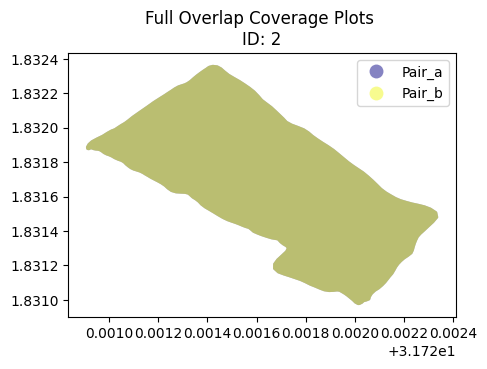

Overlap average percent: 100.0


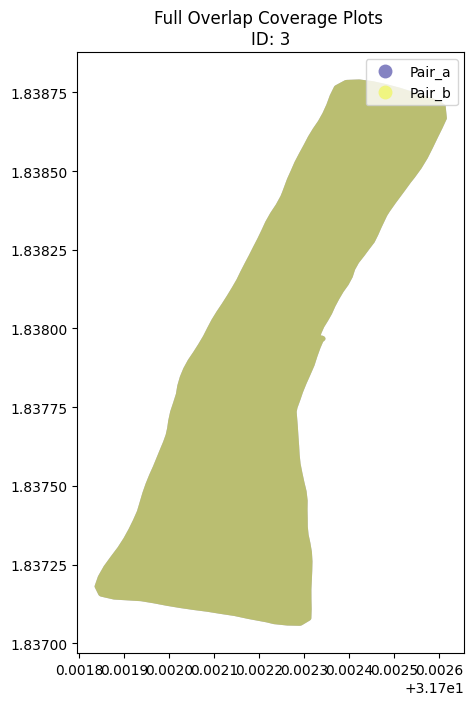

Overlap average percent: 100.0


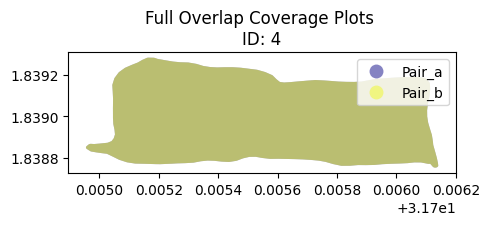

Overlap average percent: 100.0


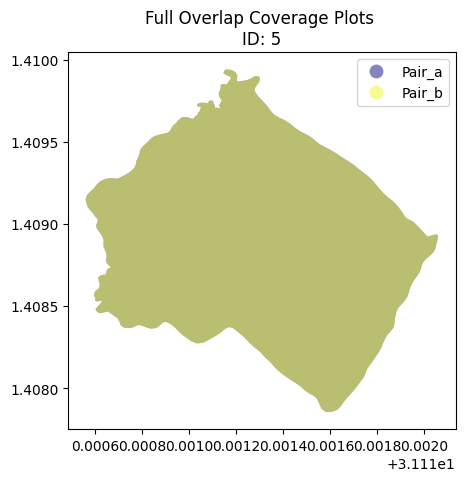

Overlap average percent: 100.0


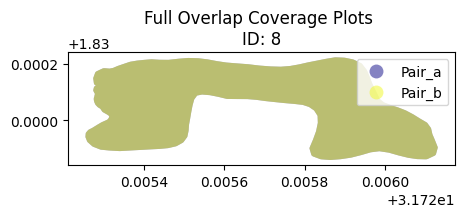

Overlap average percent: 100.0


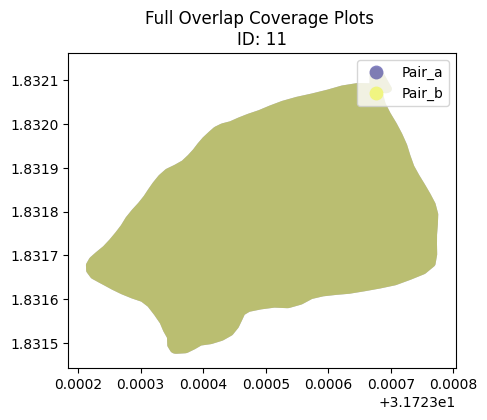

Overlap average percent: 100.0


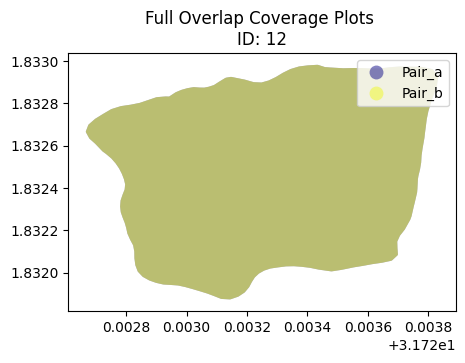

Overlap average percent: 100.0


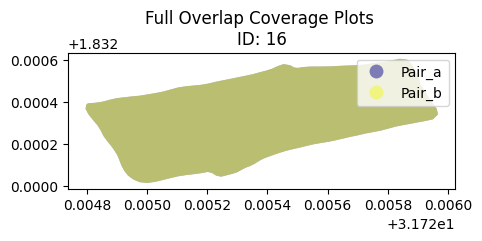

Overlap average percent: 100.0


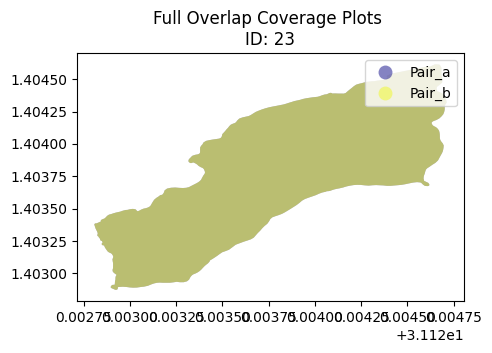

Overlap average percent: 100.0


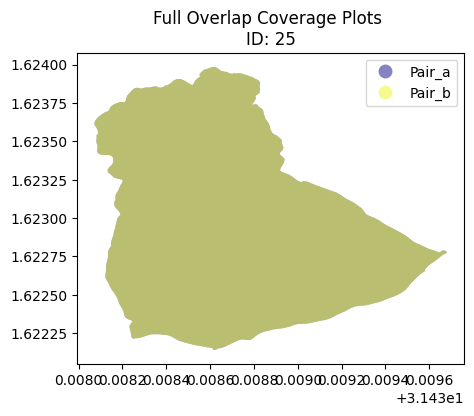

Overlap average percent: 100.0


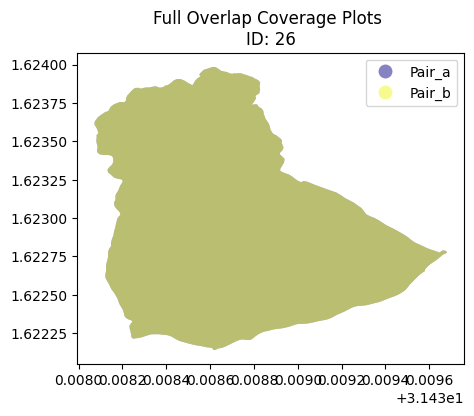

Overlap average percent: 100.0


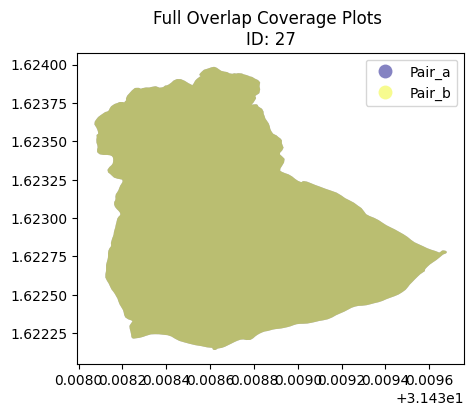

Overlap average percent: 100.0


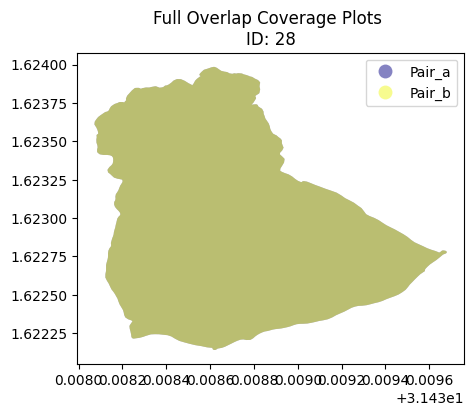

Overlap average percent: 100.0


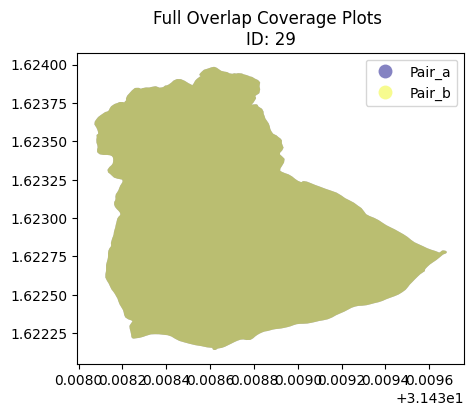

Overlap average percent: 100.0


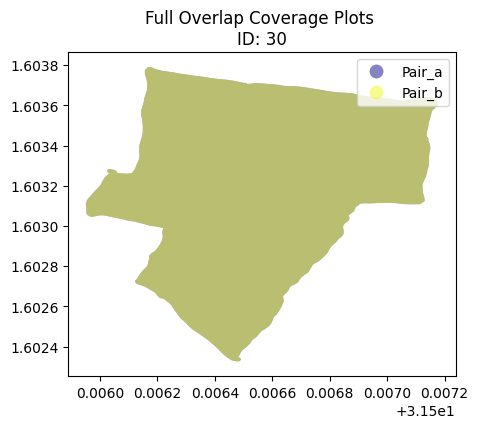

Overlap average percent: 100.0


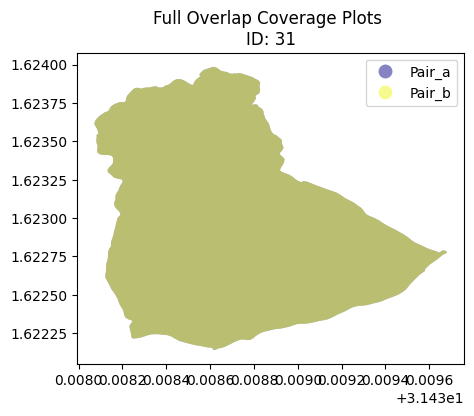

Overlap average percent: 100.0


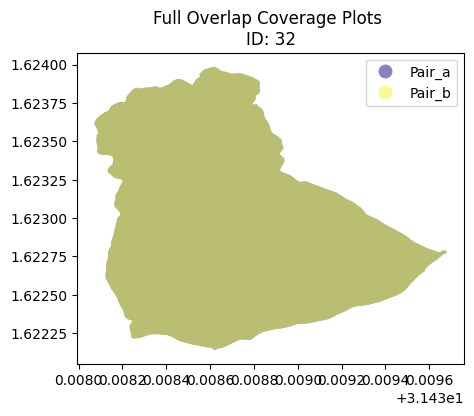

Overlap average percent: 100.0


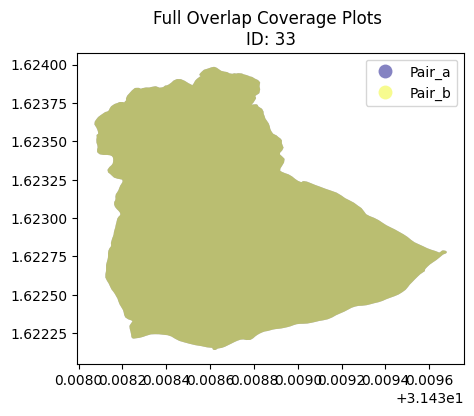

Overlap average percent: 100.0


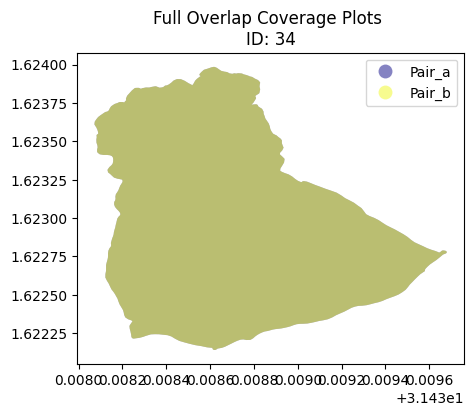

Overlap average percent: 100.0


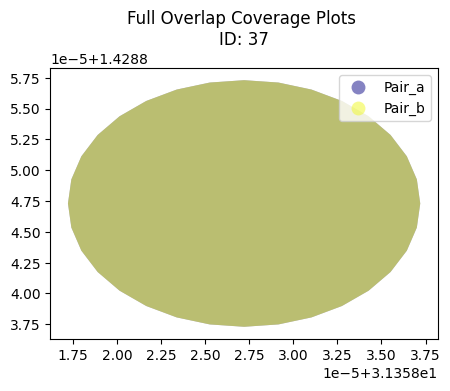

Overlap average percent: 100.0


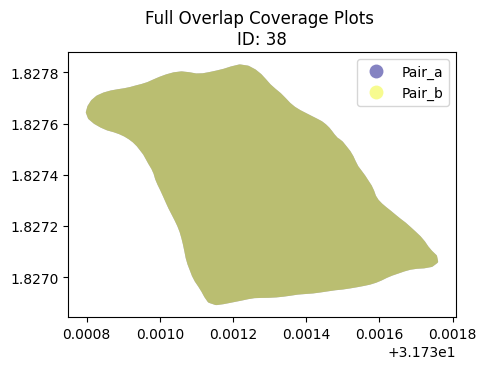

Overlap average percent: 100.0


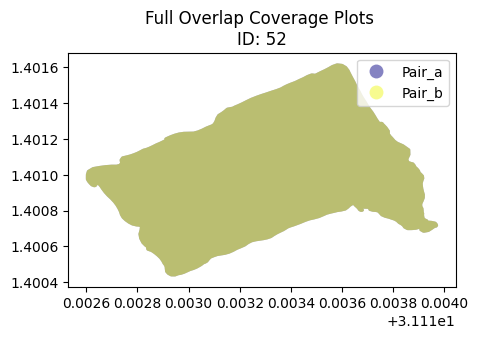

Overlap average percent: 100.0


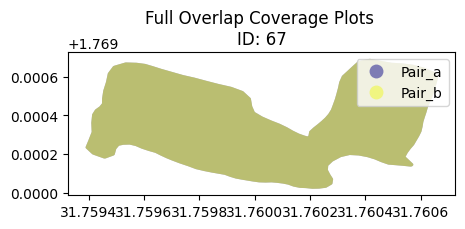

Overlap average percent: 100.0


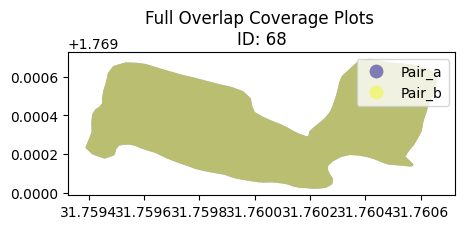

Overlap average percent: 100.0


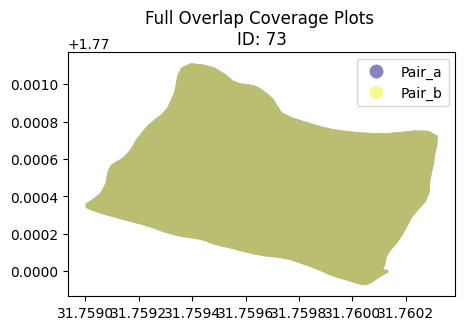

Overlap average percent: 100.0


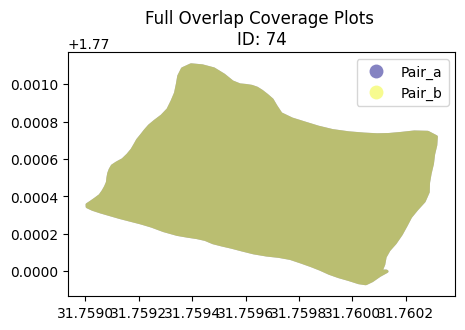

Overlap average percent: 100.0


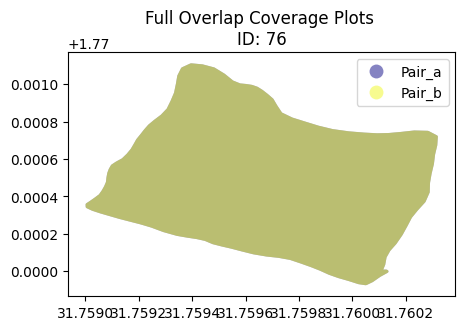

Overlap average percent: 100.0


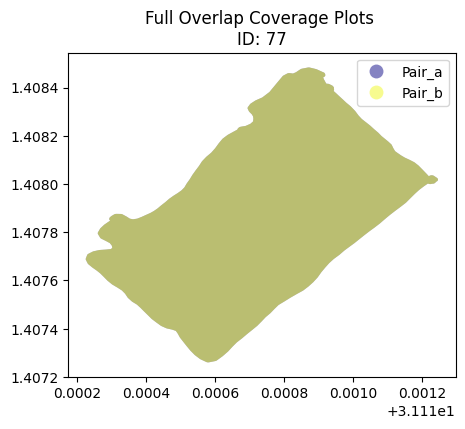

Overlap average percent: 100.0


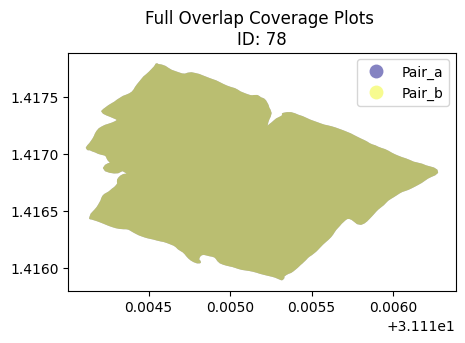

Overlap average percent: 100.0


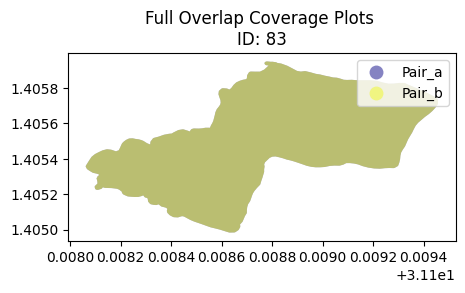

Overlap average percent: 100.0


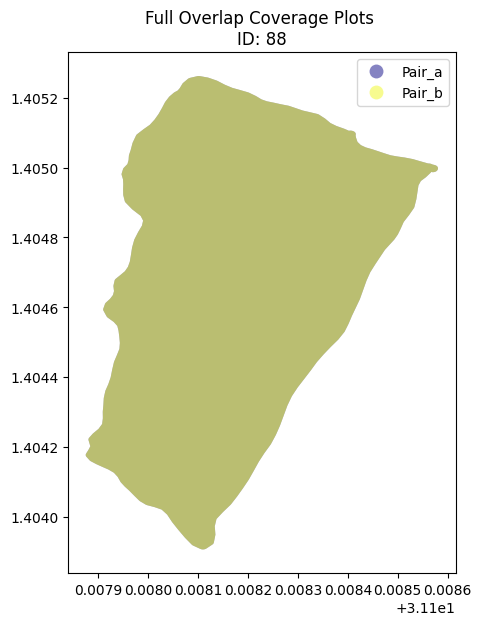

Overlap average percent: 100.0


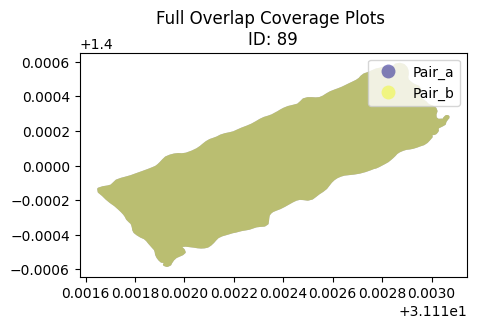

Overlap average percent: 100.0


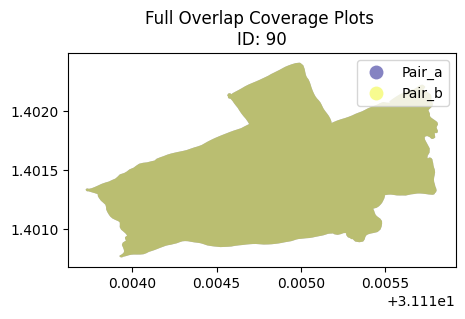

Overlap average percent: 100.0


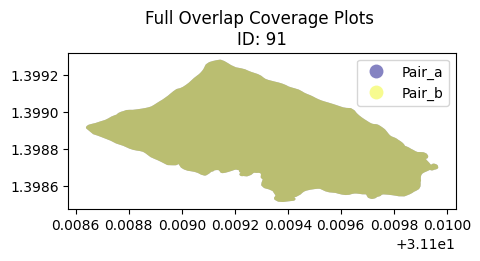

Overlap average percent: 100.0


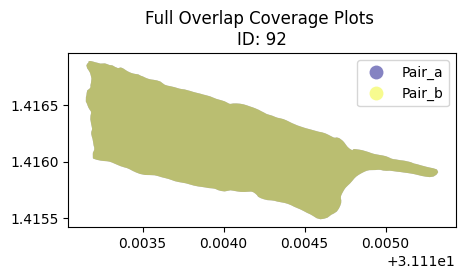

Overlap average percent: 100.0


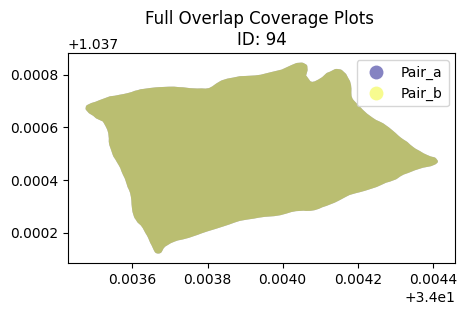

Overlap average percent: 100.0


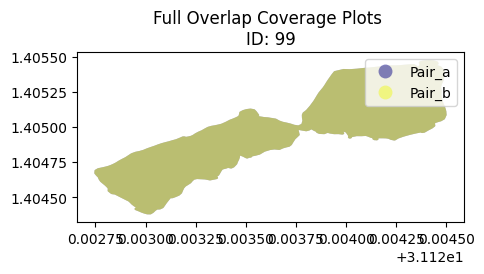

Overlap average percent: 100.0


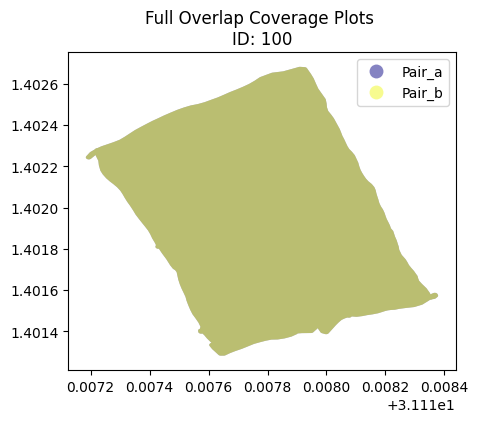

Overlap average percent: 100.0


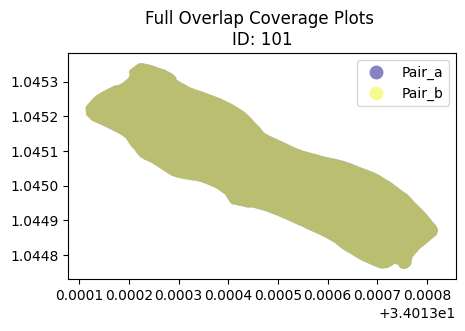

Overlap average percent: 100.0


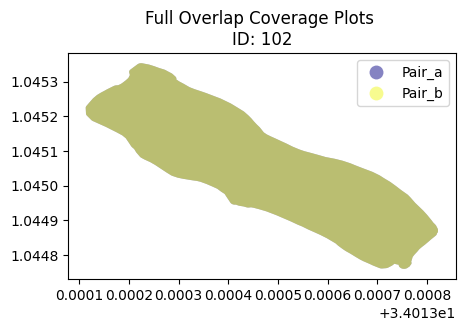

Overlap average percent: 100.0


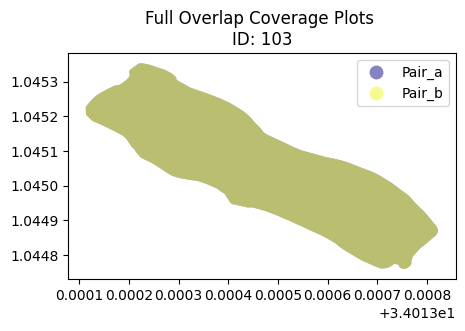

Overlap average percent: 100.0


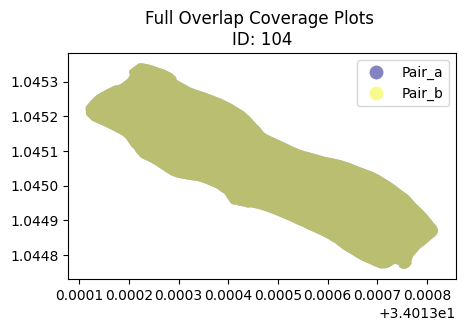

Overlap average percent: 100.0


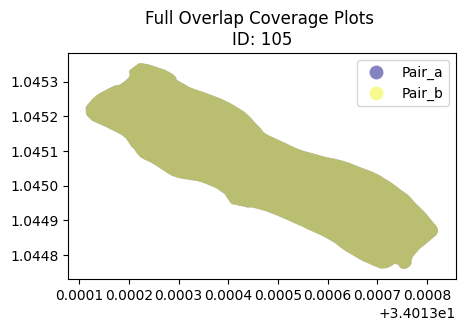

Overlap average percent: 100.0


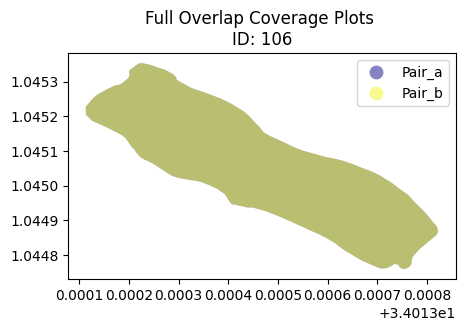

Overlap average percent: 100.0


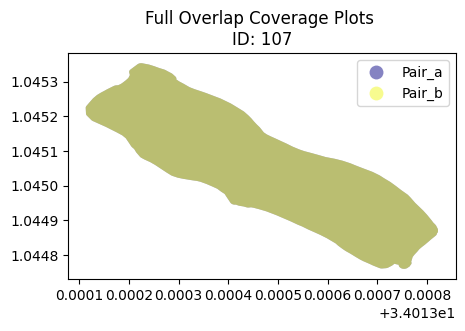

Overlap average percent: 100.0


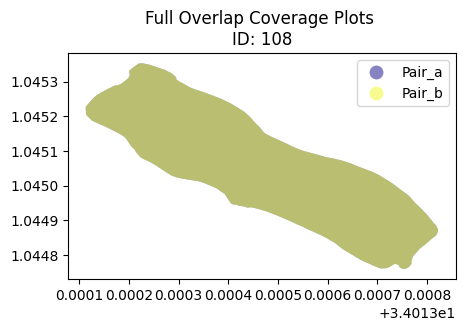

Overlap average percent: 100.0


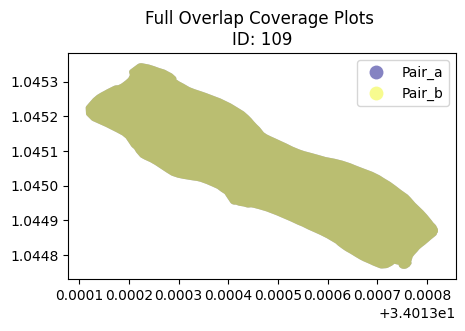

Overlap average percent: 100.0


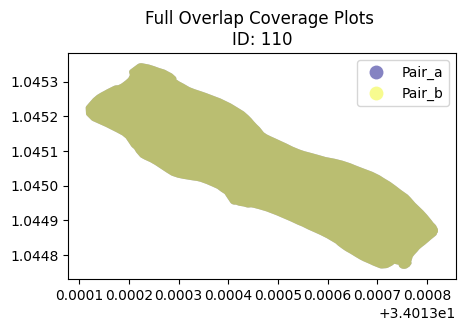

Overlap average percent: 100.0


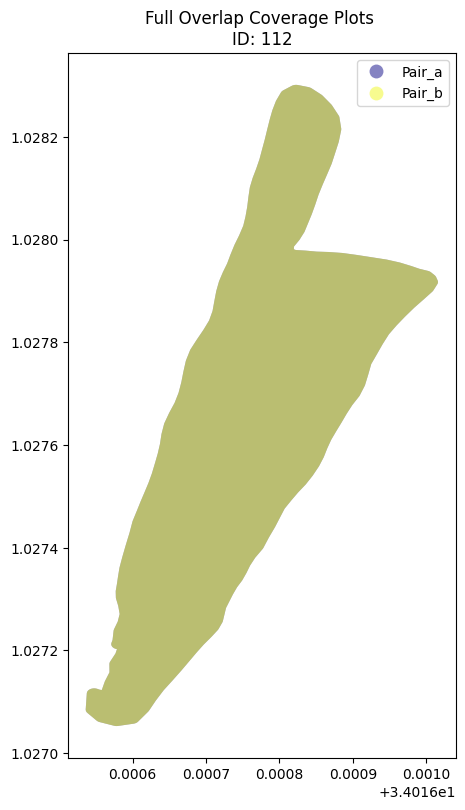

Overlap average percent: 100.0


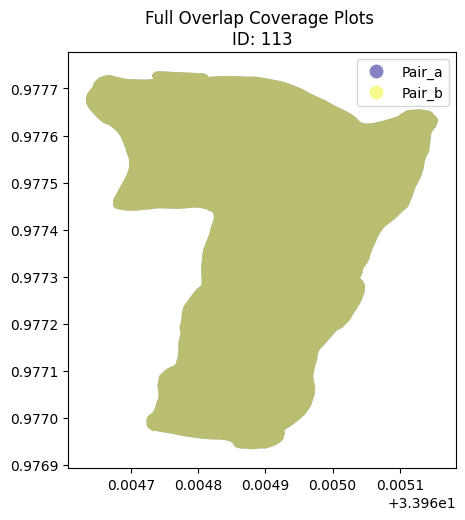

Overlap average percent: 100.0


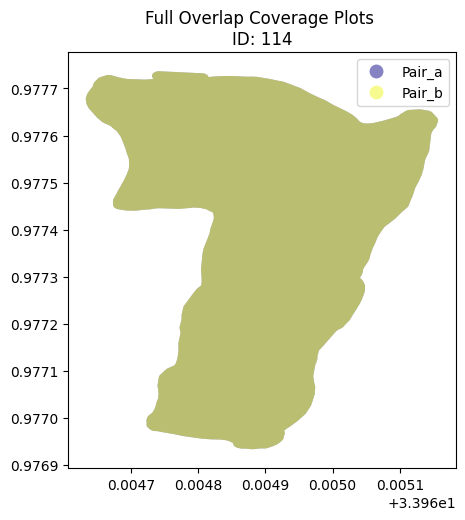

Overlap average percent: 100.0


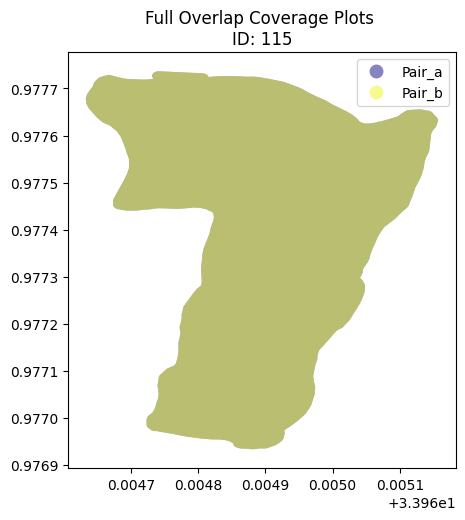

Overlap average percent: 100.0


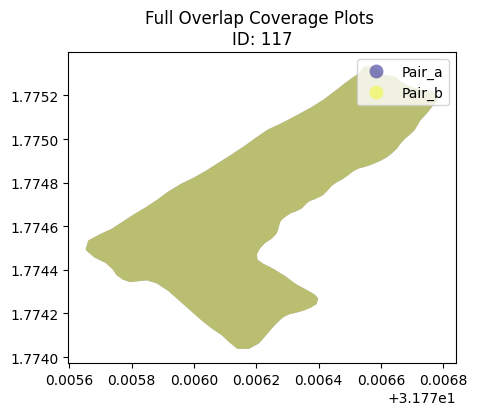

Overlap average percent: 100.0


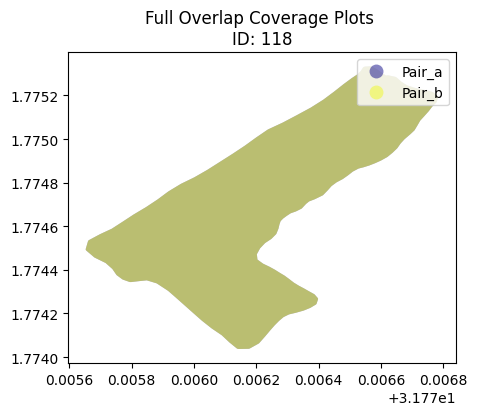

Overlap average percent: 100.0


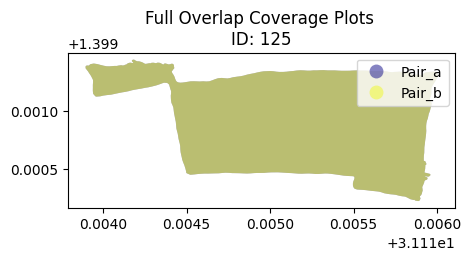

Overlap average percent: 100.0


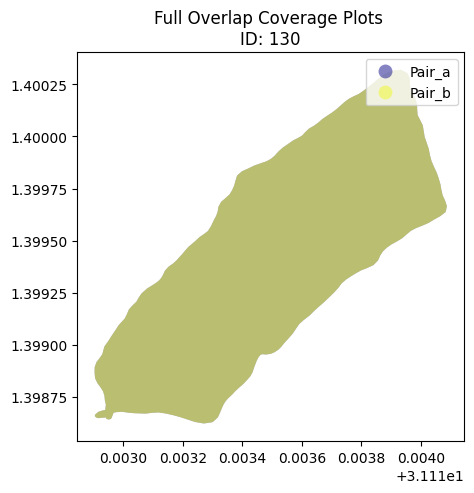

Overlap average percent: 100.0


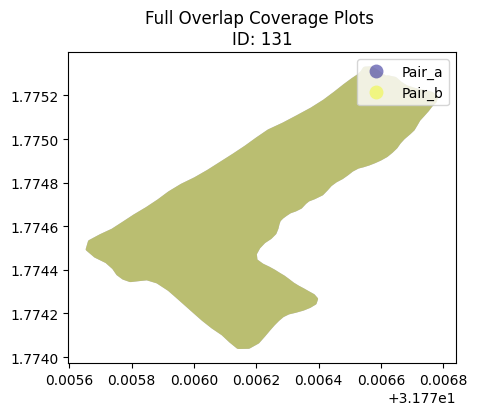

Overlap average percent: 100.0


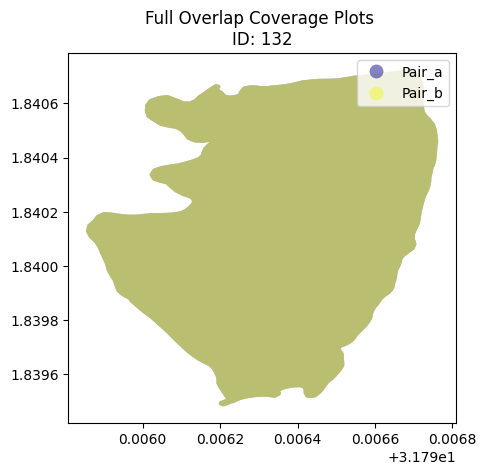

Overlap average percent: 100.0


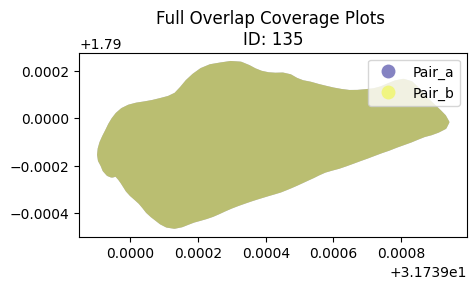

Overlap average percent: 100.0


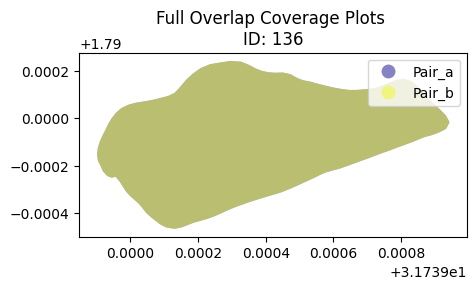

Overlap average percent: 100.0


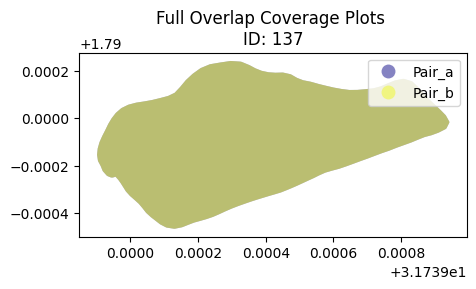

Overlap average percent: 100.0


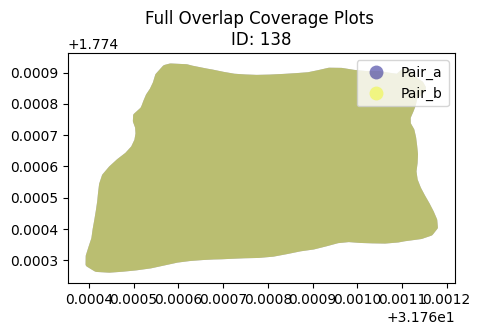

Overlap average percent: 100.0


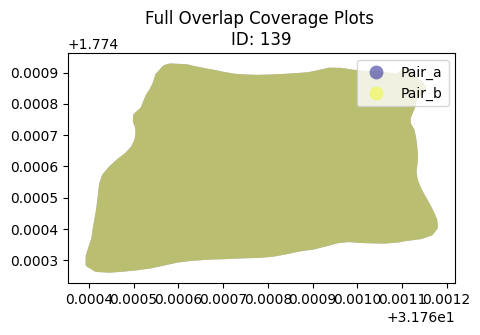

Overlap average percent: 100.0


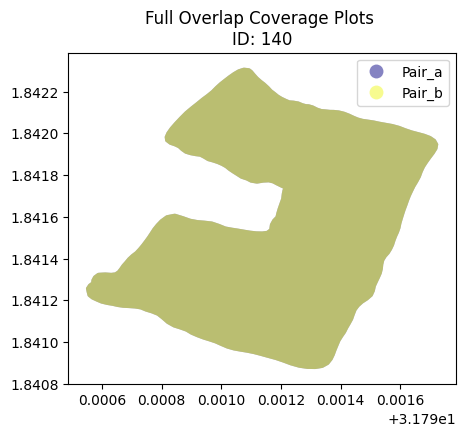

Overlap average percent: 100.0


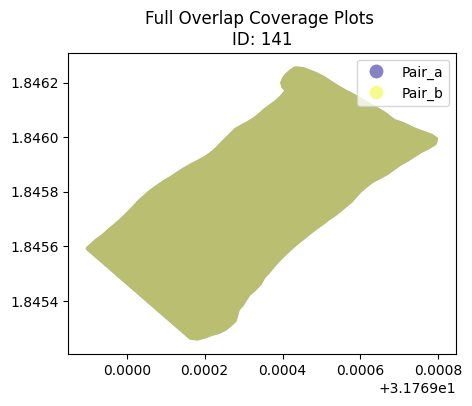

Overlap average percent: 100.0


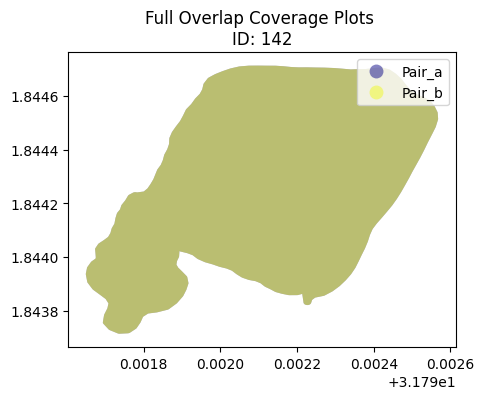

Overlap average percent: 100.0


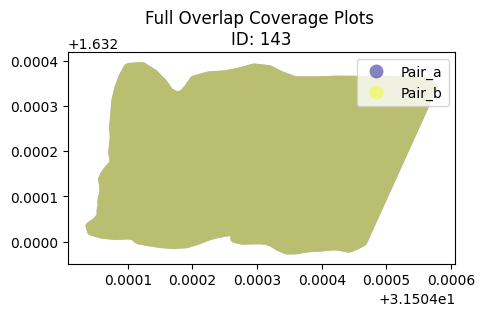

Overlap average percent: 100.0


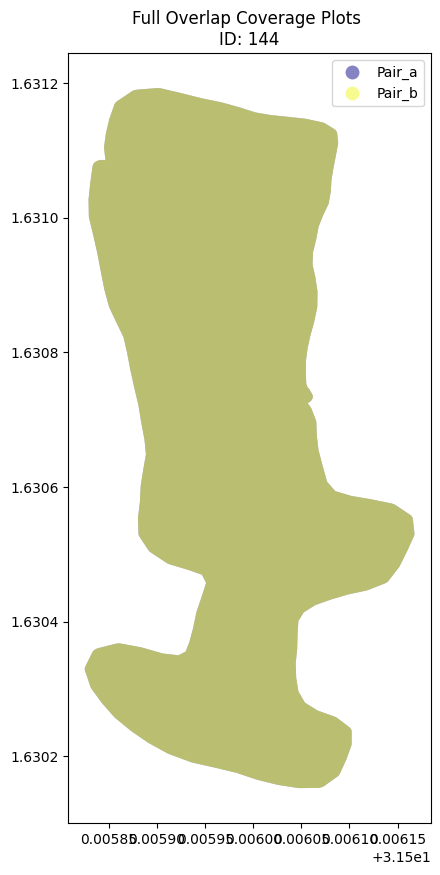

Overlap average percent: 100.0


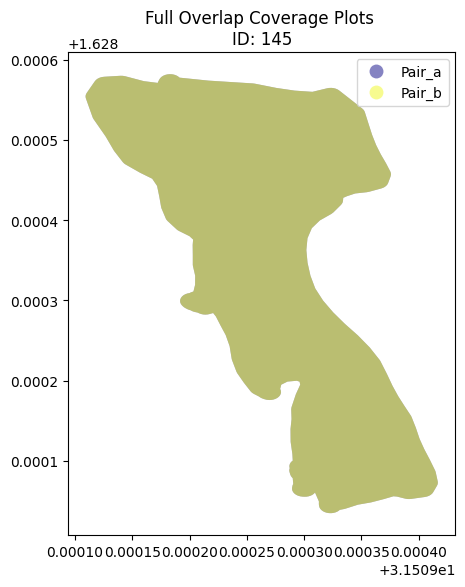

Overlap average percent: 100.0


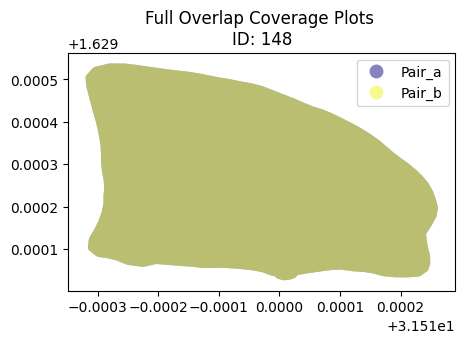

Overlap average percent: 100.0


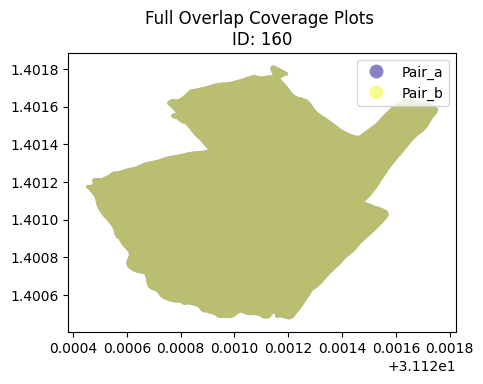

Overlap average percent: 100.0


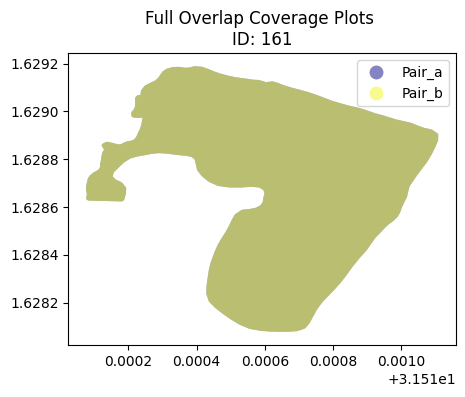

Overlap average percent: 100.0


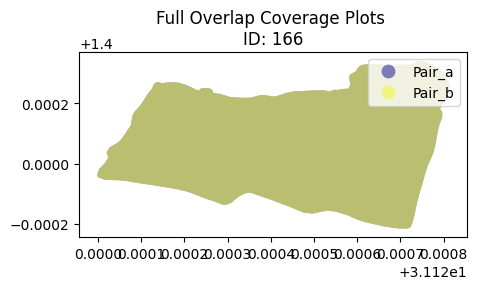

Overlap average percent: 100.0


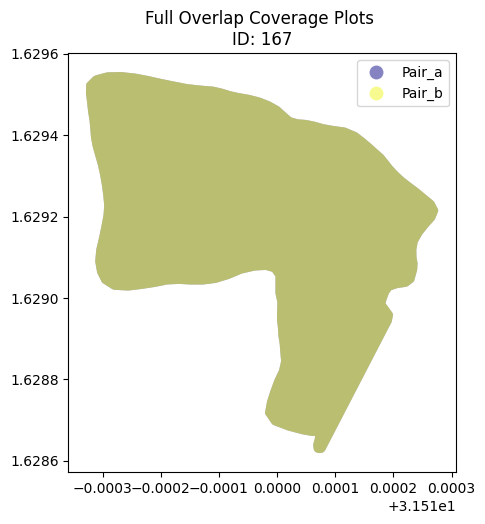

Overlap average percent: 100.0


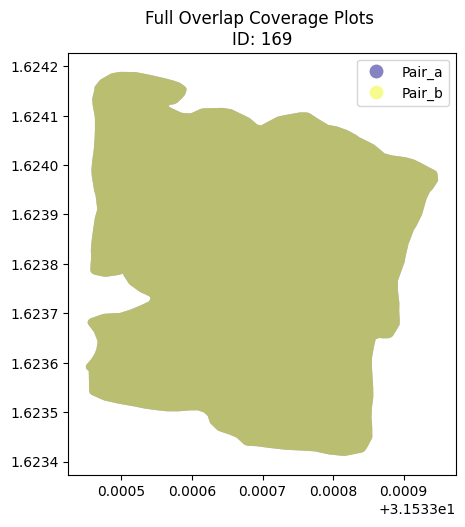

Overlap average percent: 100.0


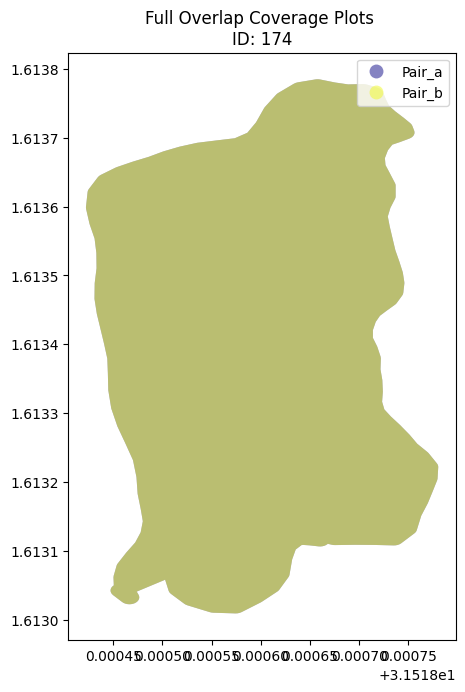

Overlap average percent: 100.0


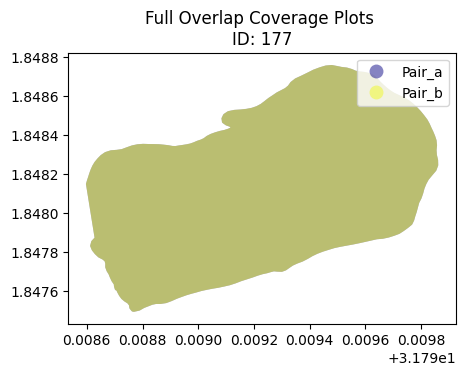

Overlap average percent: 100.0


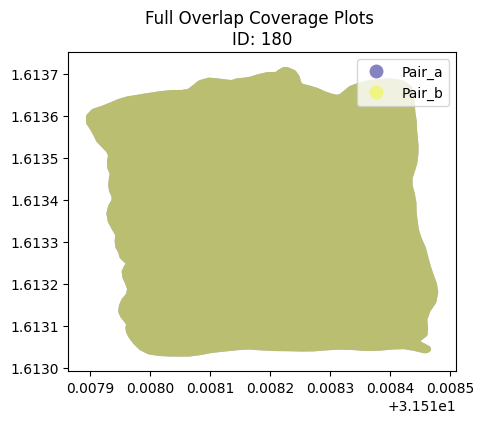

Overlap average percent: 100.0


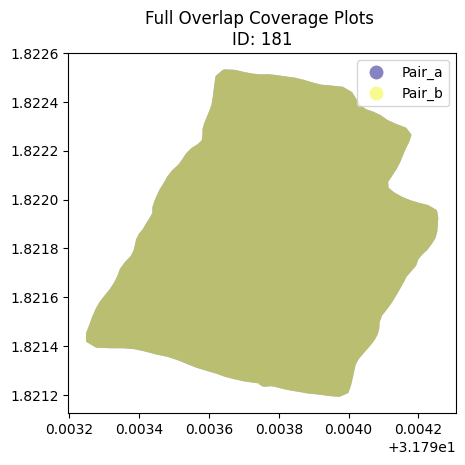

Overlap average percent: 100.0


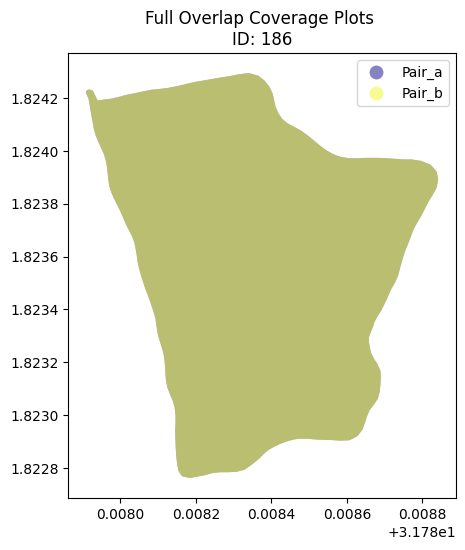

Overlap average percent: 100.0


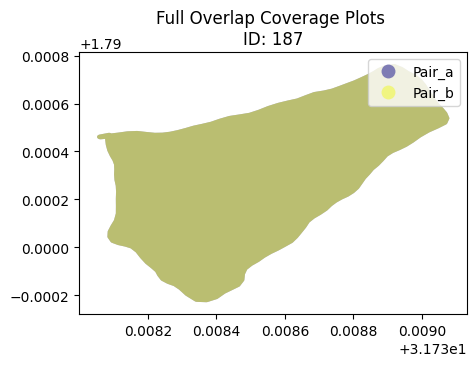

Overlap average percent: 100.0


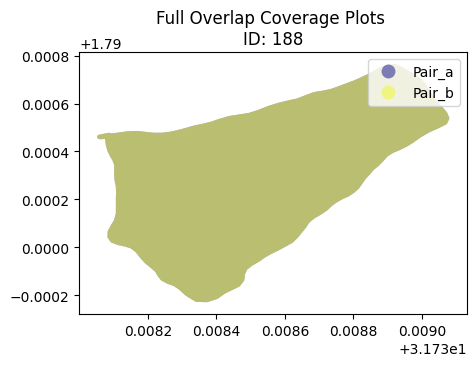

Overlap average percent: 100.0


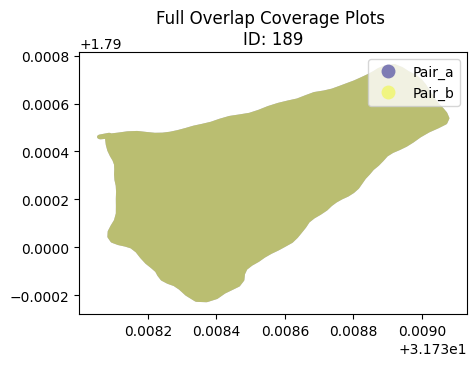

Overlap average percent: 100.0


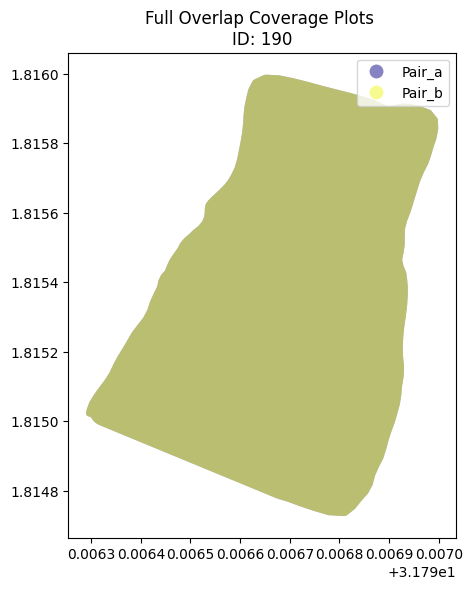

Overlap average percent: 100.0


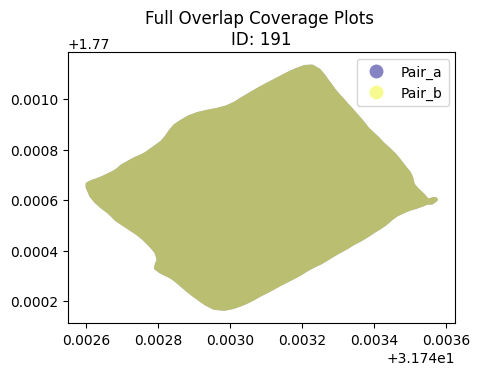

Overlap average percent: 100.0


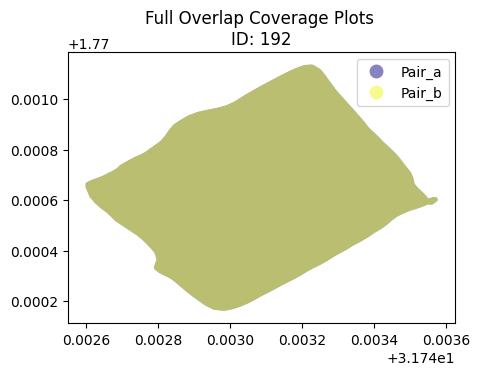

Overlap average percent: 100.0


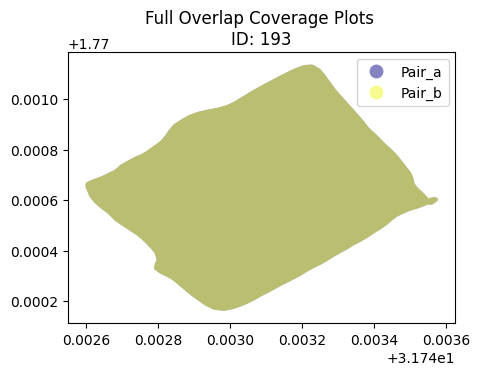

Overlap average percent: 100.0


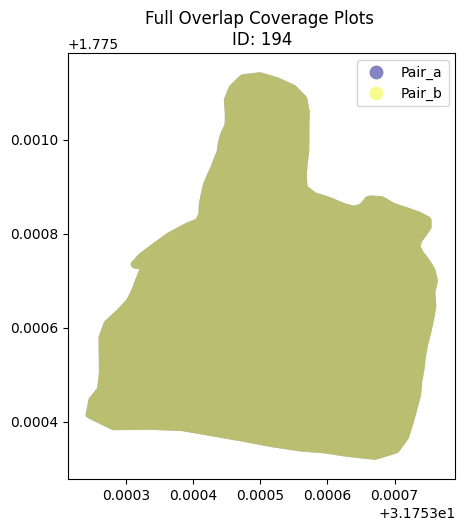

Overlap average percent: 100.0


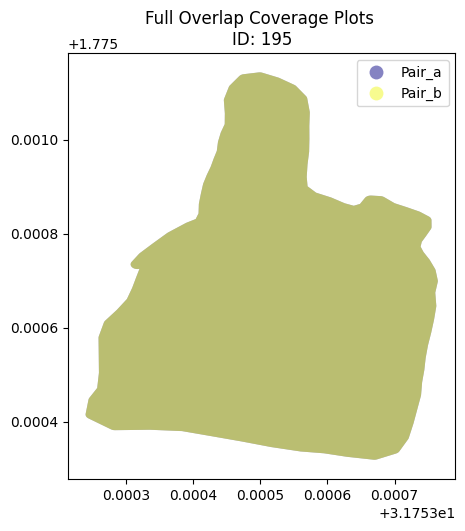

Overlap average percent: 100.0


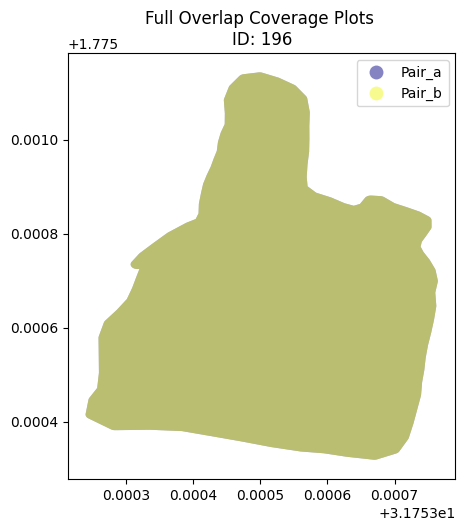

Overlap average percent: 100.0


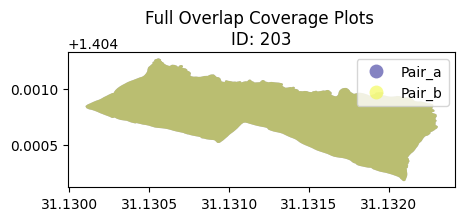

Overlap average percent: 100.0


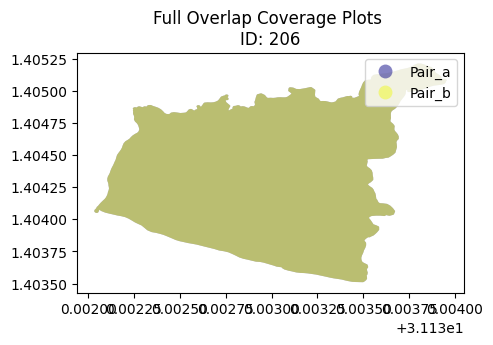

Overlap average percent: 100.0


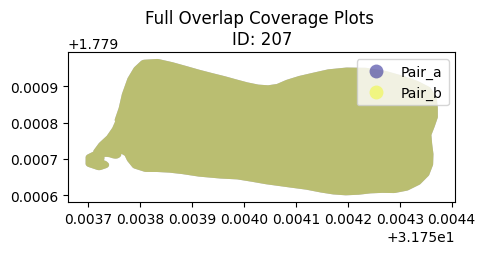

Overlap average percent: 100.0


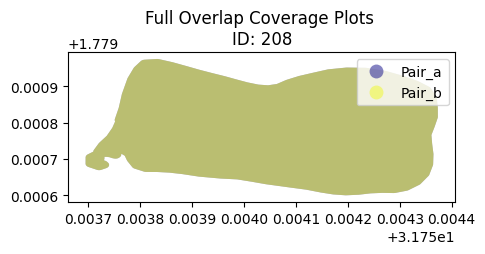

Overlap average percent: 100.0


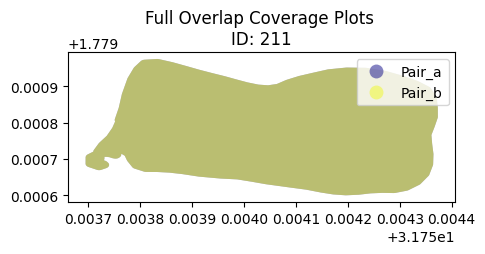

Overlap average percent: 100.0


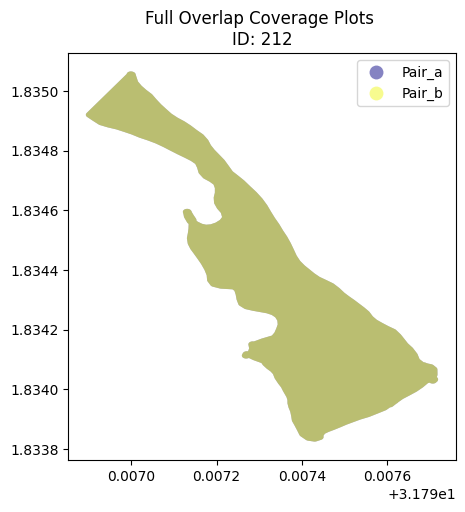

Overlap average percent: 100.0


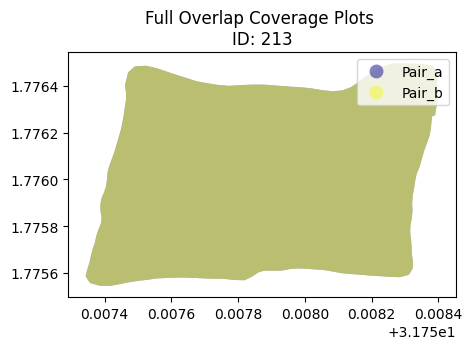

Overlap average percent: 100.0


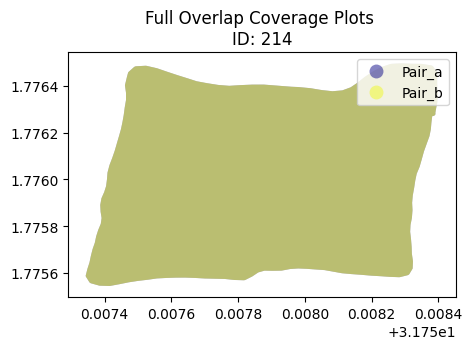

Overlap average percent: 100.0


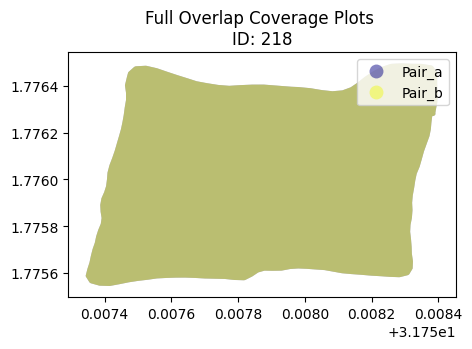

Overlap average percent: 100.0


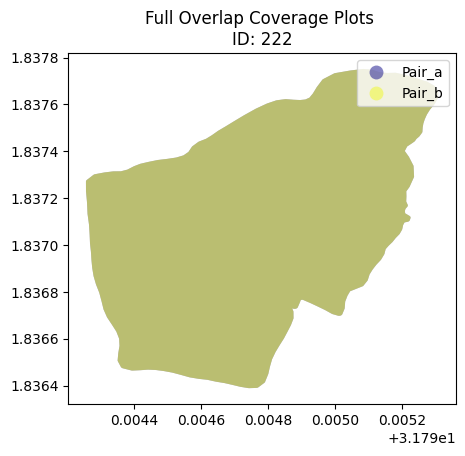

Overlap average percent: 100.0


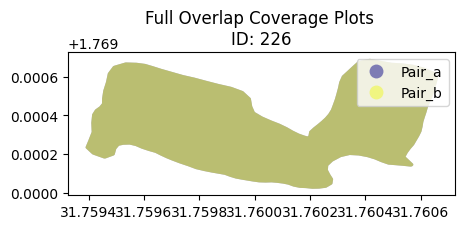

Overlap average percent: 100.0


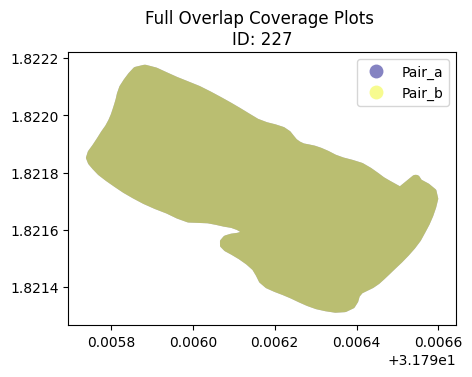

Overlap average percent: 100.0


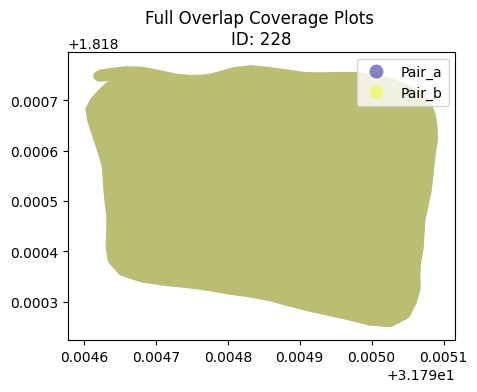

Overlap average percent: 100.0


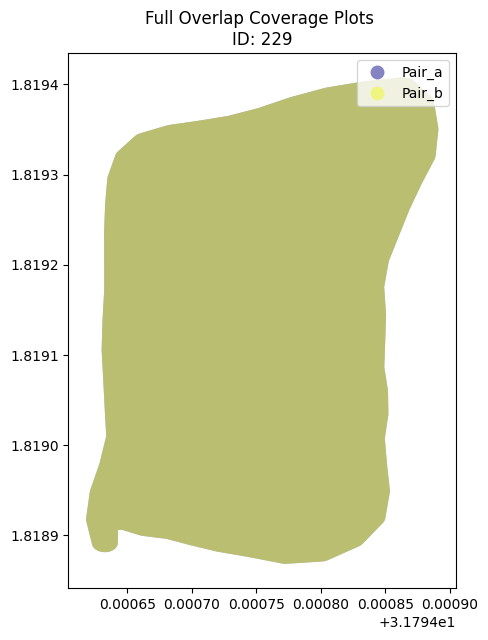

Overlap average percent: 100.0


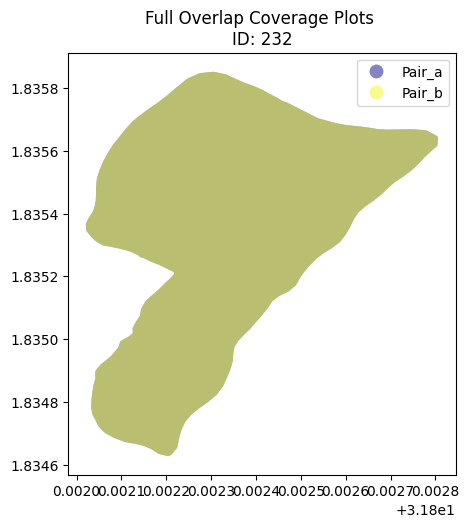

Overlap average percent: 100.0


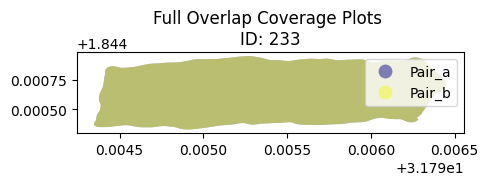

Overlap average percent: 100.0


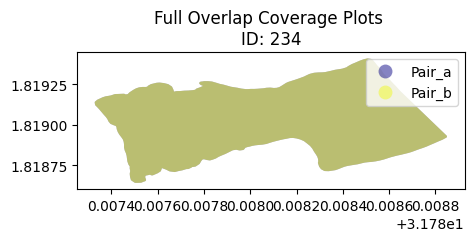

Overlap average percent: 100.0


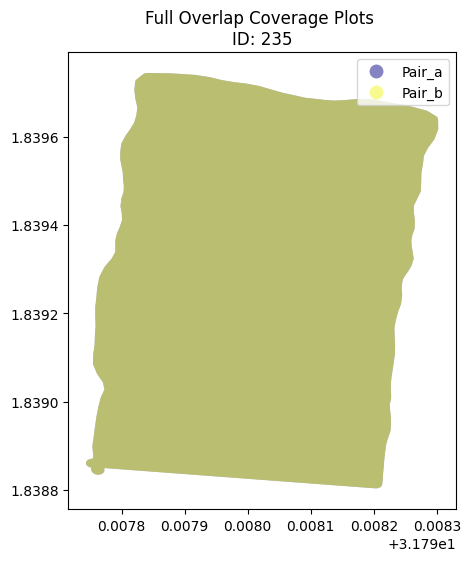

Overlap average percent: 100.0


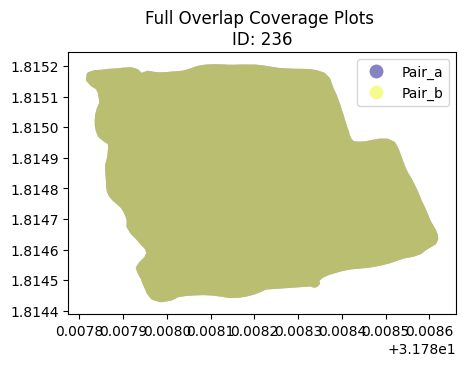

Overlap average percent: 100.0


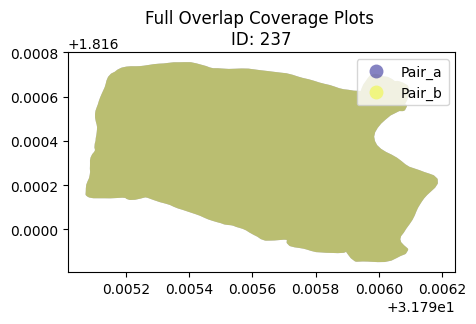

Overlap average percent: 100.0


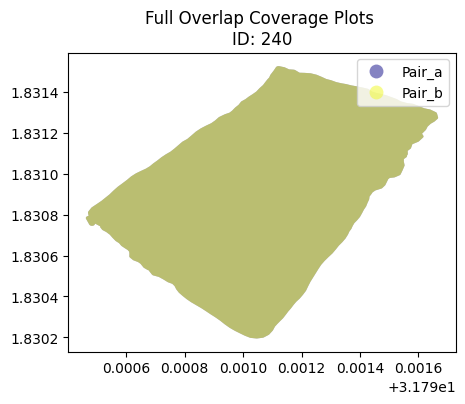

Overlap average percent: 100.0


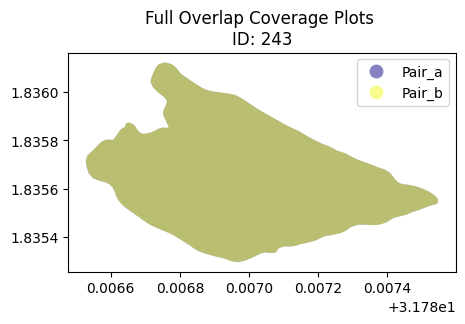

Overlap average percent: 100.0


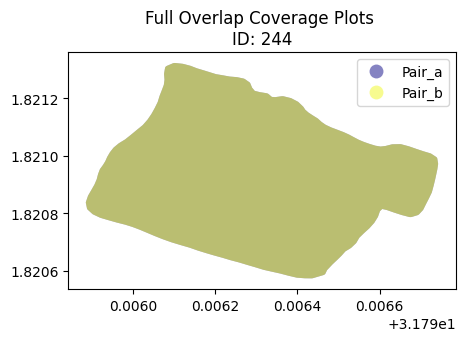

Overlap average percent: 100.0


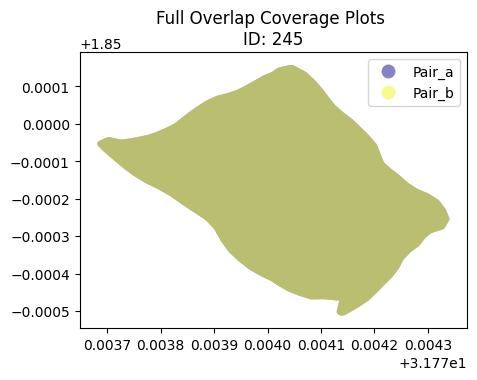

Overlap average percent: 100.0


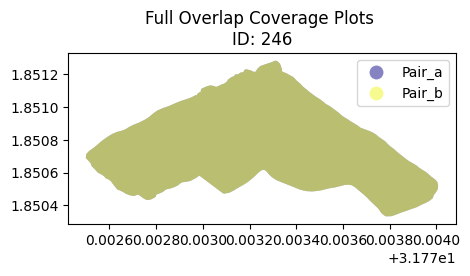

Overlap average percent: 100.0


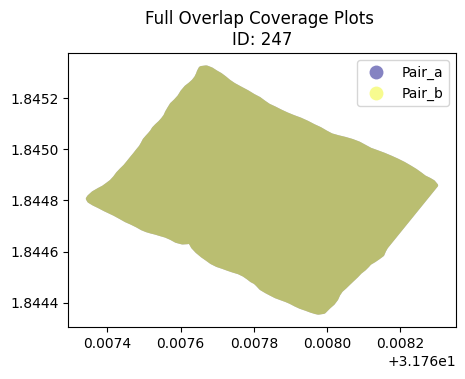

Overlap average percent: 100.0


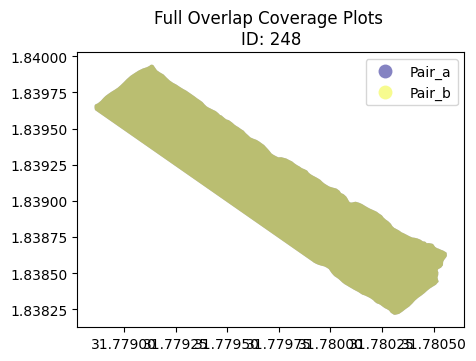

Overlap average percent: 100.0


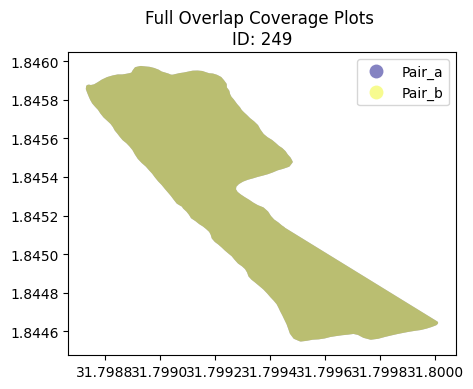

Overlap average percent: 100.0


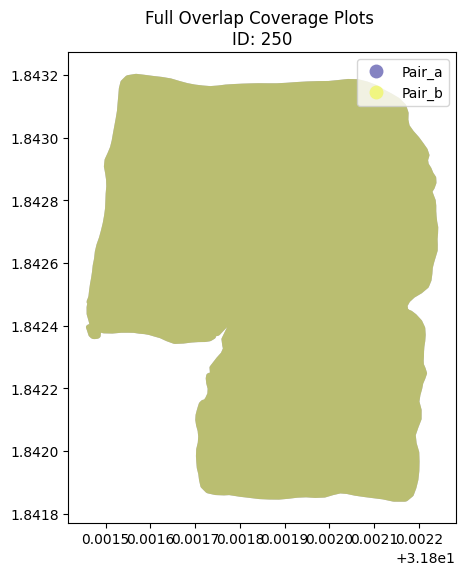

Overlap average percent: 100.0


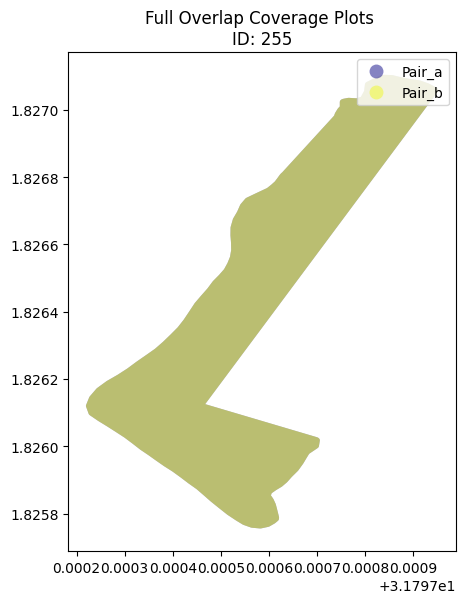

Overlap average percent: 100.0


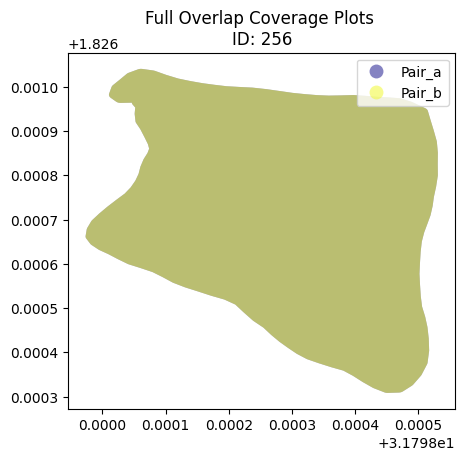

Overlap average percent: 100.0


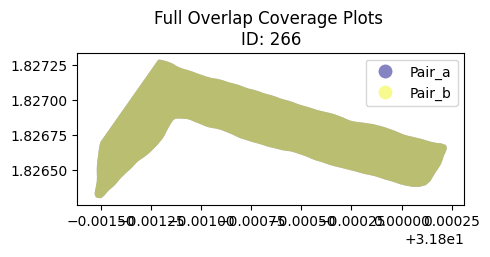

Overlap average percent: 100.0


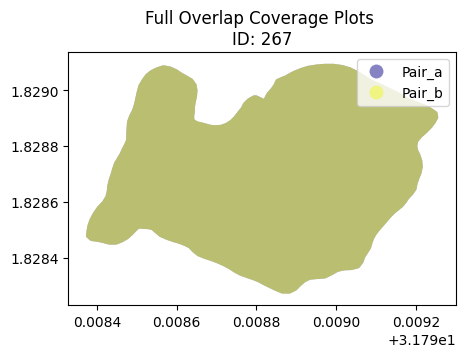

Overlap average percent: 100.0


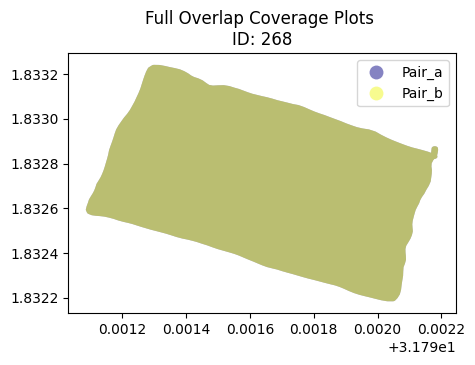

Overlap average percent: 100.0


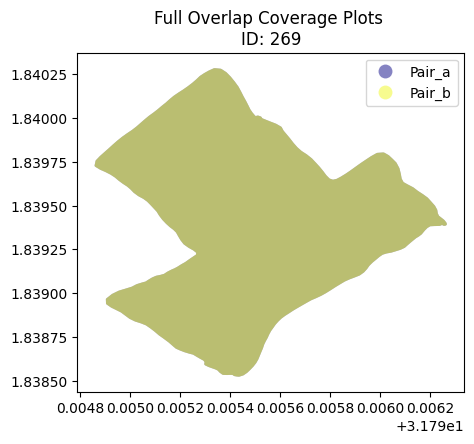

Overlap average percent: 100.0


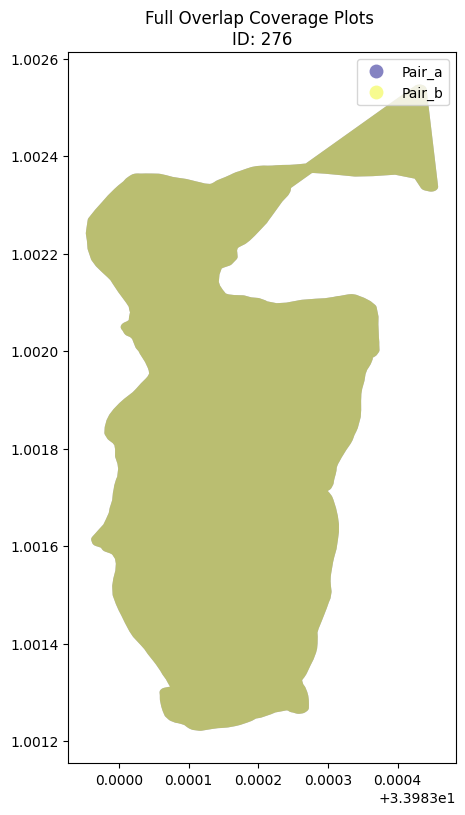

Overlap average percent: 100.0


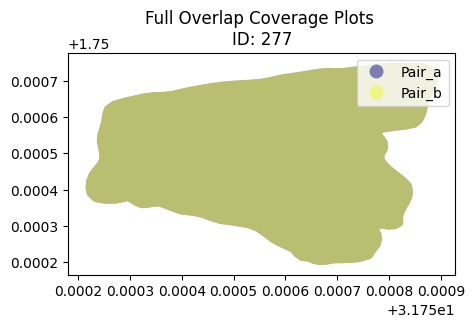

Overlap average percent: 100.0


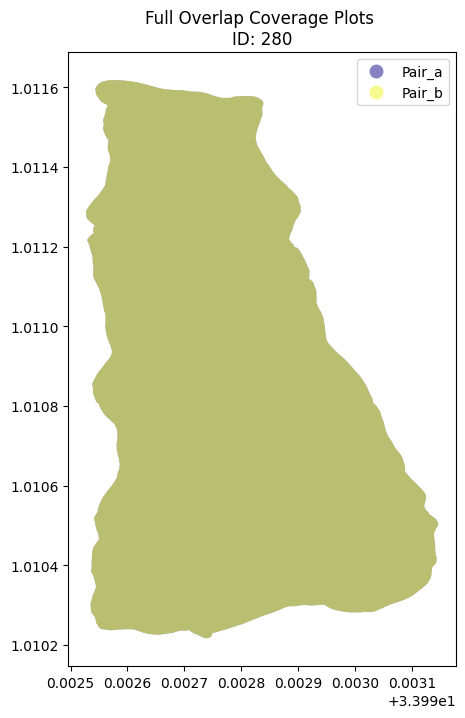

Overlap average percent: 100.0


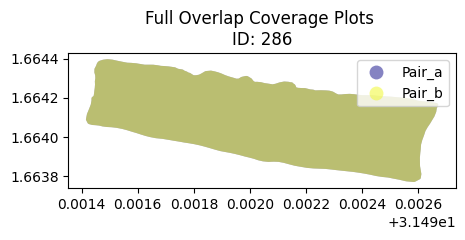

Overlap average percent: 100.0


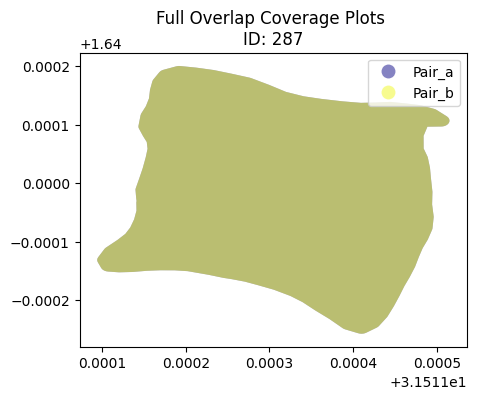

Overlap average percent: 100.0


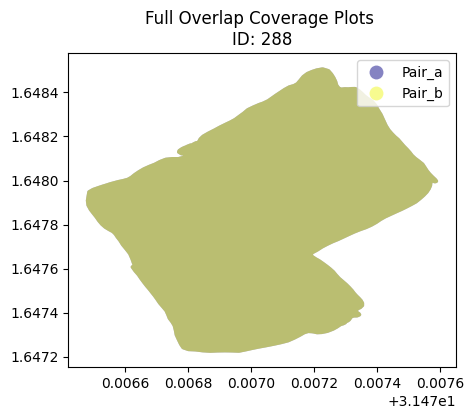

Overlap average percent: 100.0


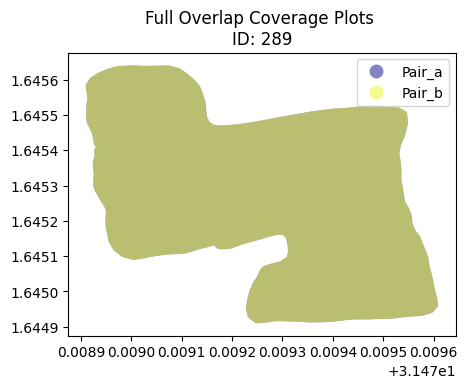

Overlap average percent: 100.0


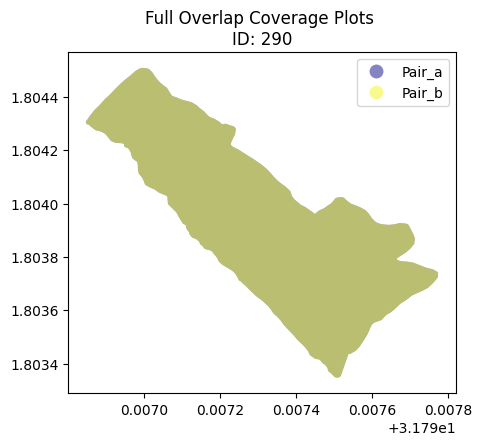

Overlap average percent: 100.0


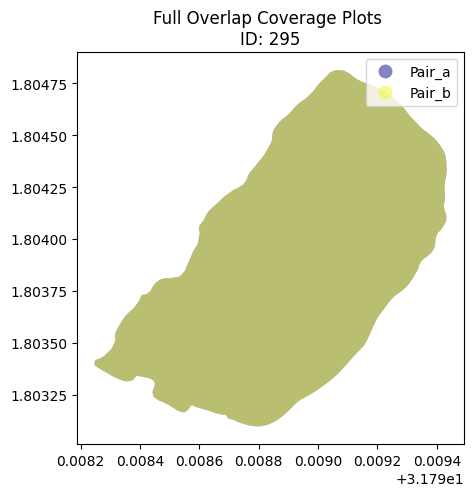

Overlap average percent: 100.0


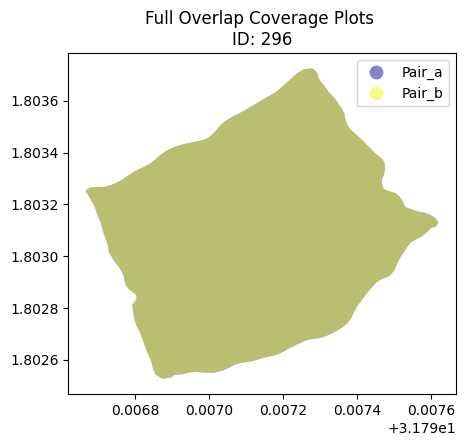

Overlap average percent: 100.0


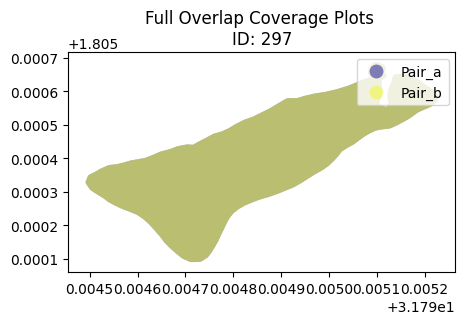

Overlap average percent: 100.0


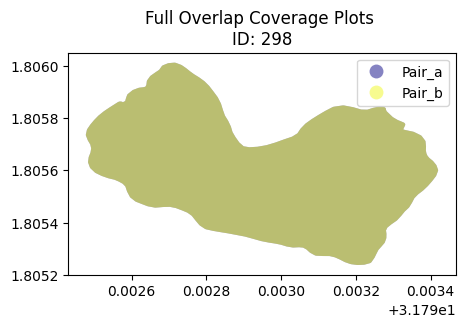

Overlap average percent: 100.0


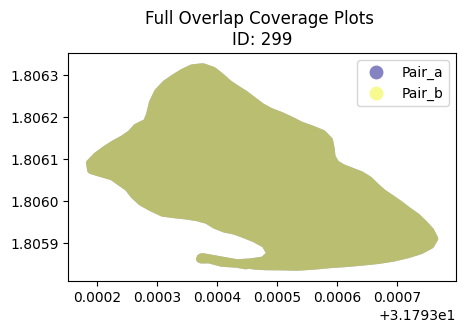

Overlap average percent: 100.0


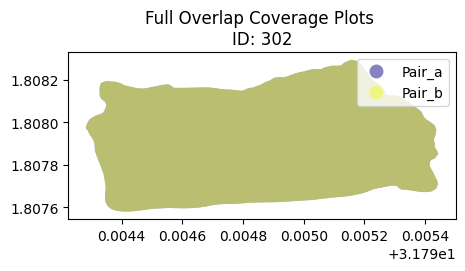

Overlap average percent: 100.0


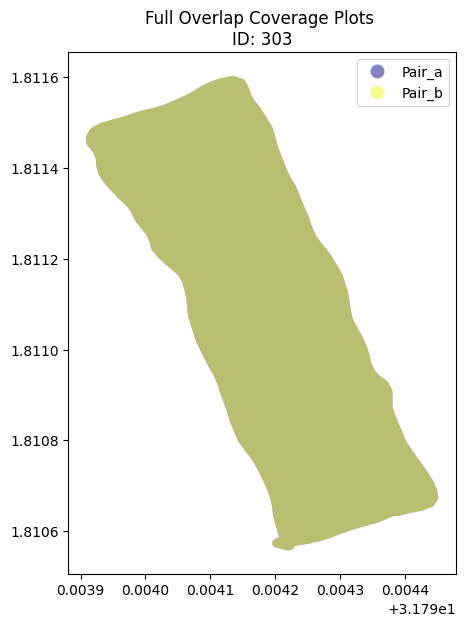

Overlap average percent: 100.0


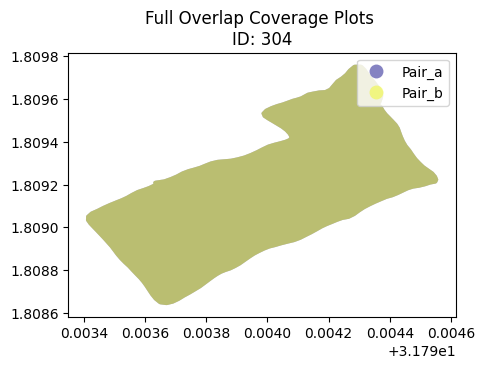

Overlap average percent: 100.0


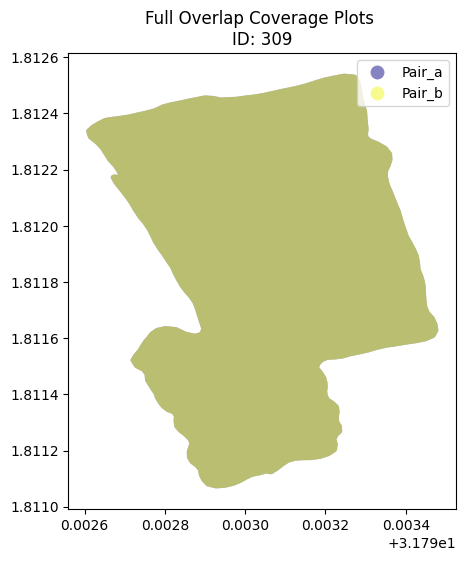

Overlap average percent: 100.0


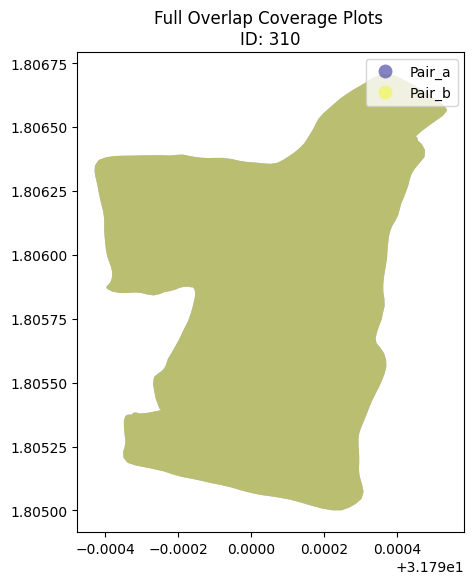

Overlap average percent: 100.0


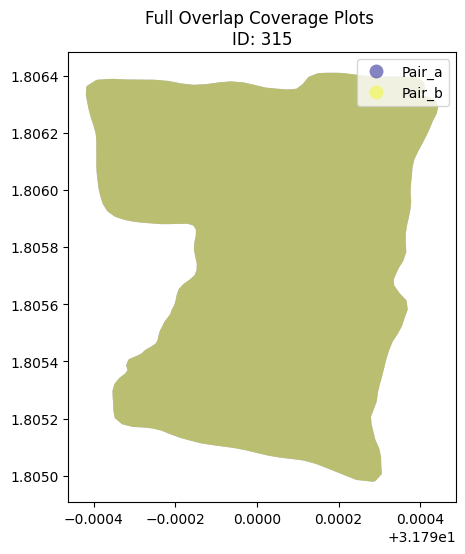

Overlap average percent: 100.0


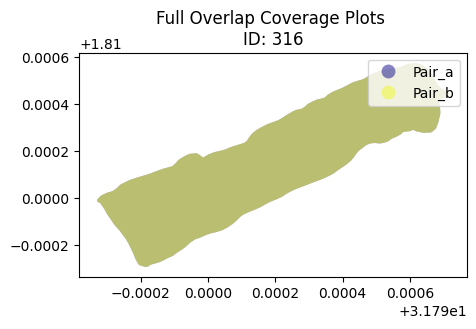

Overlap average percent: 100.0


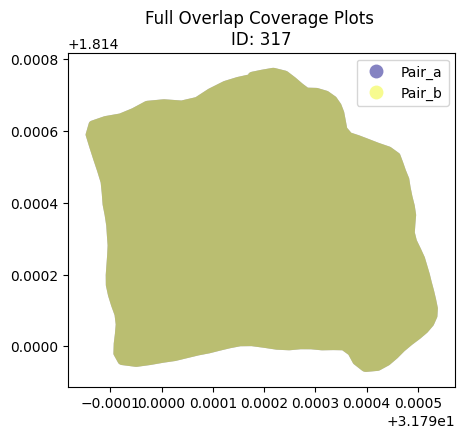

Overlap average percent: 100.0


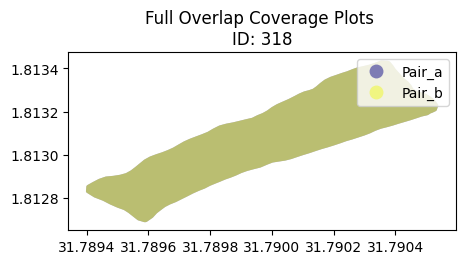

Overlap average percent: 100.0


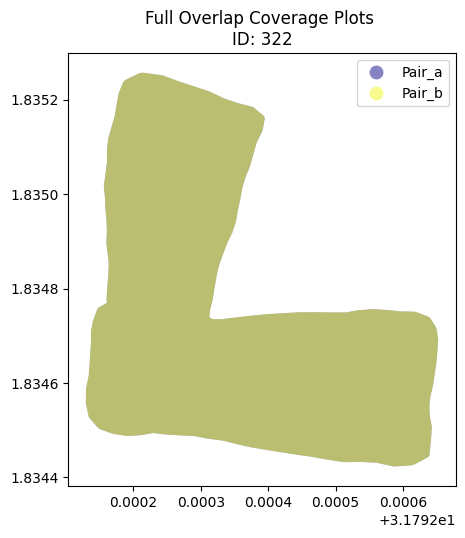

Overlap average percent: 100.0


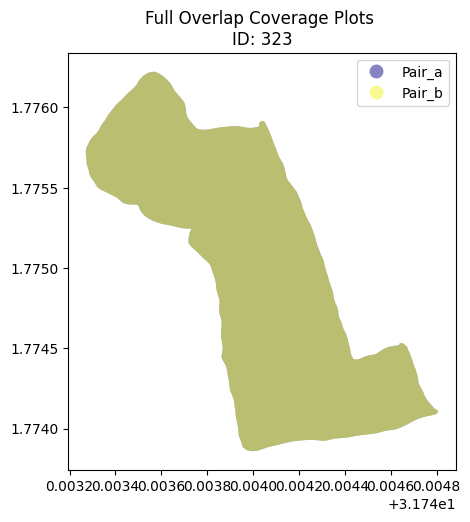

Overlap average percent: 100.0


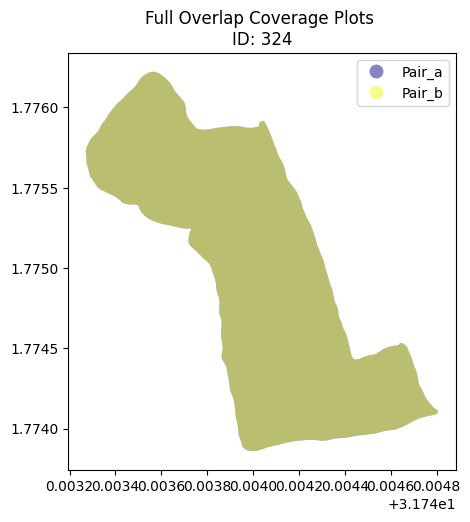

Overlap average percent: 100.0


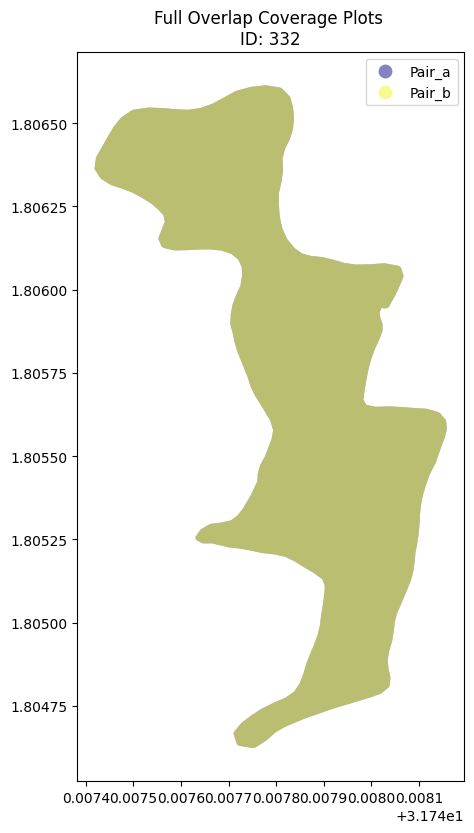

Overlap average percent: 100.0


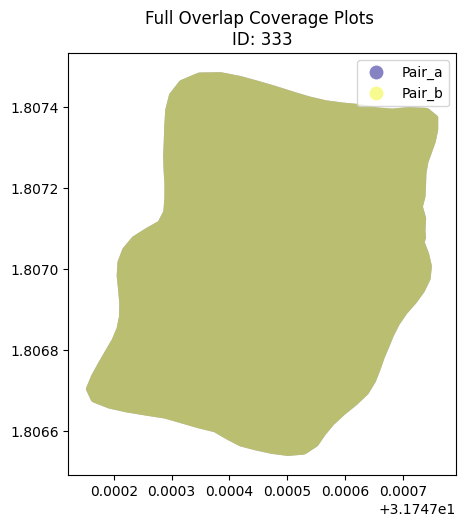

Overlap average percent: 100.0


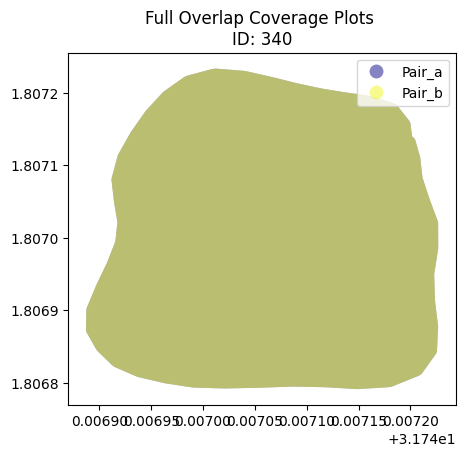

Overlap average percent: 100.0


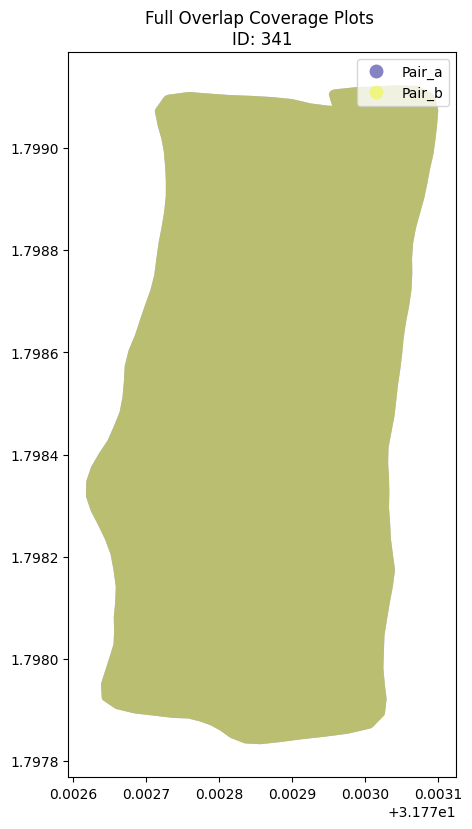

Overlap average percent: 100.0


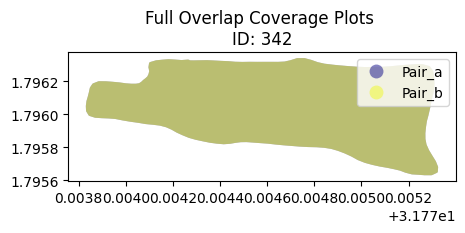

Overlap average percent: 100.0


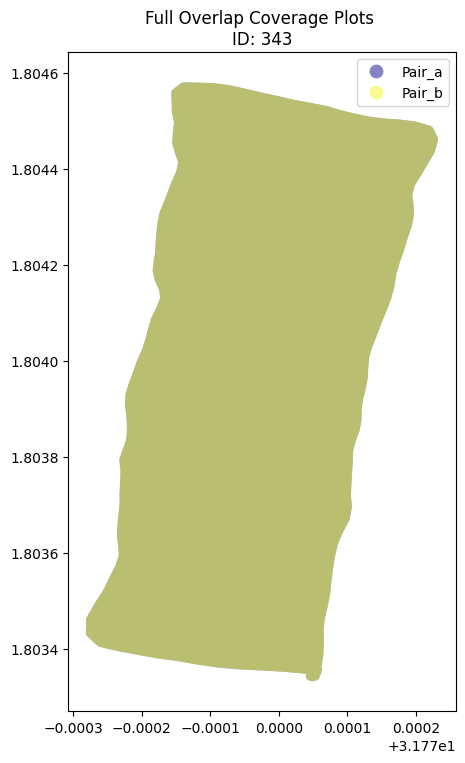

Overlap average percent: 100.0


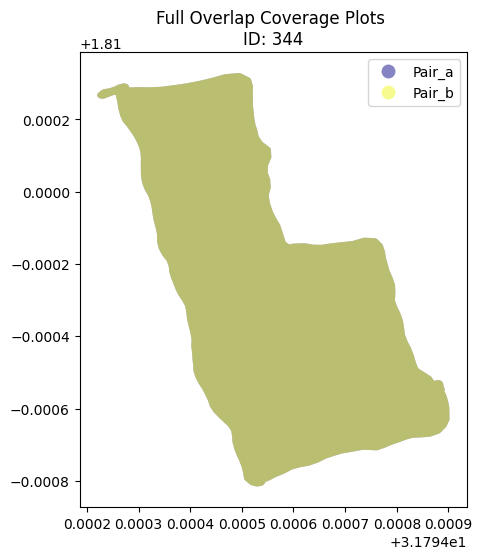

Overlap average percent: 100.0


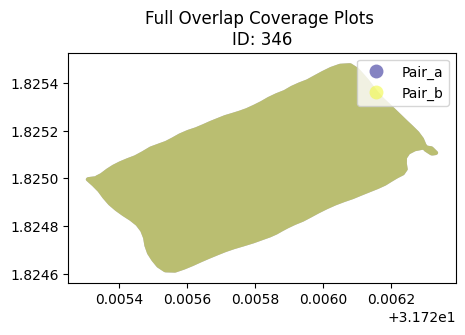

Overlap average percent: 100.0


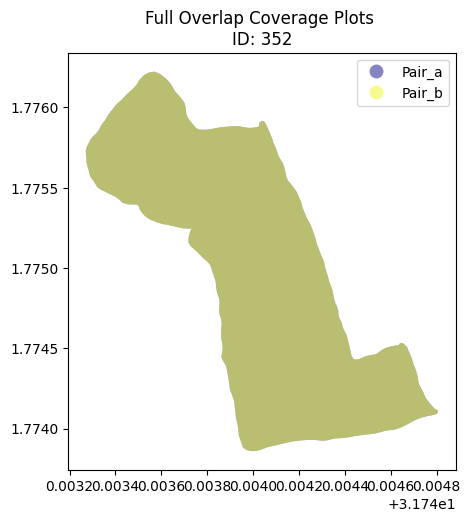

Overlap average percent: 100.0


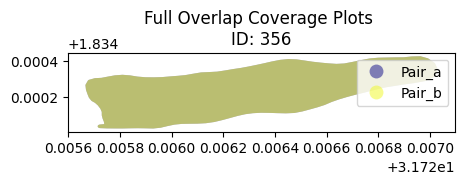

Overlap average percent: 100.0


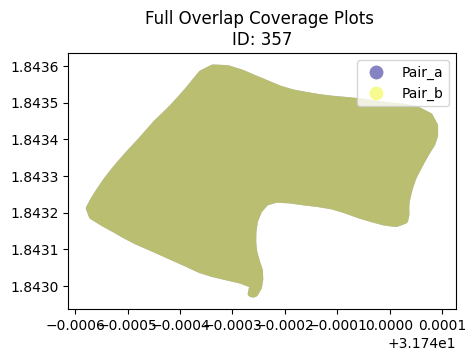

Overlap average percent: 100.0


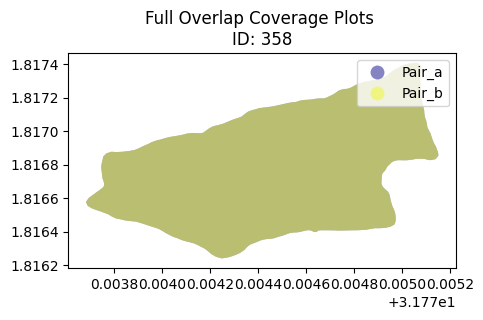

Overlap average percent: 100.0


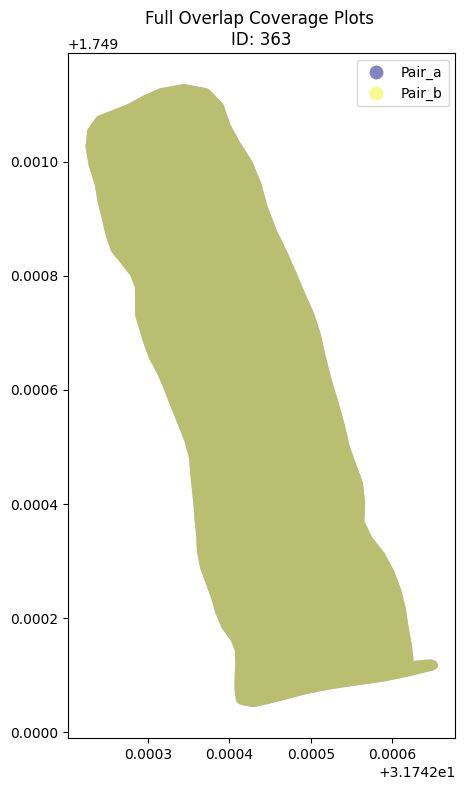

Overlap average percent: 100.0


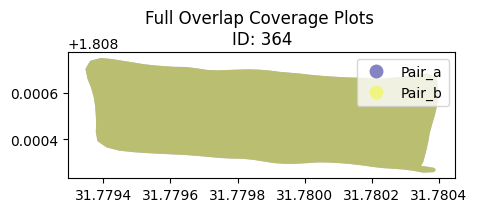

Overlap average percent: 100.0


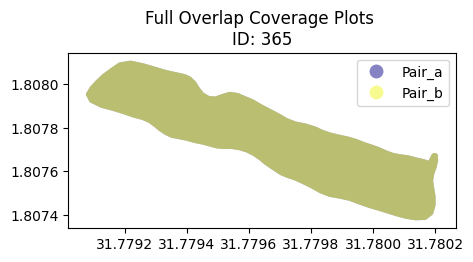

Overlap average percent: 100.0


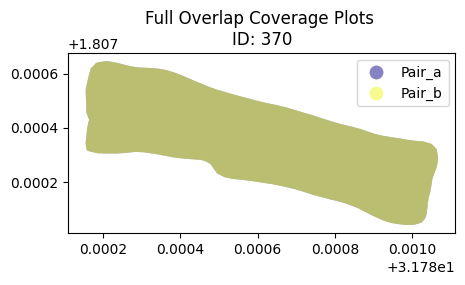

Overlap average percent: 100.0


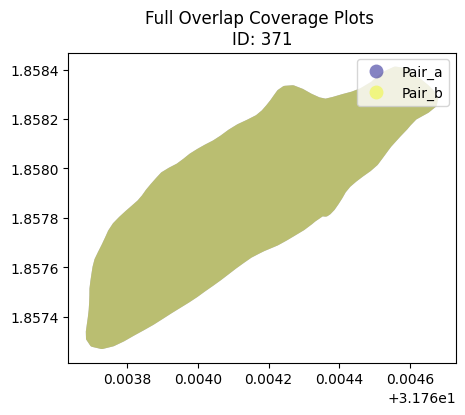

Overlap average percent: 100.0


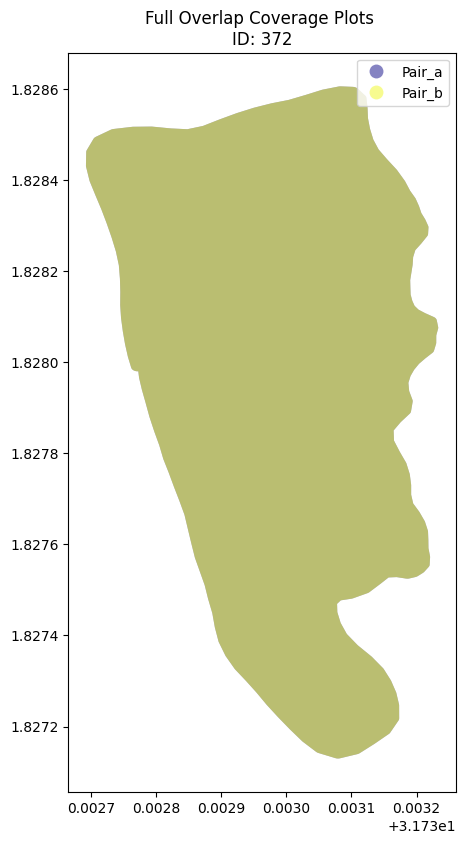

Overlap average percent: 100.0


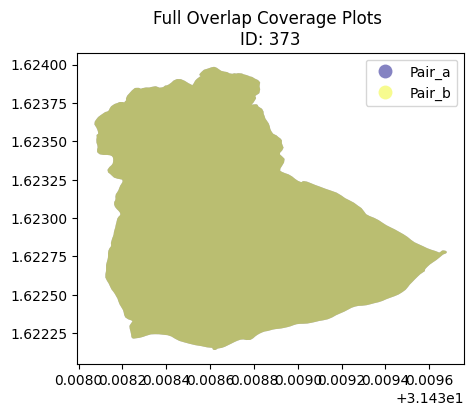

Overlap average percent: 100.0


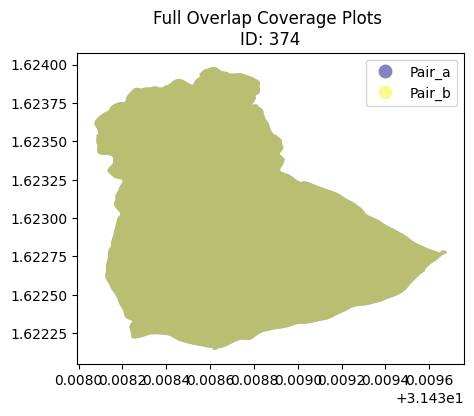

Overlap average percent: 100.0


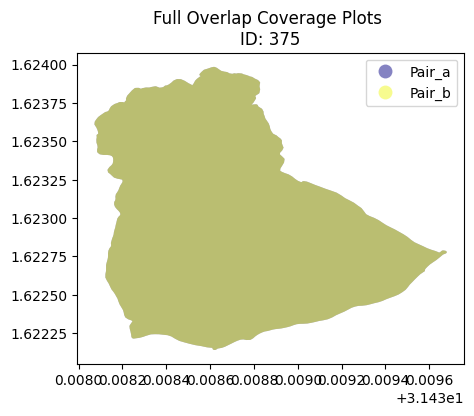

Overlap average percent: 100.0


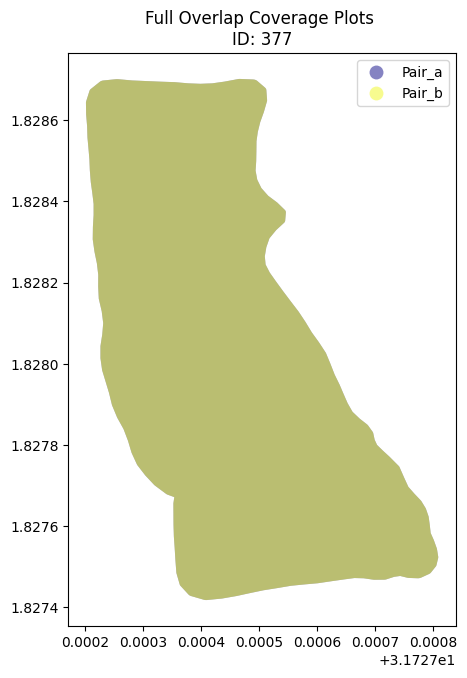

Overlap average percent: 100.0


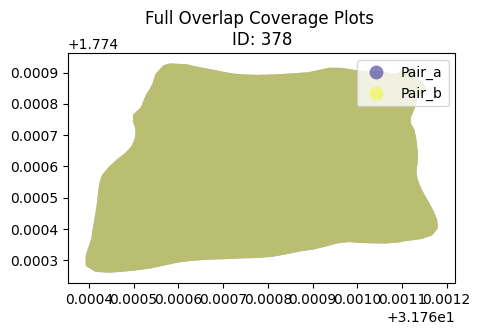

Overlap average percent: 100.0


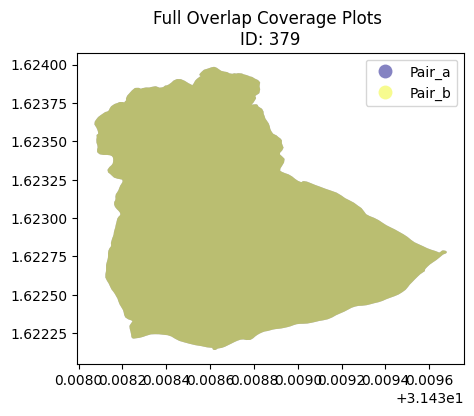

Overlap average percent: 100.0


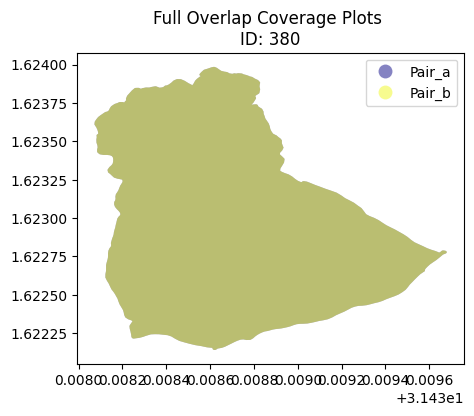

Overlap average percent: 100.0


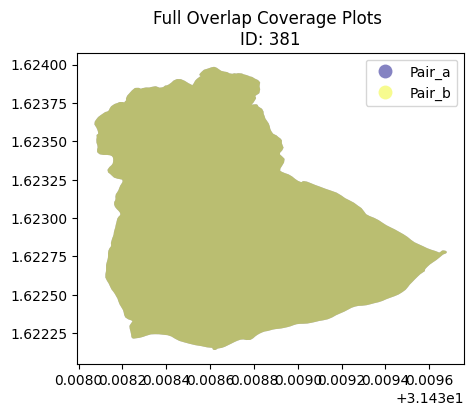

Overlap average percent: 100.0


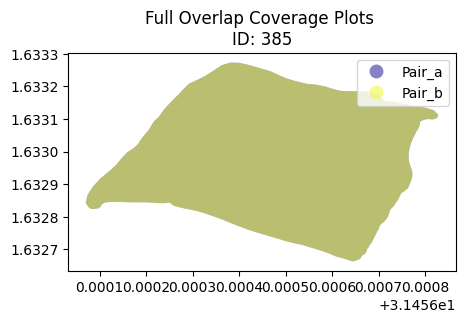

Overlap average percent: 100.0


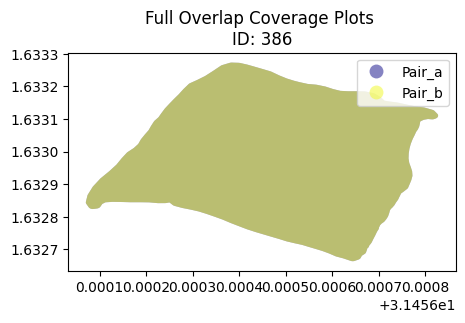

Overlap average percent: 100.0


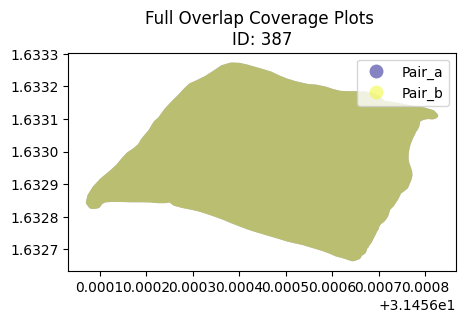

Overlap average percent: 100.0


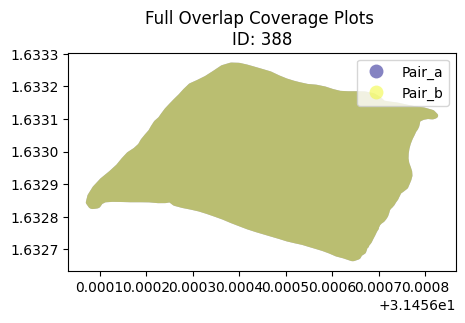

Overlap average percent: 100.0


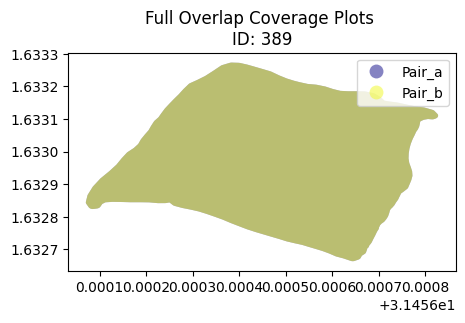

Overlap average percent: 100.0


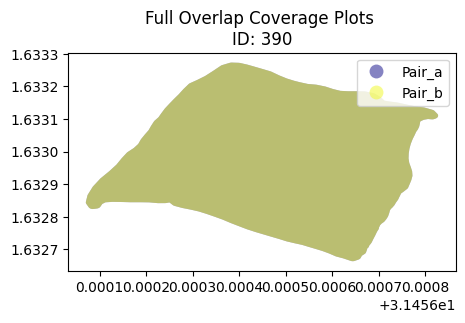

Overlap average percent: 100.0


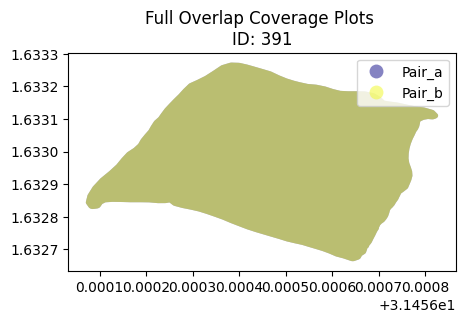

Overlap average percent: 100.0


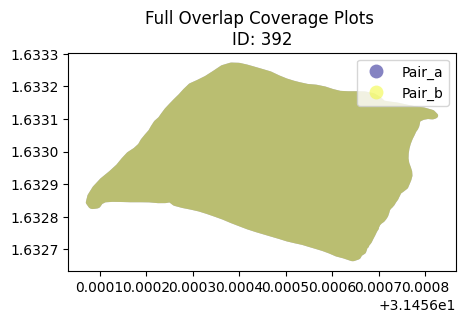

Overlap average percent: 100.0


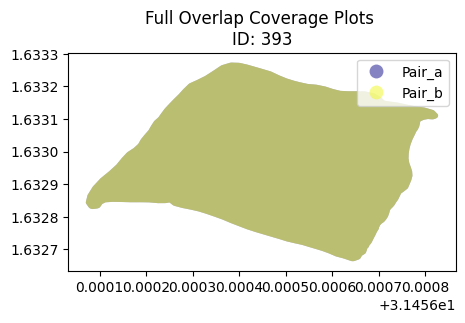

Overlap average percent: 100.0


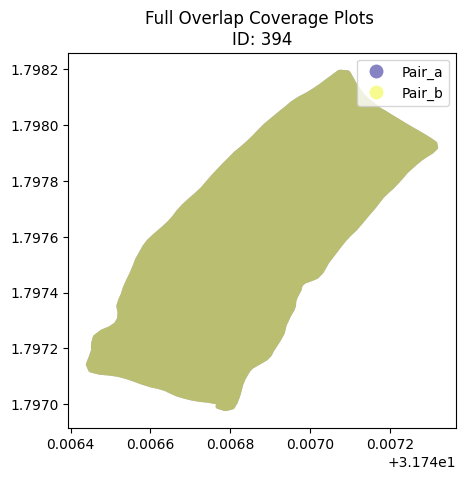

Overlap average percent: 100.0


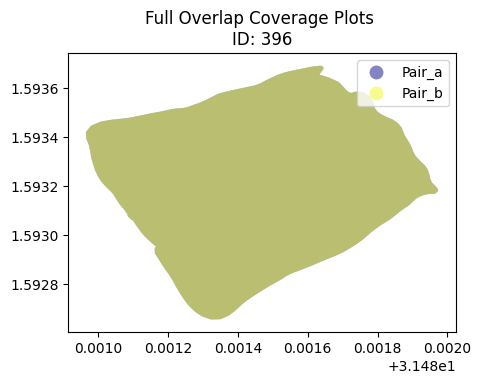

Overlap average percent: 100.0


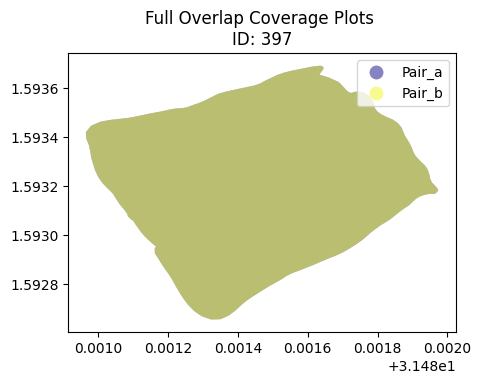

Overlap average percent: 100.0


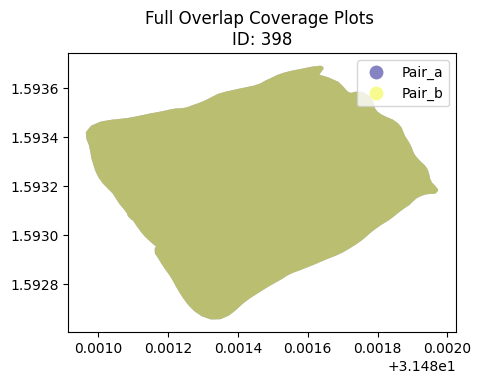

Overlap average percent: 100.0


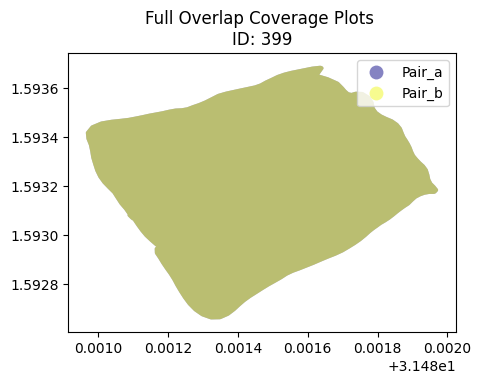

Overlap average percent: 100.0


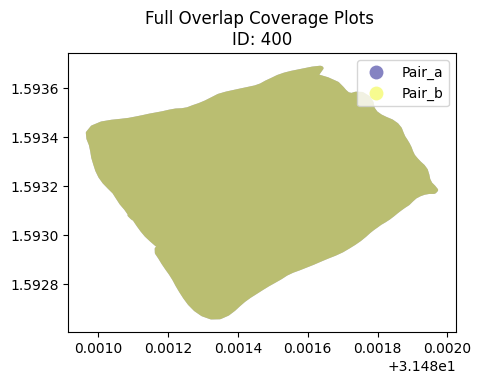

Overlap average percent: 100.0


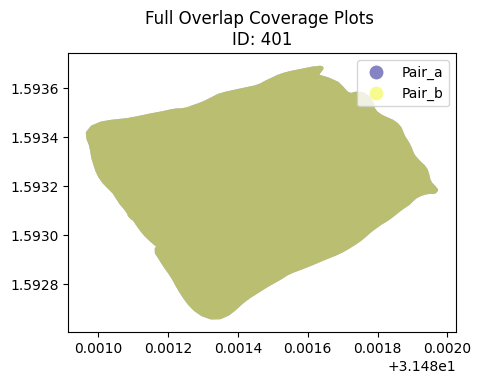

Overlap average percent: 100.0


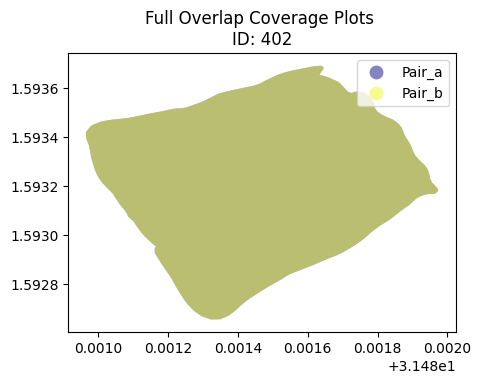

Overlap average percent: 100.0


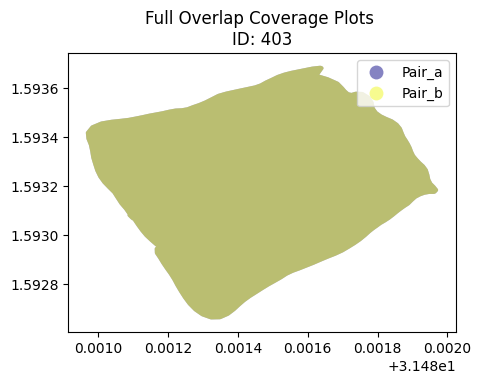

Overlap average percent: 100.0


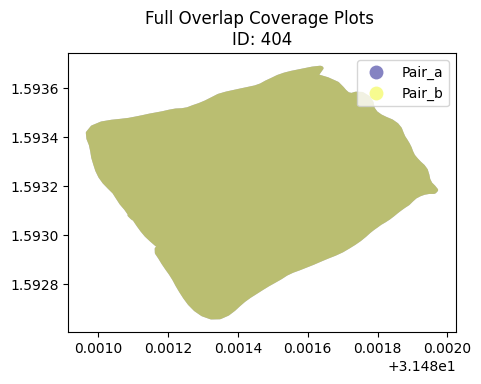

Overlap average percent: 100.0


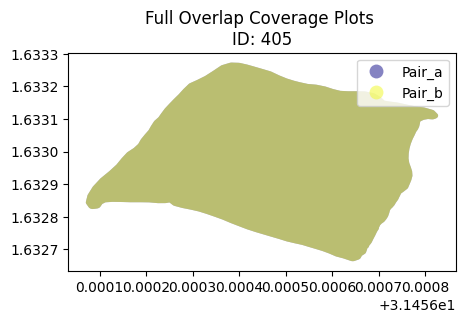

Overlap average percent: 100.0


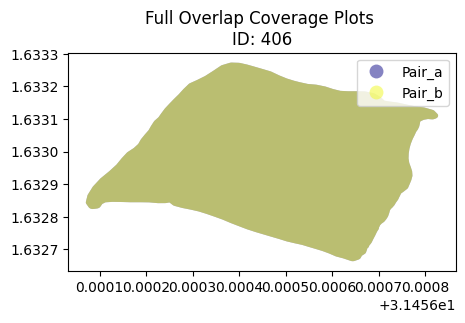

Overlap average percent: 100.0


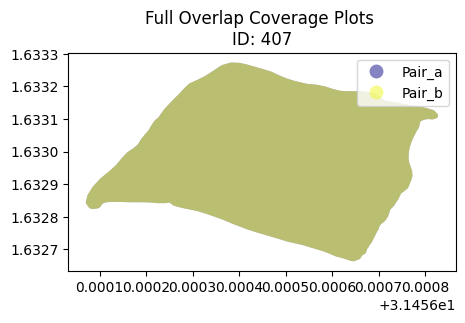

Overlap average percent: 100.0


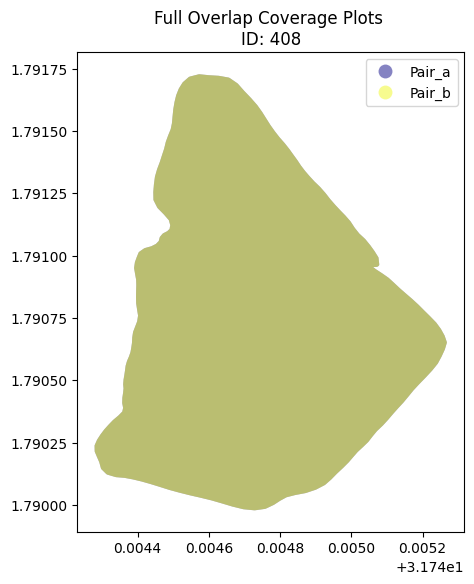

Overlap average percent: 100.0


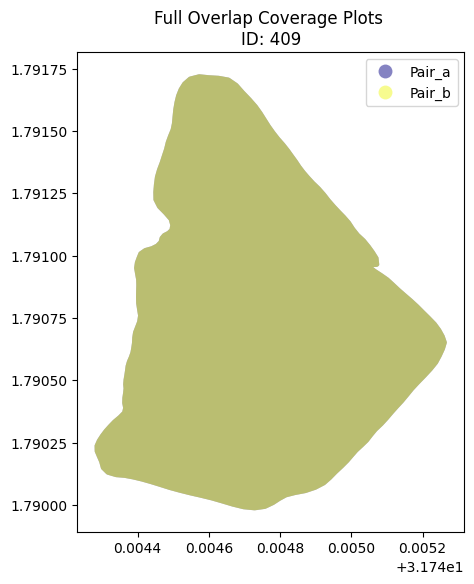

Overlap average percent: 100.0


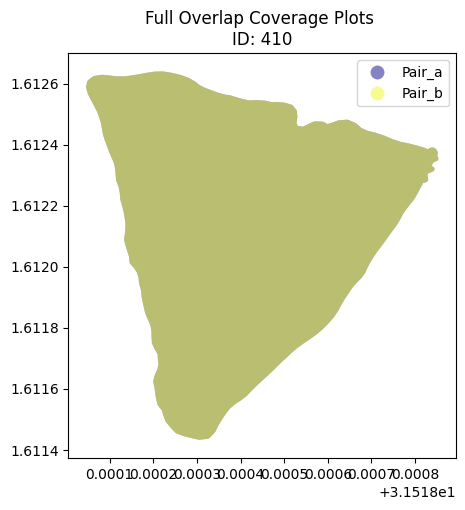

Overlap average percent: 100.0


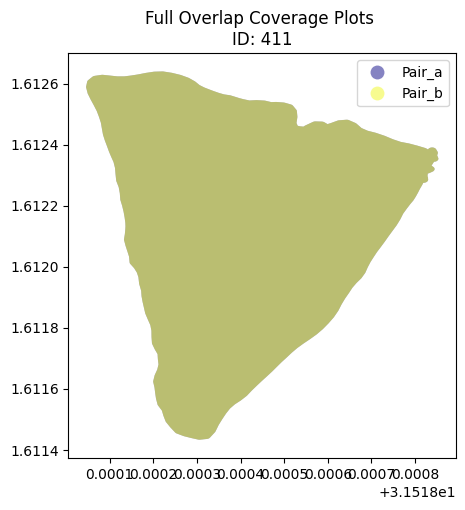

Overlap average percent: 100.0


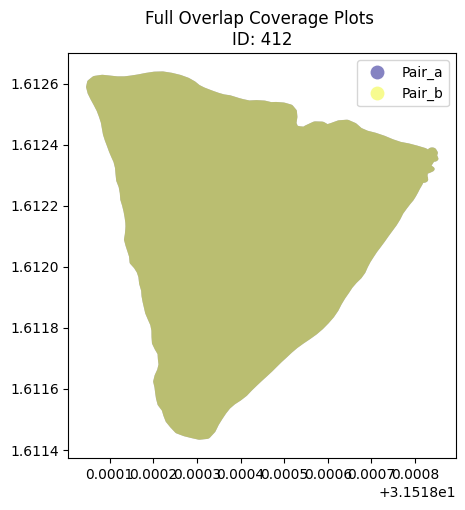

Overlap average percent: 100.0


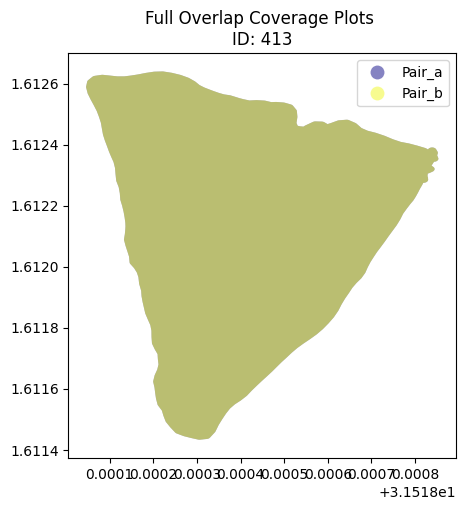

Overlap average percent: 100.0


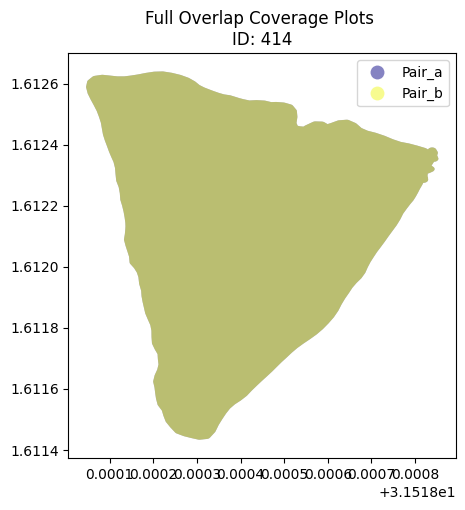

Overlap average percent: 100.0


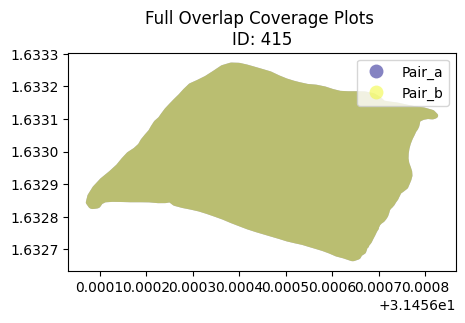

Overlap average percent: 100.0


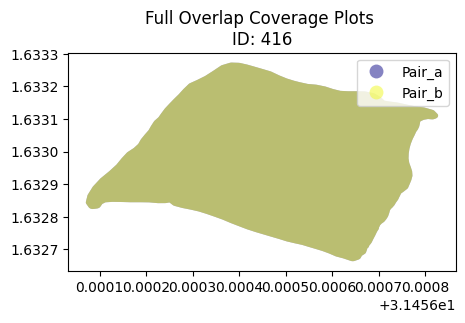

Overlap average percent: 100.0


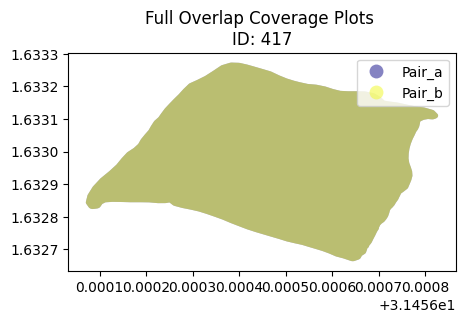

Overlap average percent: 100.0


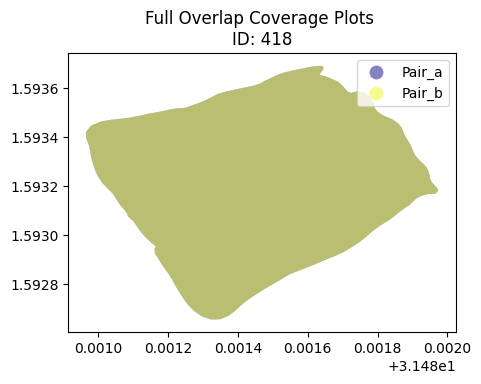

Overlap average percent: 100.0


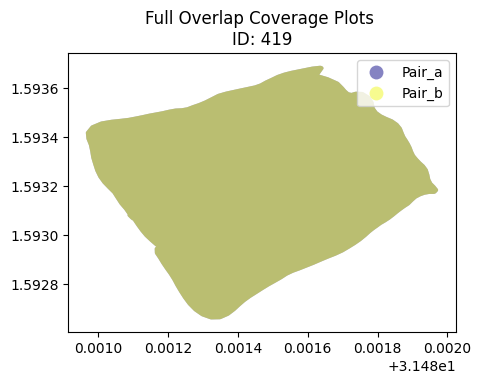

Overlap average percent: 100.0


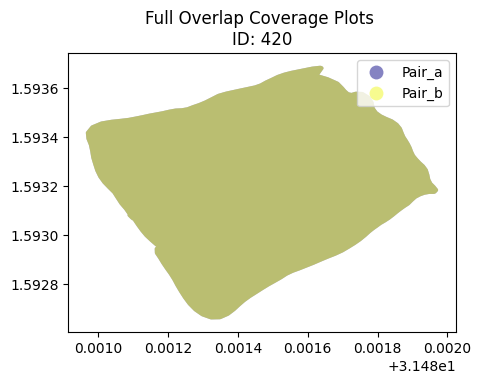

Overlap average percent: 100.0


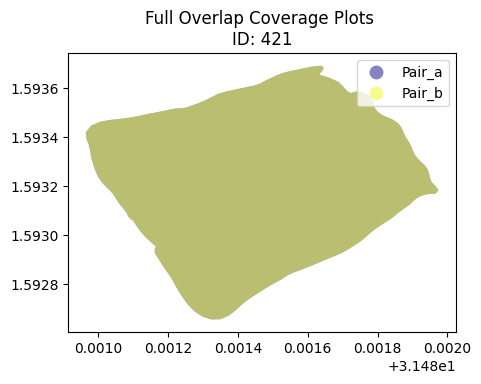

Overlap average percent: 100.0


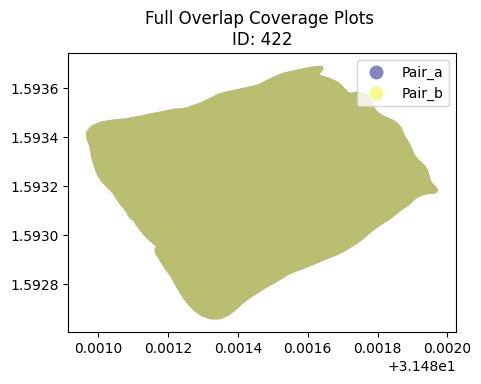

Overlap average percent: 100.0


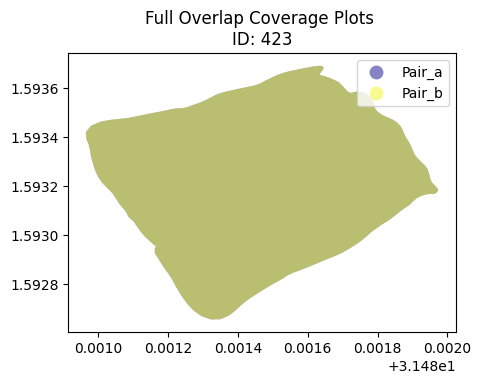

Overlap average percent: 100.0


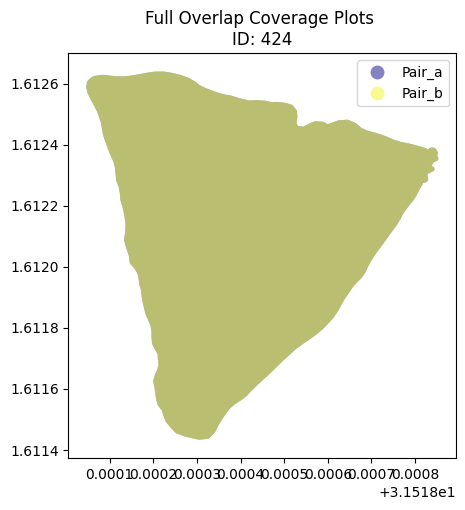

Overlap average percent: 100.0


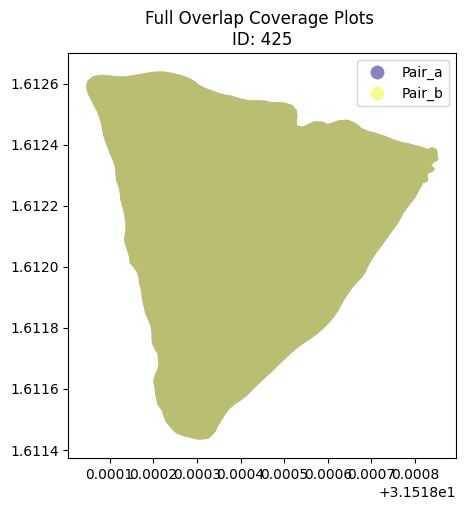

Overlap average percent: 100.0


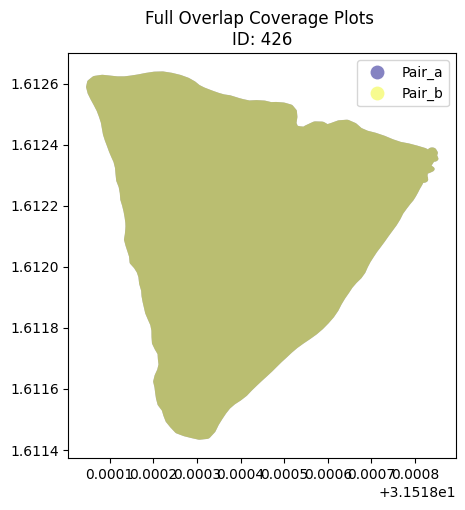

Overlap average percent: 100.0


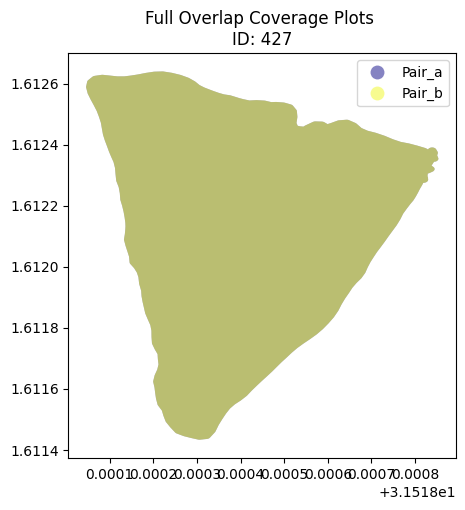

Overlap average percent: 100.0


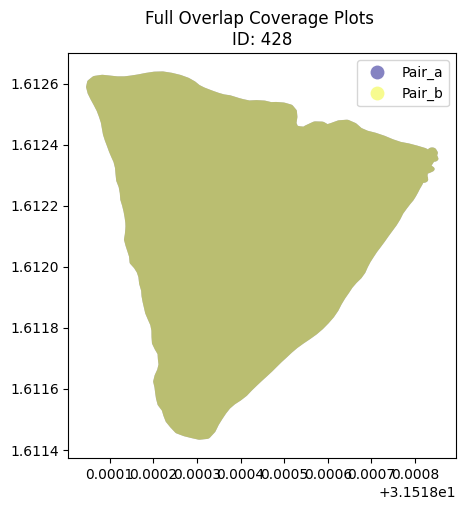

Overlap average percent: 100.0


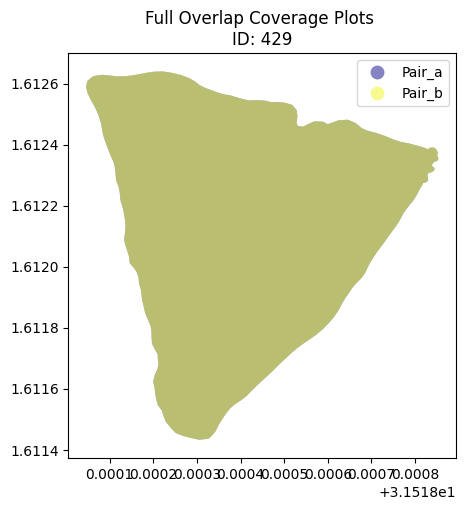

Overlap average percent: 100.0


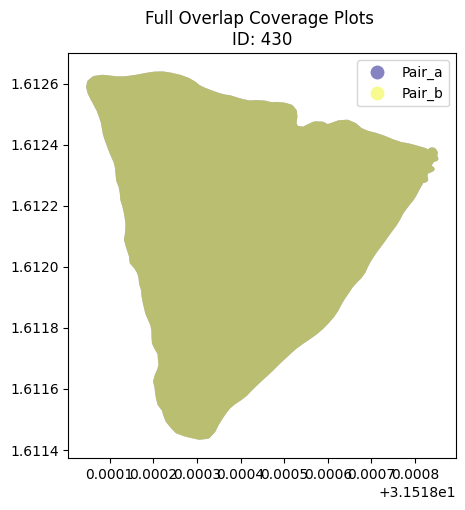

Overlap average percent: 100.0


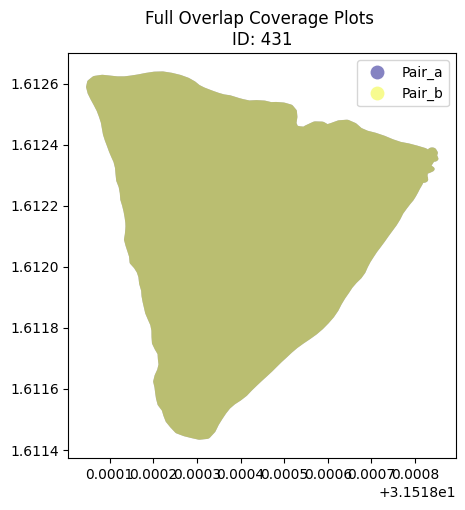

Overlap average percent: 100.0


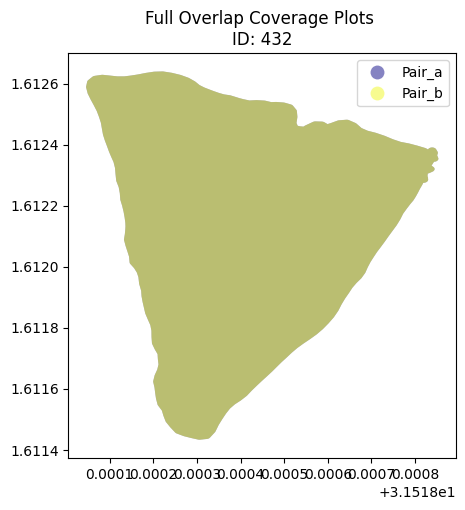

Overlap average percent: 100.0


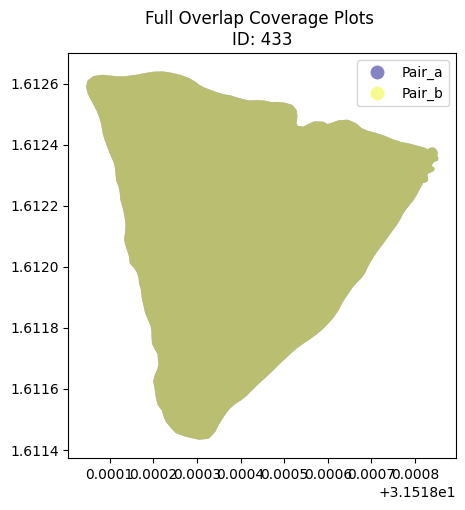

Overlap average percent: 100.0


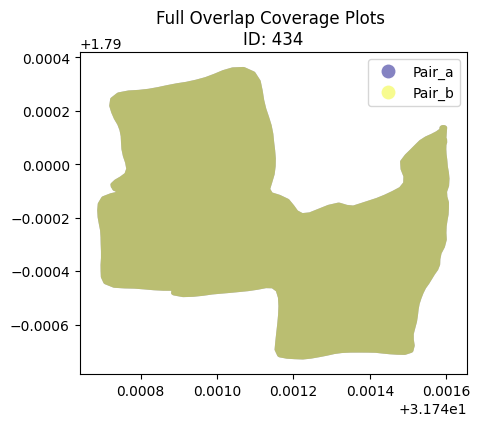

Overlap average percent: 100.0


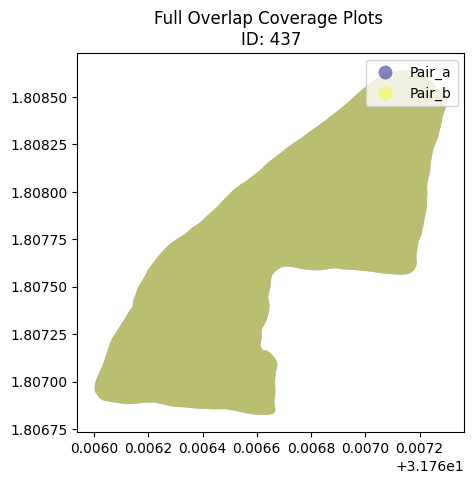

Overlap average percent: 100.0


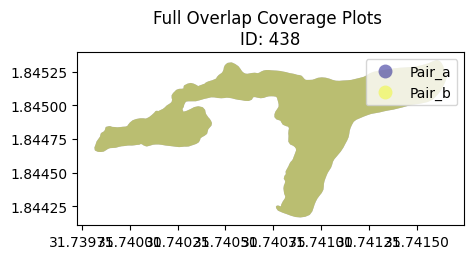

Overlap average percent: 100.0


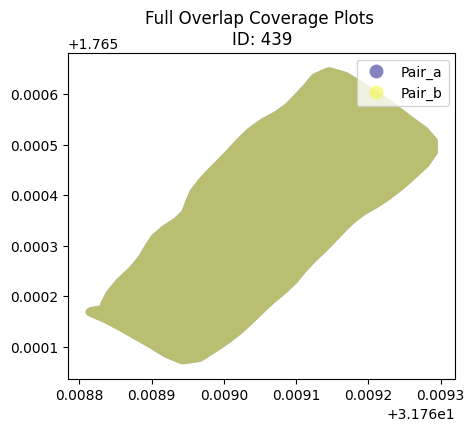

Overlap average percent: 100.0


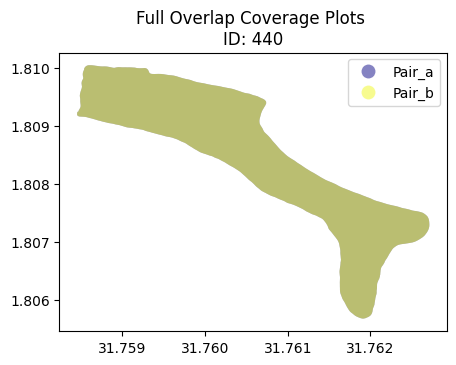

Overlap average percent: 100.0


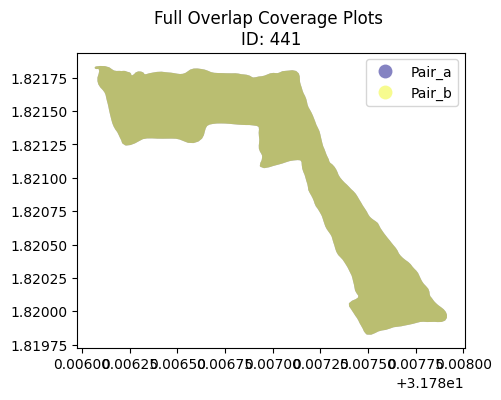

Overlap average percent: 100.0


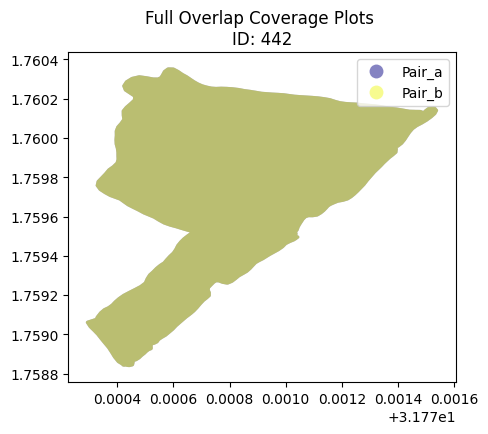

Overlap average percent: 100.0


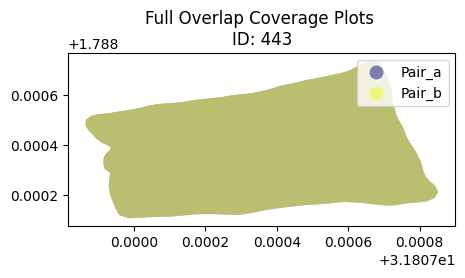

Overlap average percent: 100.0


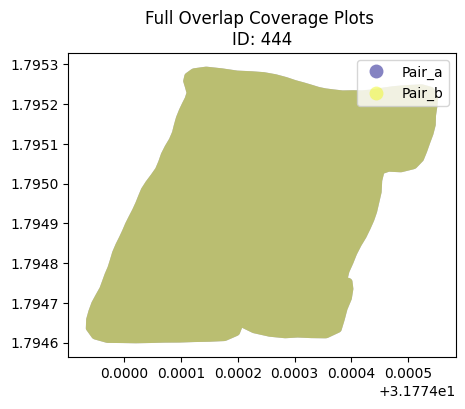

Overlap average percent: 100.0


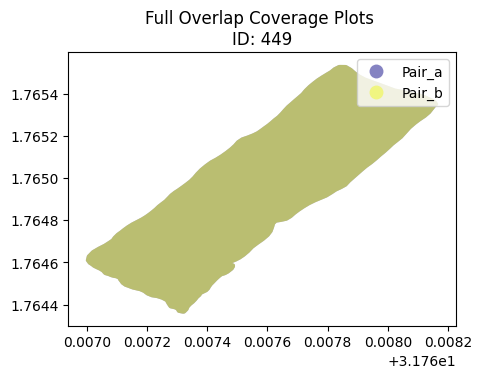

Overlap average percent: 100.0


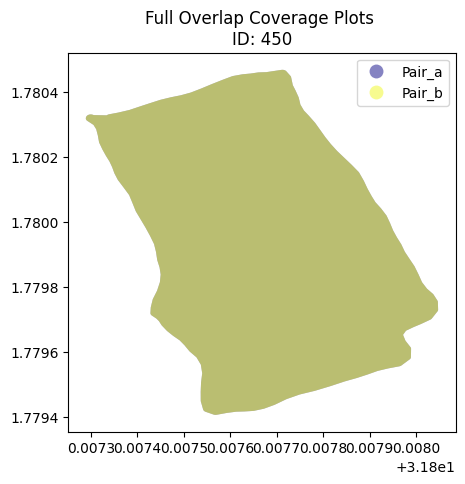

Overlap average percent: 100.0


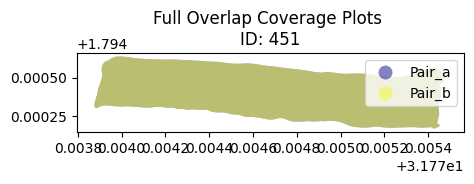

Overlap average percent: 100.0


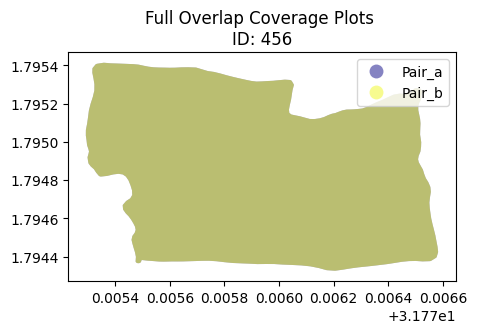

Overlap average percent: 100.0


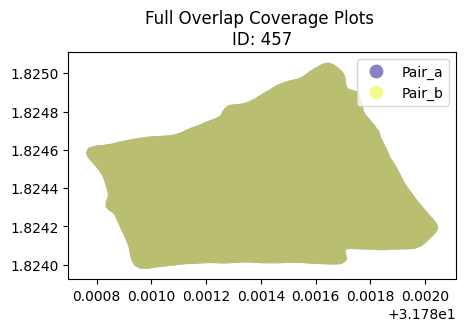

Overlap average percent: 100.0


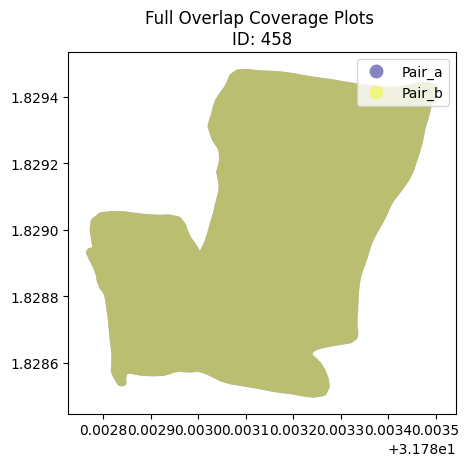

Overlap average percent: 100.0


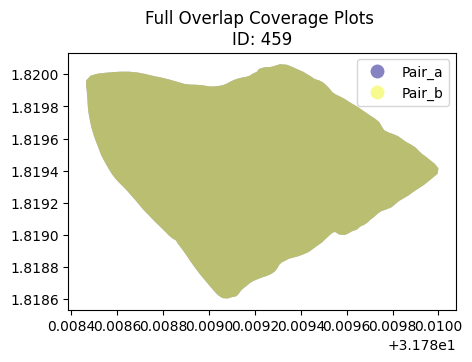

Overlap average percent: 100.0


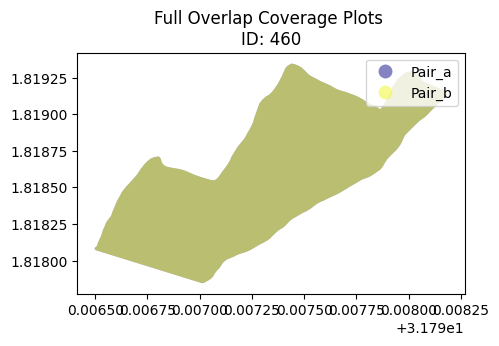

Overlap average percent: 100.0


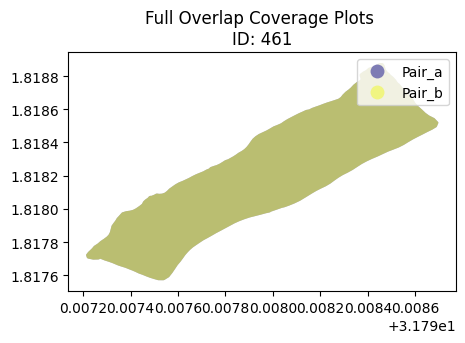

Overlap average percent: 100.0


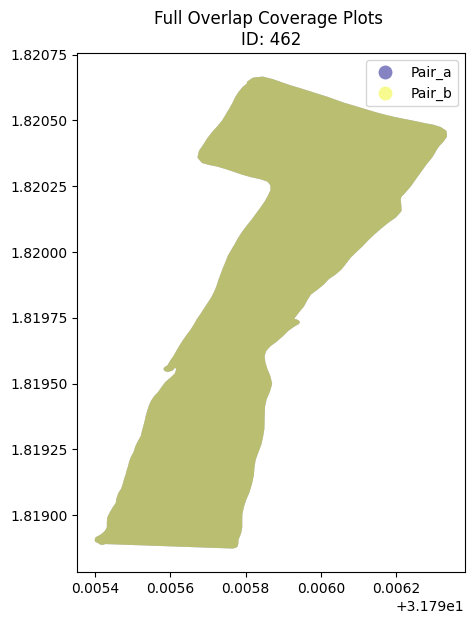

Overlap average percent: 100.0


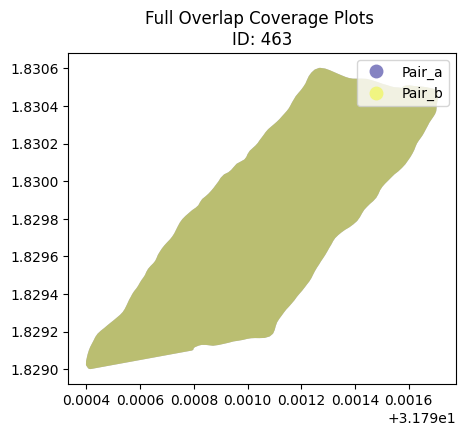

Overlap average percent: 100.0


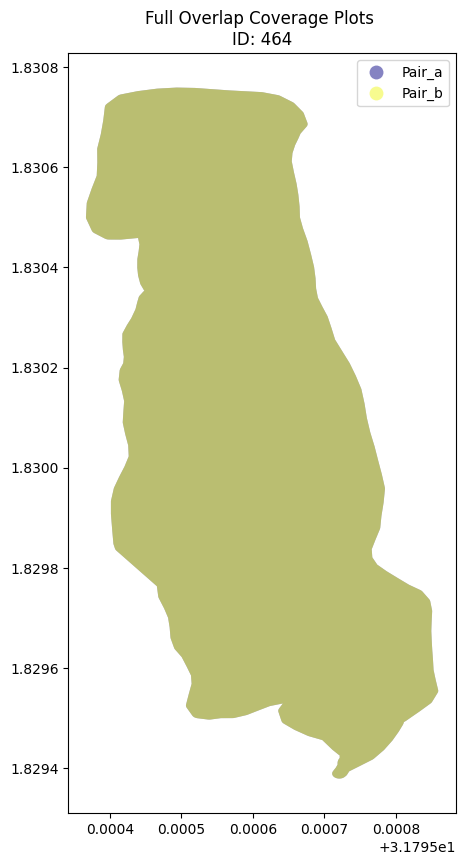

Overlap average percent: 100.0


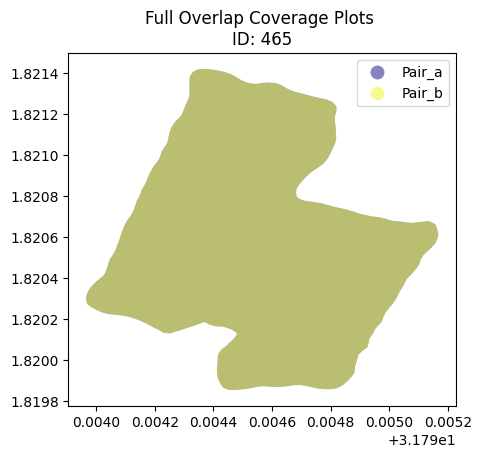

Overlap average percent: 100.0


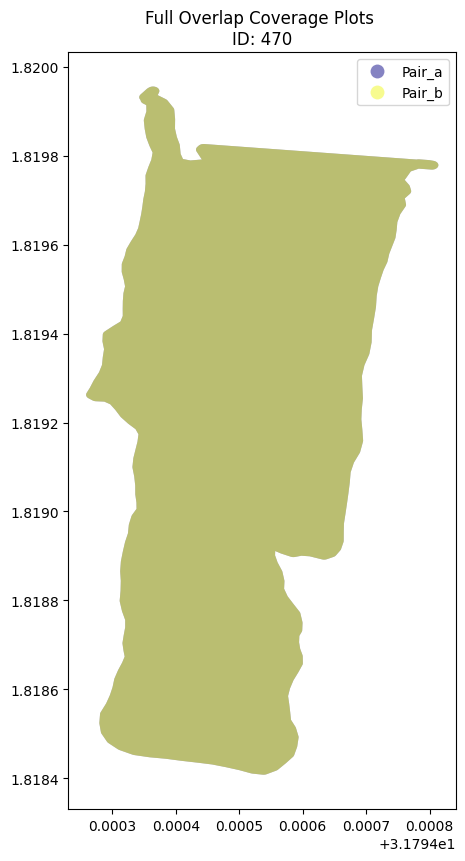

Overlap average percent: 100.0


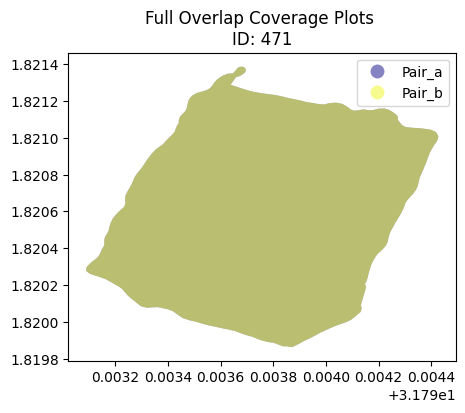

Overlap average percent: 100.0


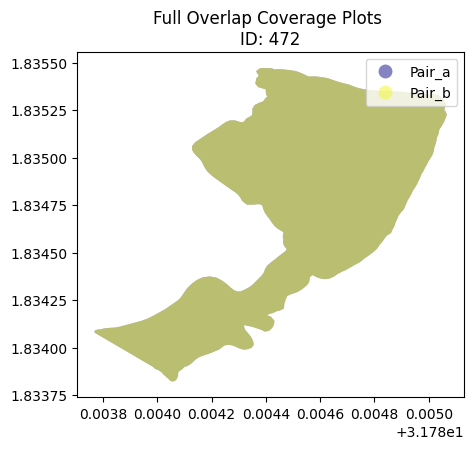

Overlap average percent: 100.0


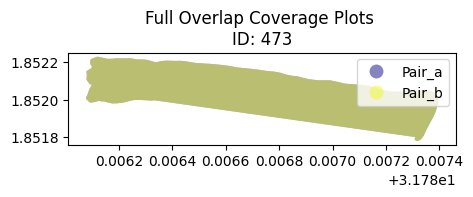

Overlap average percent: 100.0


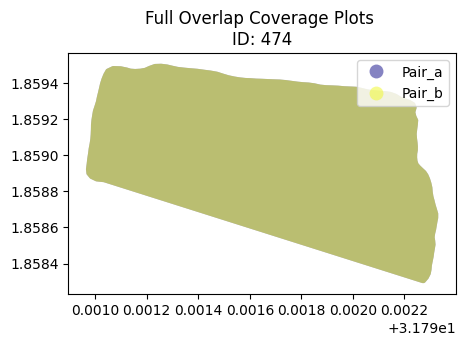

Overlap average percent: 100.0


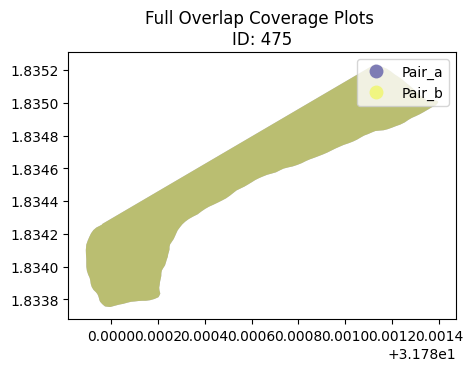

Overlap average percent: 100.0


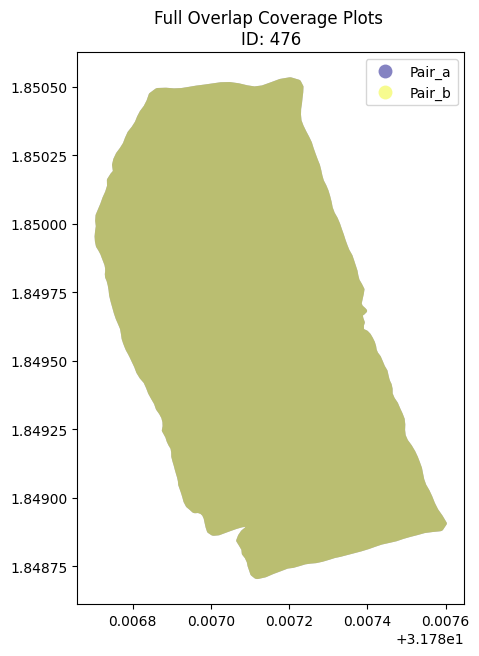

Overlap average percent: 100.0


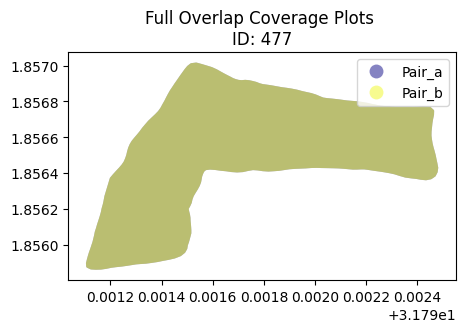

Overlap average percent: 100.0


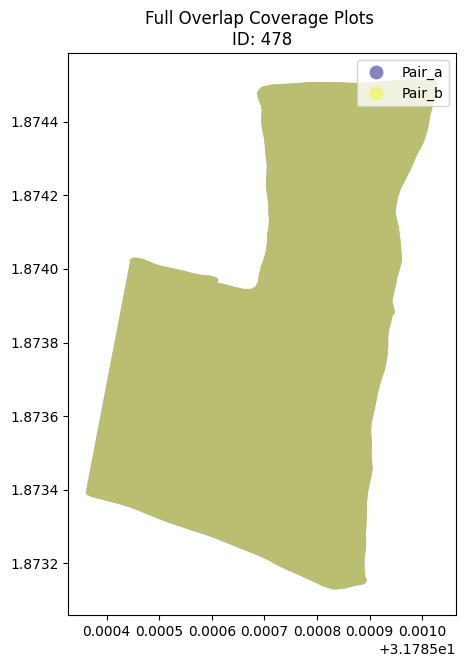

Overlap average percent: 100.0


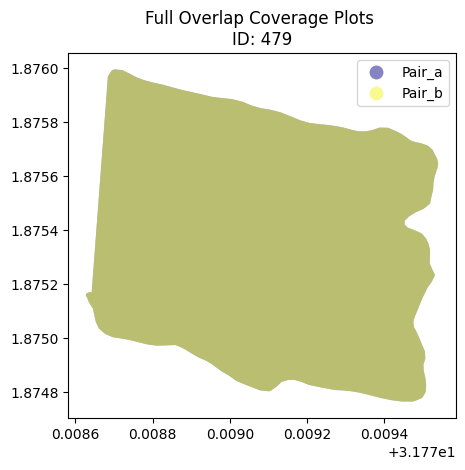

Overlap average percent: 100.0


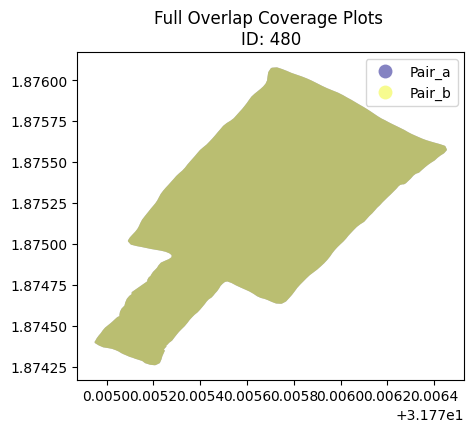

Overlap average percent: 100.0


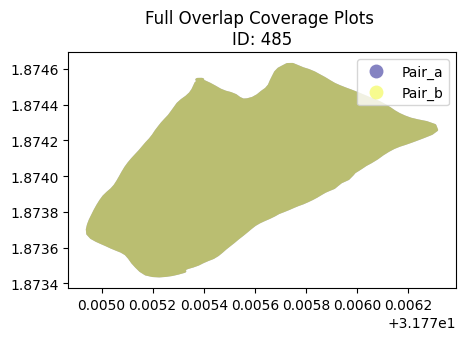

Overlap average percent: 100.0


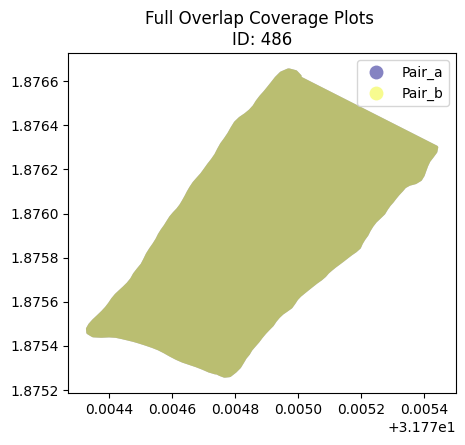

Overlap average percent: 100.0


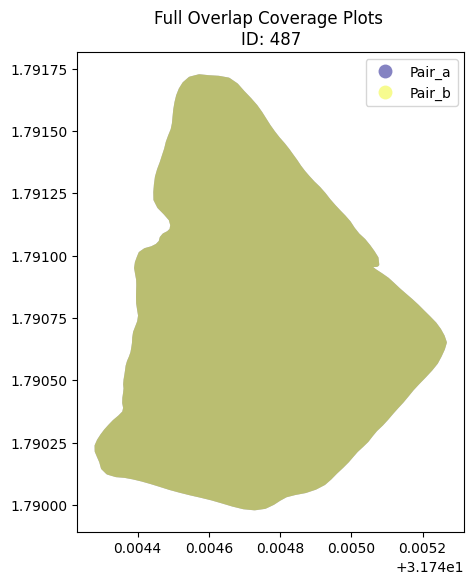

Overlap average percent: 100.0


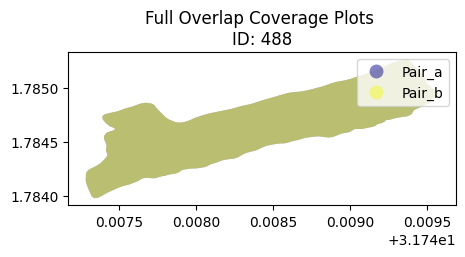

Overlap average percent: 100.0


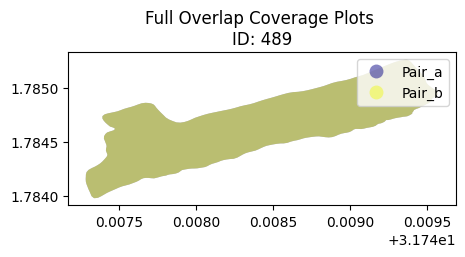

Overlap average percent: 100.0


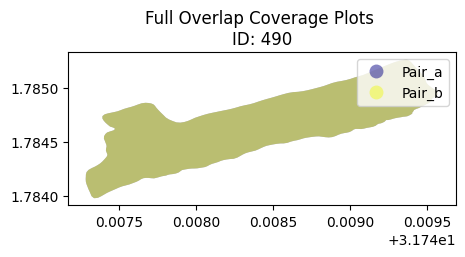

Overlap average percent: 100.0


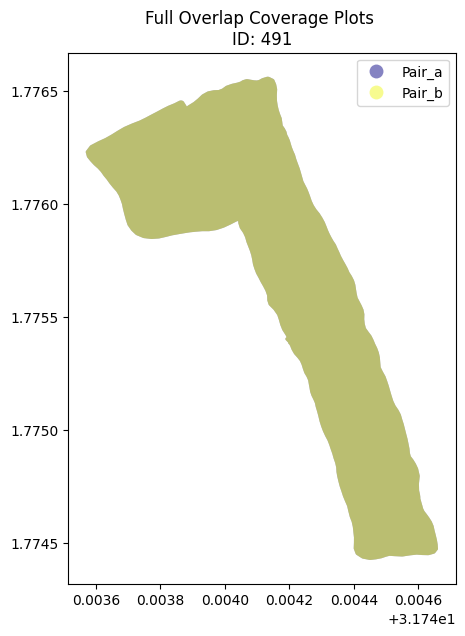

Overlap average percent: 100.0


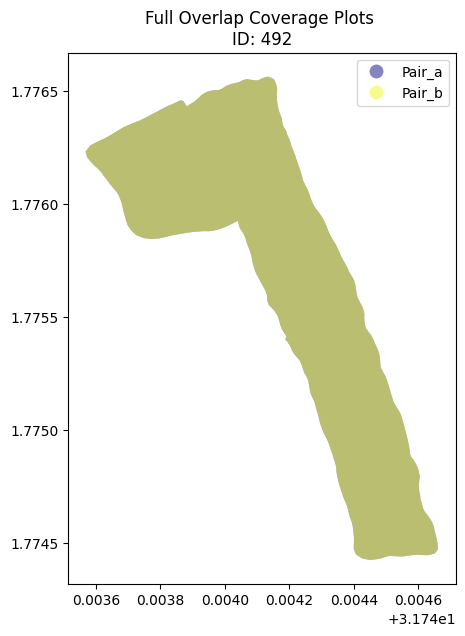

Overlap average percent: 100.0


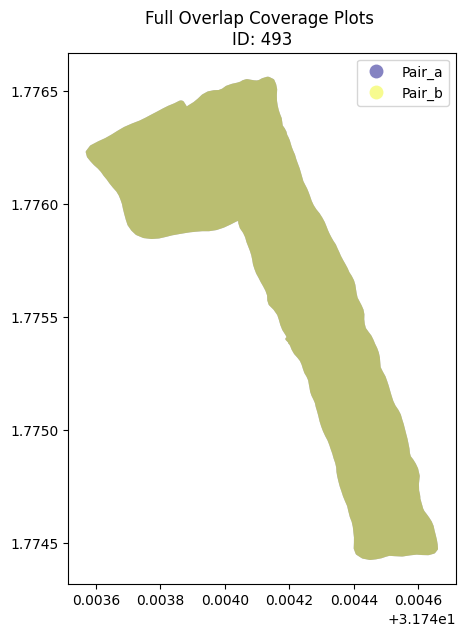

Overlap average percent: 100.0


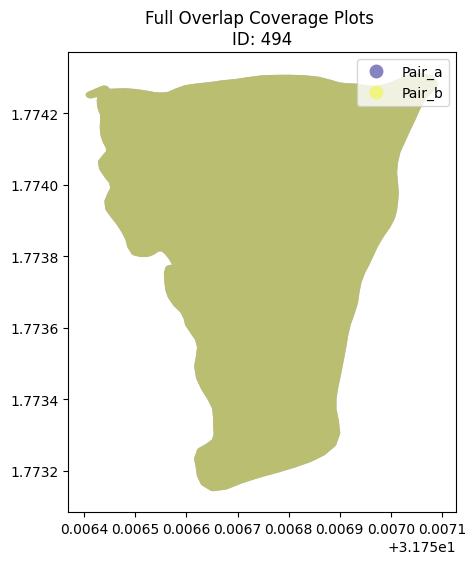

Overlap average percent: 100.0


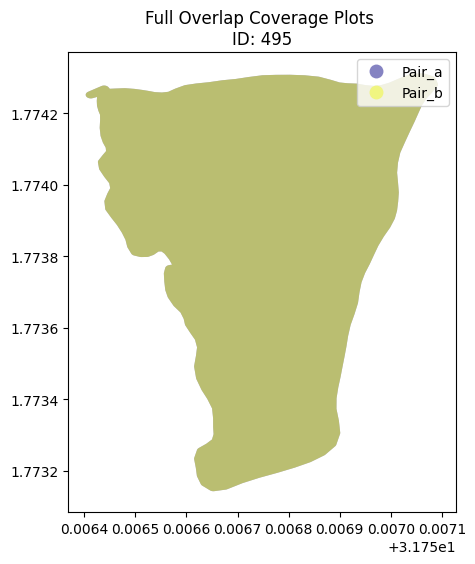

Overlap average percent: 100.0


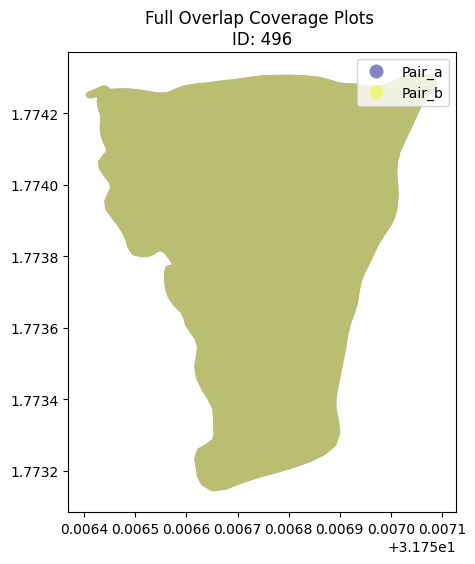

Overlap average percent: 100.0


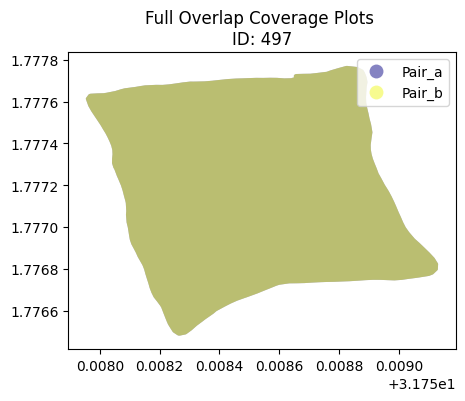

Overlap average percent: 100.0


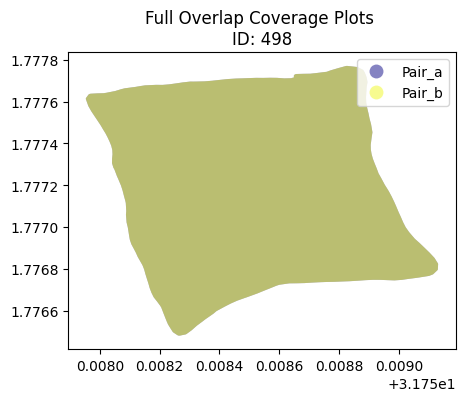

Overlap average percent: 100.0


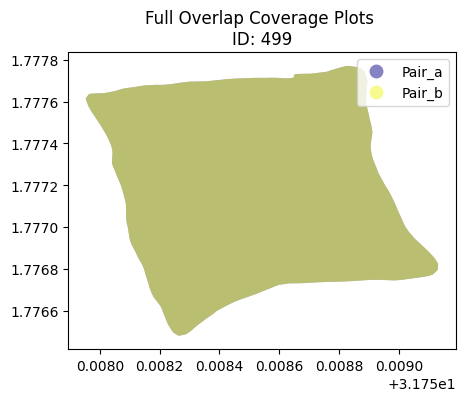

Overlap average percent: 100.0


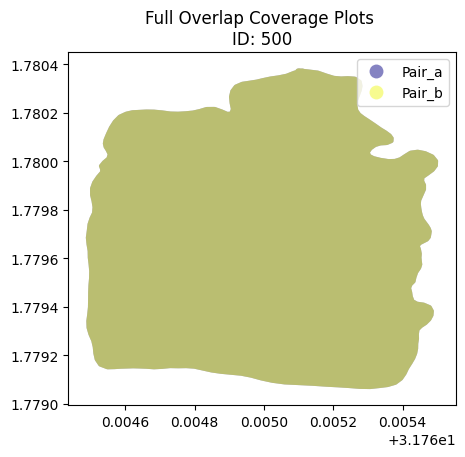

Overlap average percent: 100.0


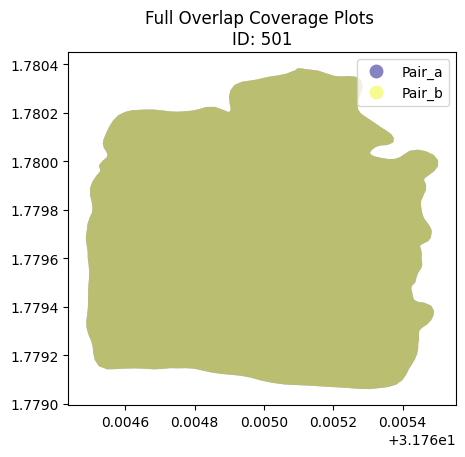

Overlap average percent: 100.0


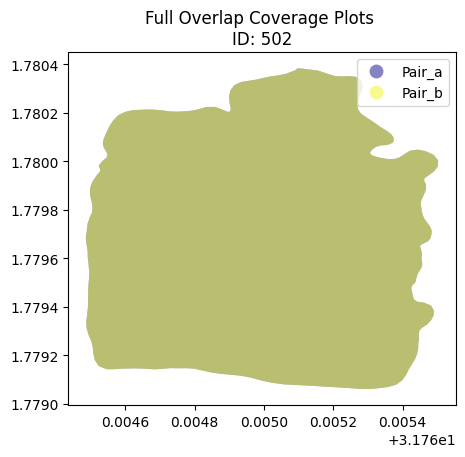

Overlap average percent: 100.0


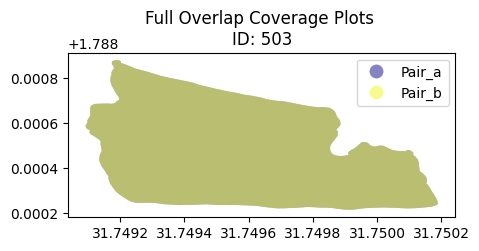

Overlap average percent: 100.0


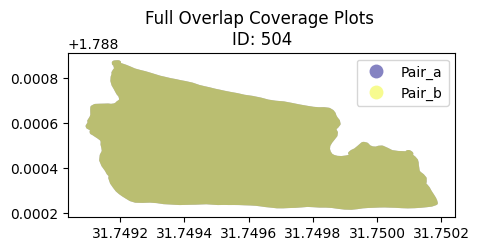

Overlap average percent: 100.0


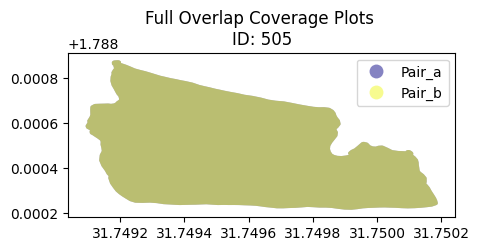

Overlap average percent: 100.0


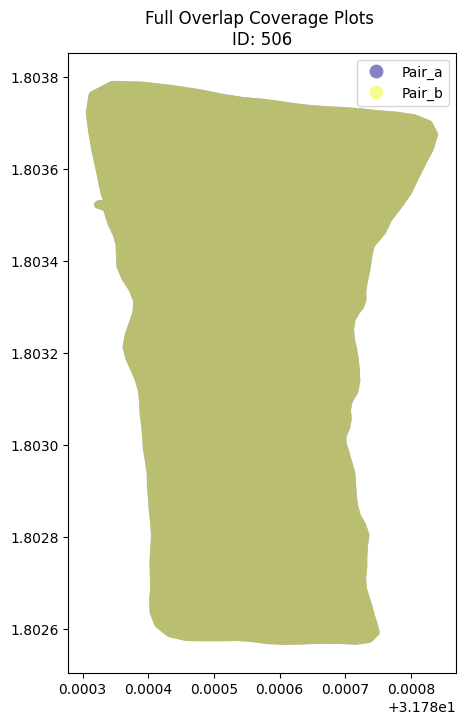

Overlap average percent: 100.0


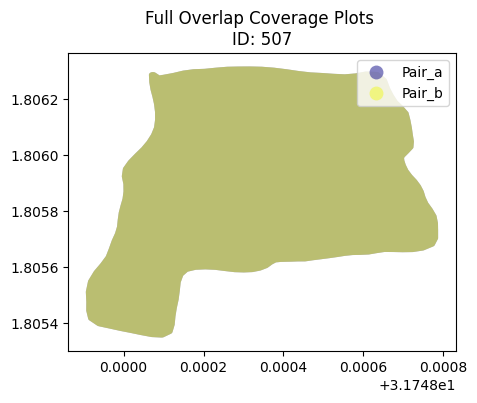

Overlap average percent: 100.0


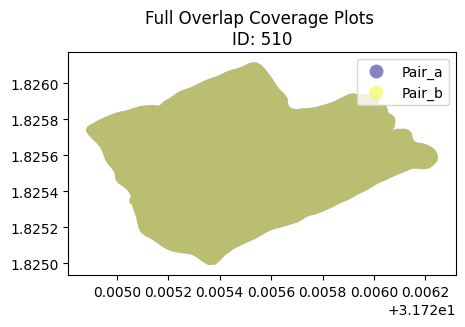

Overlap average percent: 100.0


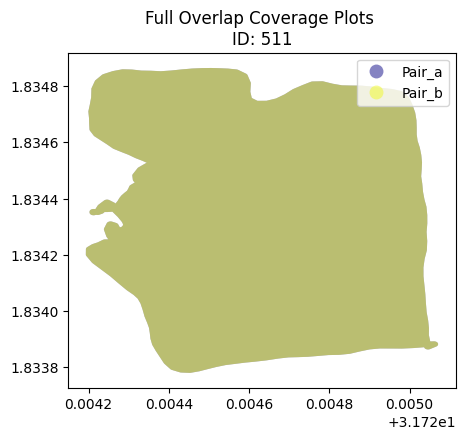

Overlap average percent: 100.0


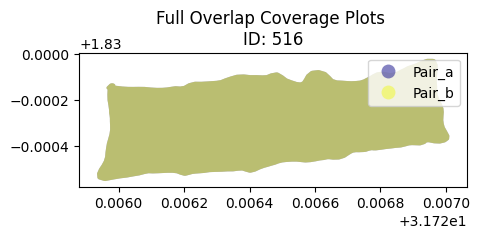

Overlap average percent: 100.0


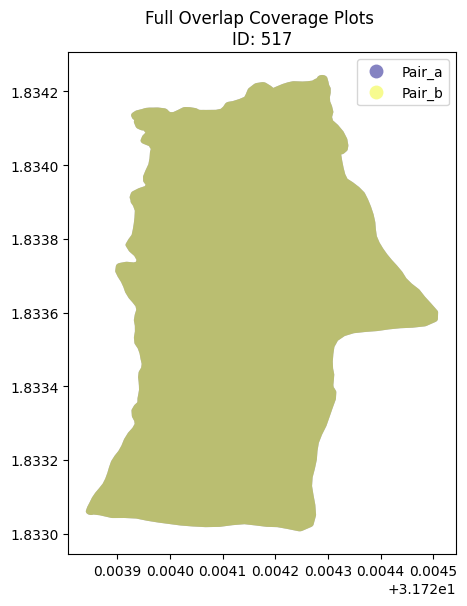

Overlap average percent: 100.0


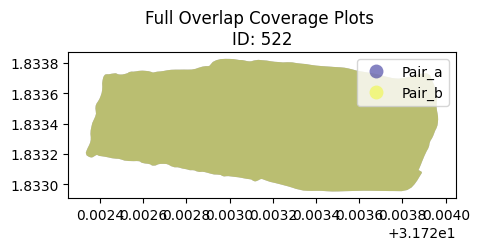

In [148]:
createPlotsPairs(full_overlaps, 'Full Overlap Coverage Plots',(5,10), 0.7, True)
    
    

In [123]:
full_overlaps_df = full_overlaps[['id', 'intersect_plots', 'overlap_average_percent']]
full_overlaps_df.to_csv('outputs/full_overlaps_df.csv', index= False)
# full_overlaps_df.to_file('outputs/full_overlaps_gdf.shp')

In [124]:
# minimal_overlaps_ids = []
# needs_review_overlaps_ids = []

# for i in range(len(gdf)):
#     if ((gdf['overlap_average_percent'][i] <= 99) & ((gdf['overlap_average_percent'][i] > 50))):
#         needs_review_overlaps_ids.append(gdf.id[i])
        

### Solution 2: Combine plots with < 5% intersection using union to create new geometric coordinates for carbon quantification

In [ ]:
# Union < 5% 
union_overlaps['union'] = union_overlaps['Pair_a'].union(union_overlaps['Pair_b'])

# union_overlaps.overlap_average_percent.value_counts()
createPlots(union_overlaps, 'union', 'Union of Pair_a and Pair_b for smaller overlaps', (7,15), 0.8)


In [126]:
union_overlaps_df = union_overlaps[['id', 'intersect_plots', 'overlap_average_percent', 'union']]
union_overlaps_df.to_csv('outputs/union_overlaps_df.csv', index= False)


Overlap average percent: 4.135


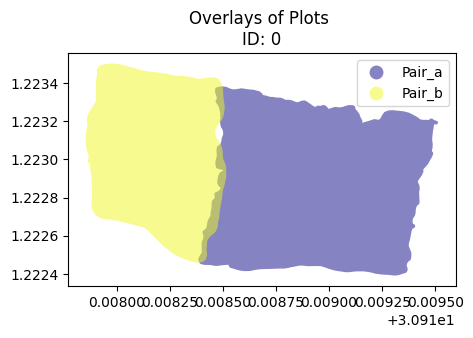

Overlap average percent: 0.575


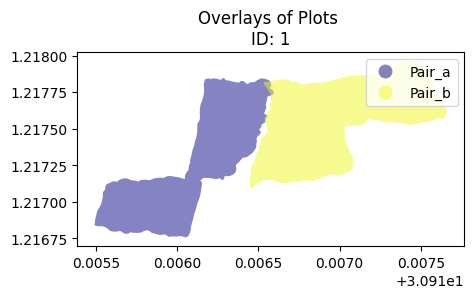

Overlap average percent: 100.0


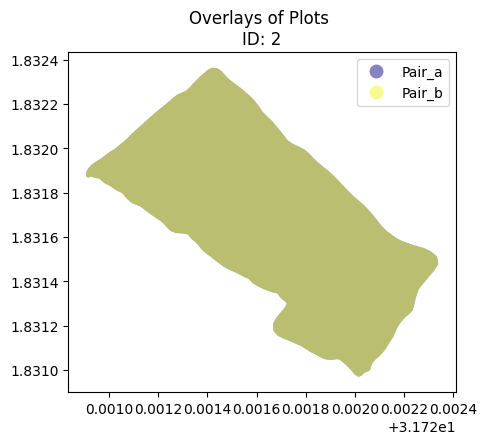

Overlap average percent: 100.0


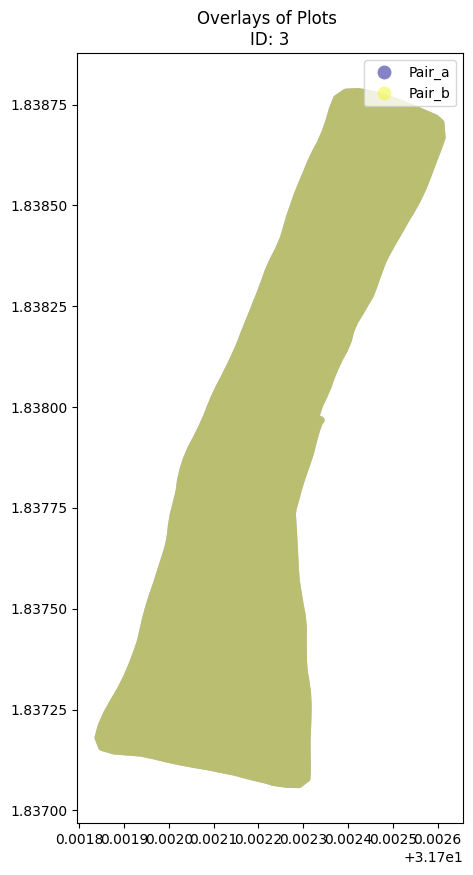

Overlap average percent: 100.0


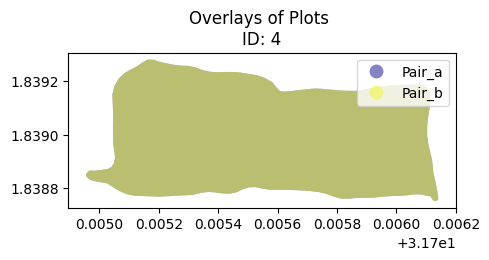

Overlap average percent: 100.0


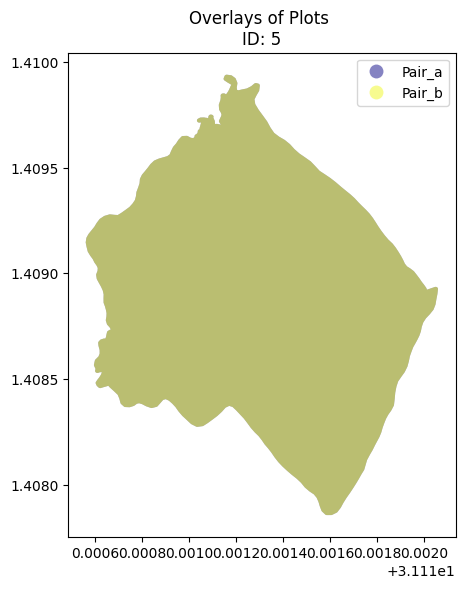

Overlap average percent: 1.69


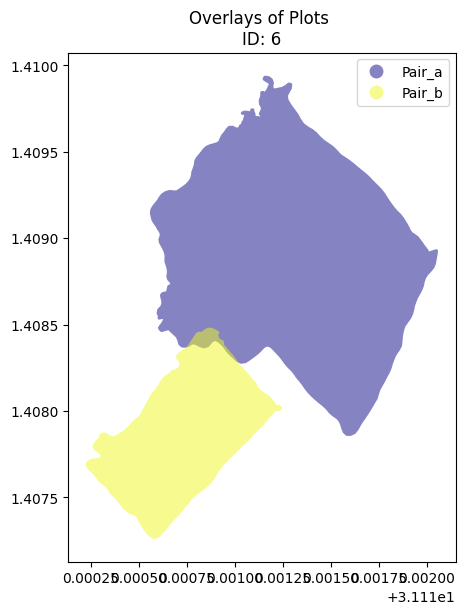

Overlap average percent: 1.69


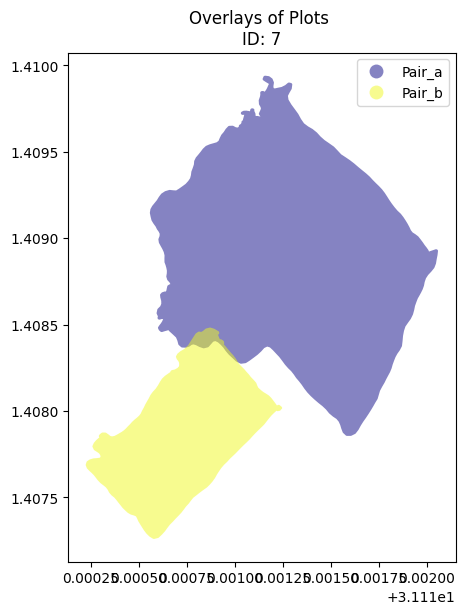

Overlap average percent: 100.0


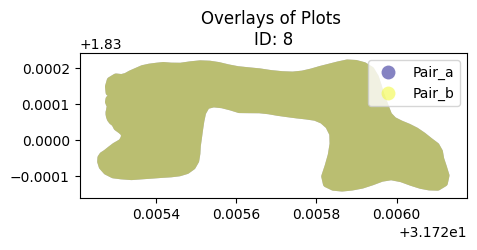

Overlap average percent: 2.726


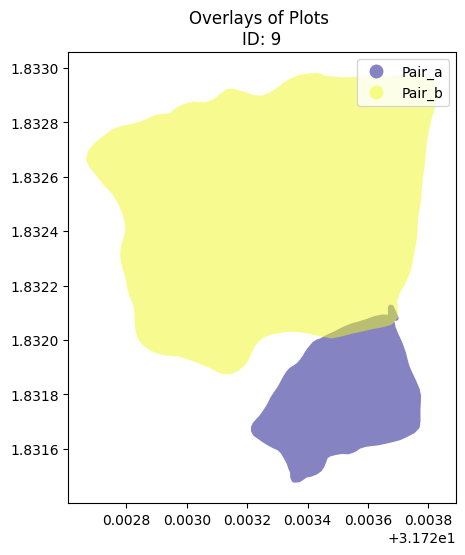

Overlap average percent: 2.726


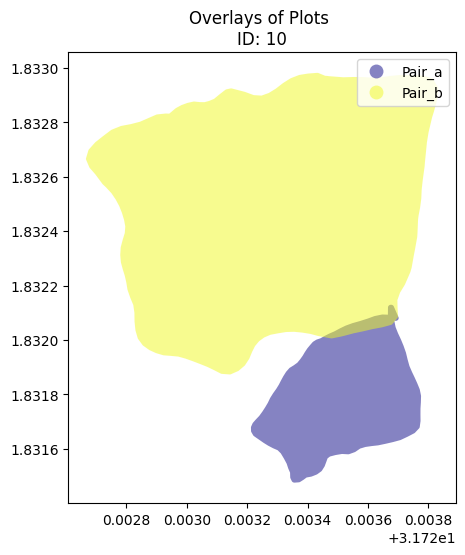

Overlap average percent: 100.0


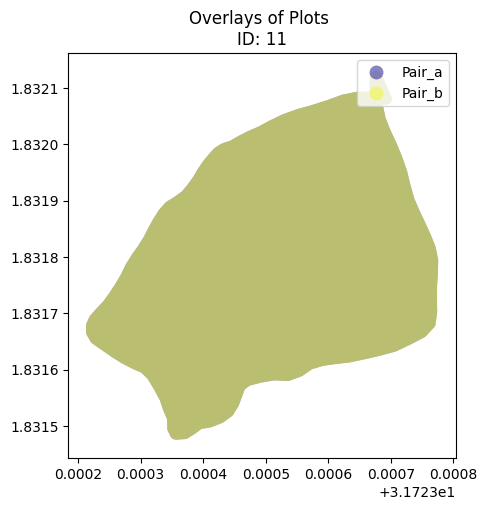

Overlap average percent: 100.0


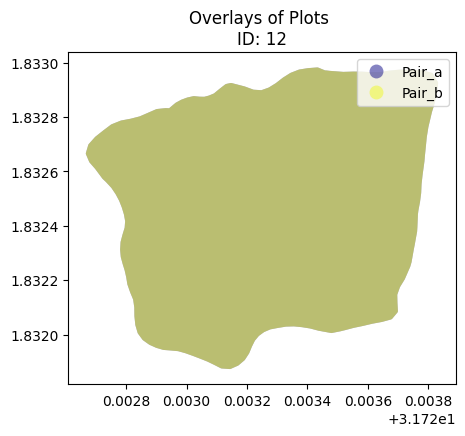

Overlap average percent: 2.726


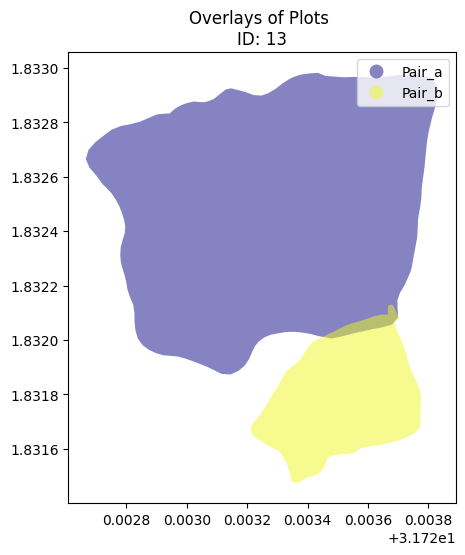

Overlap average percent: 0.755


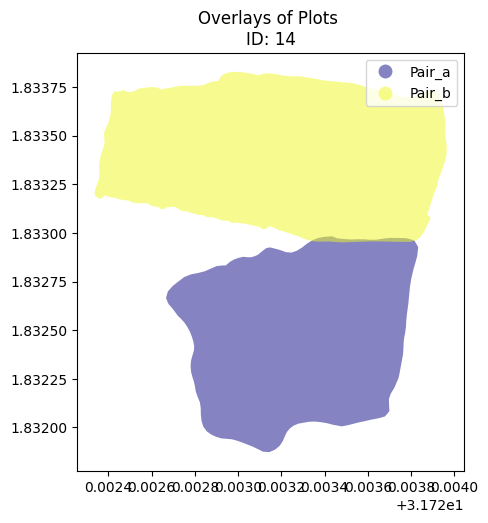

Overlap average percent: 0.755


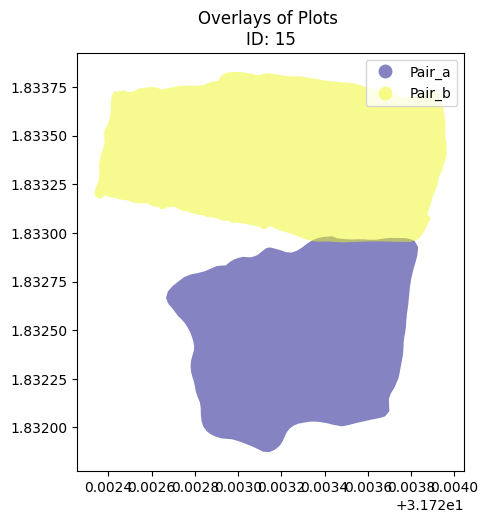

Overlap average percent: 100.0


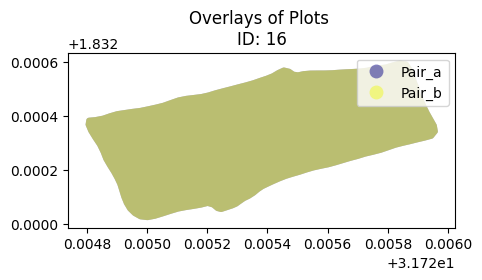

Overlap average percent: 2.726


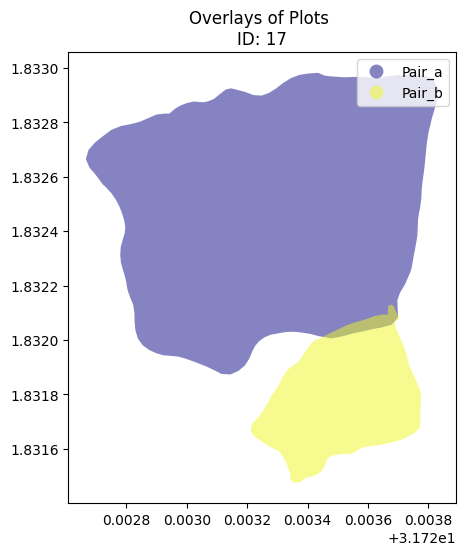

Overlap average percent: 0.755


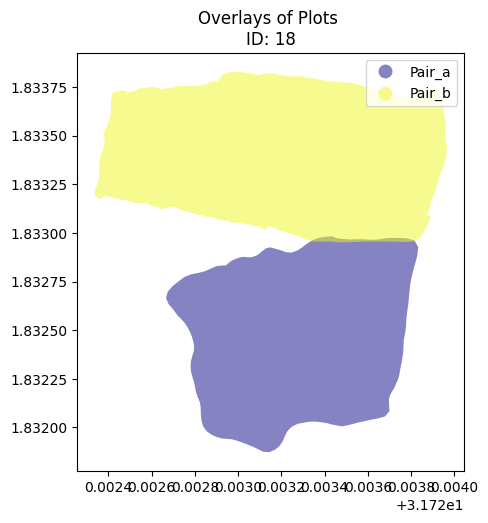

Overlap average percent: 0.755


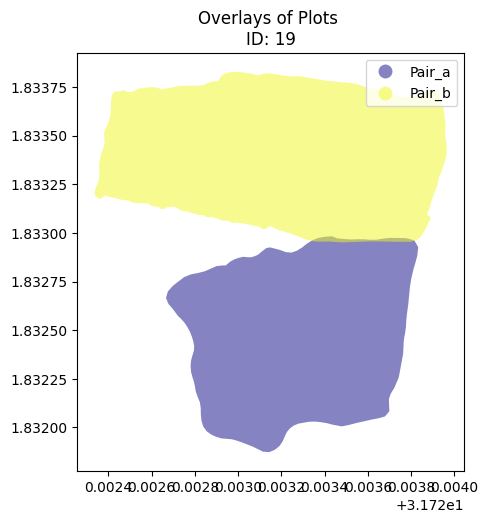

Overlap average percent: 92.692


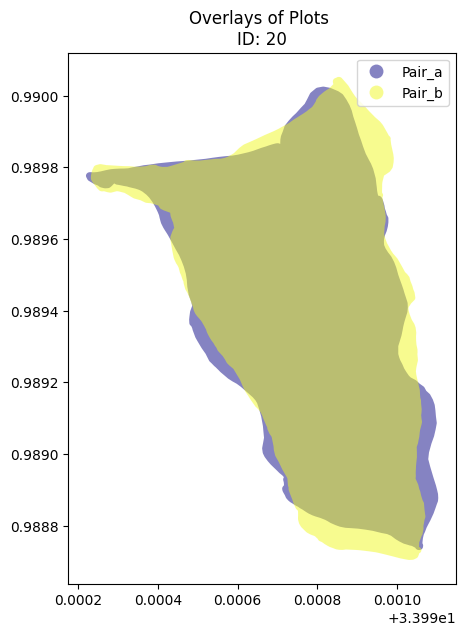

Overlap average percent: 0.081


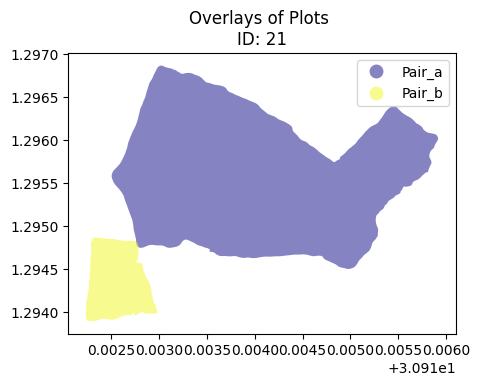

Overlap average percent: 68.761


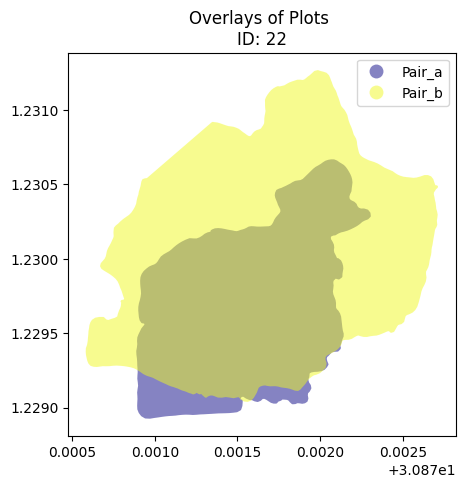

Overlap average percent: 100.0


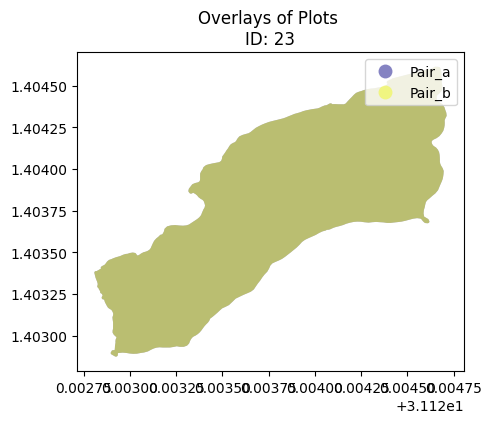

Overlap average percent: 61.092


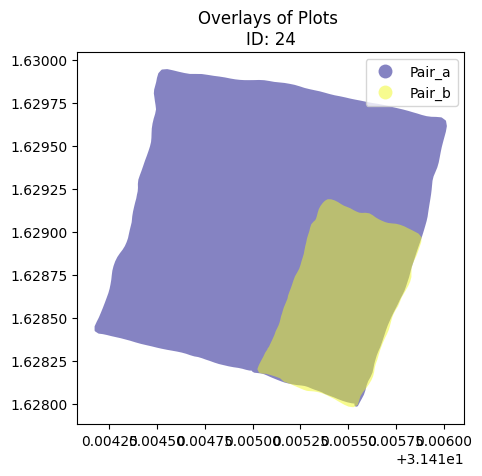

Overlap average percent: 100.0


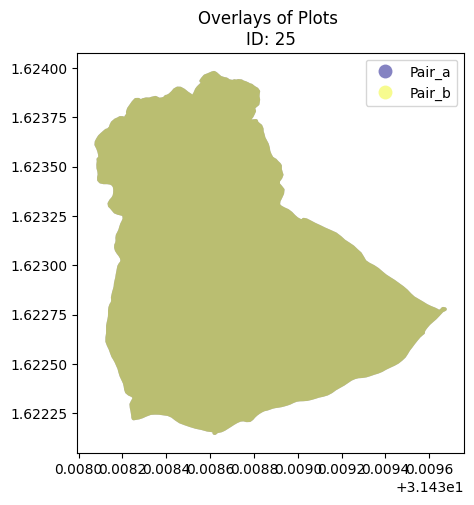

Overlap average percent: 100.0


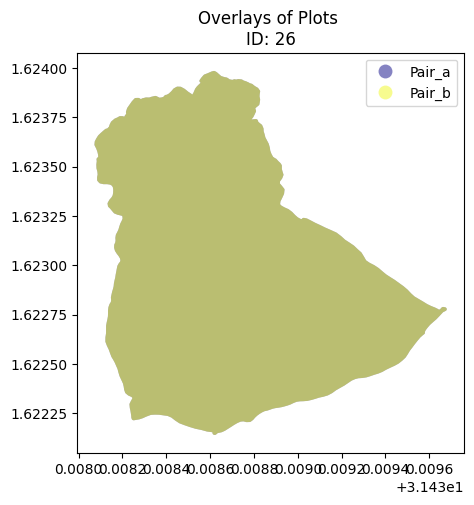

Overlap average percent: 100.0


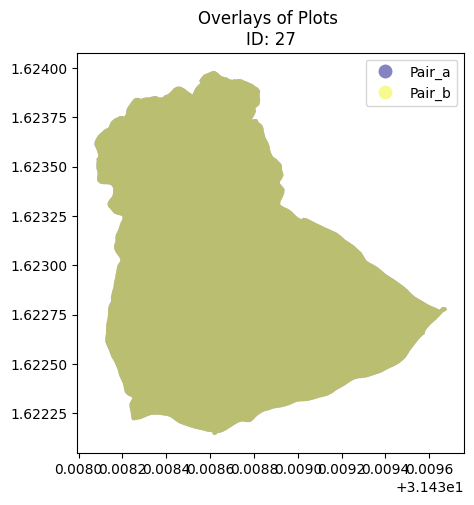

Overlap average percent: 100.0


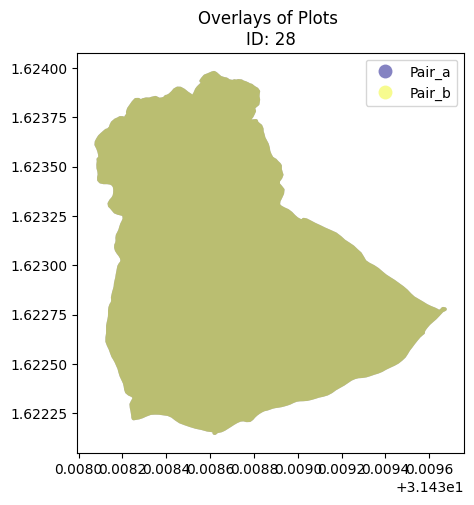

Overlap average percent: 100.0


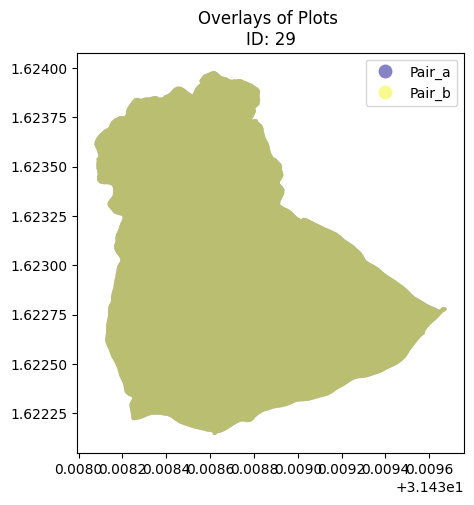

Overlap average percent: 100.0


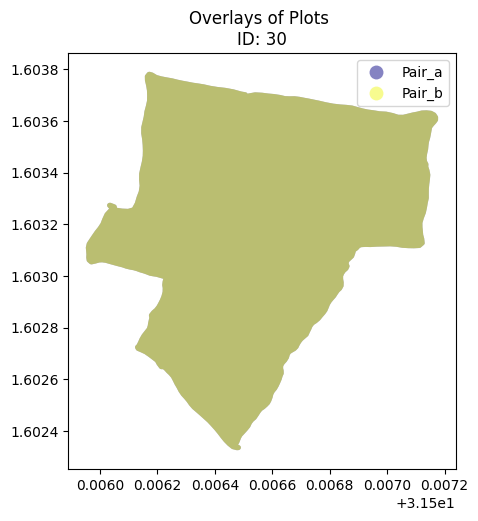

Overlap average percent: 100.0


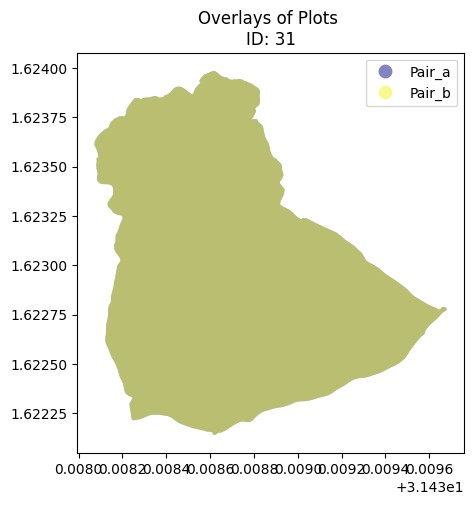

Overlap average percent: 100.0


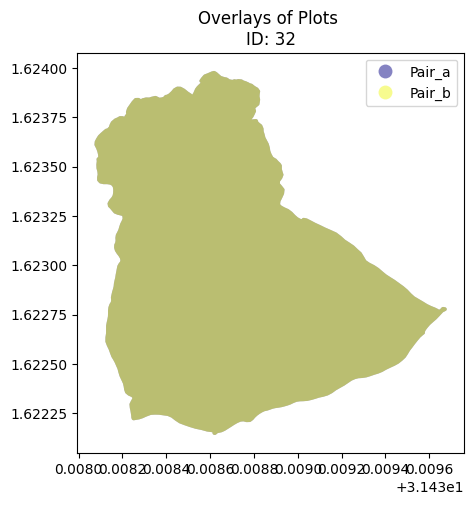

Overlap average percent: 100.0


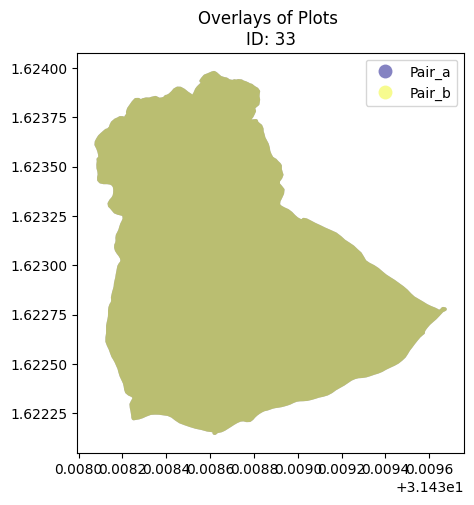

Overlap average percent: 100.0


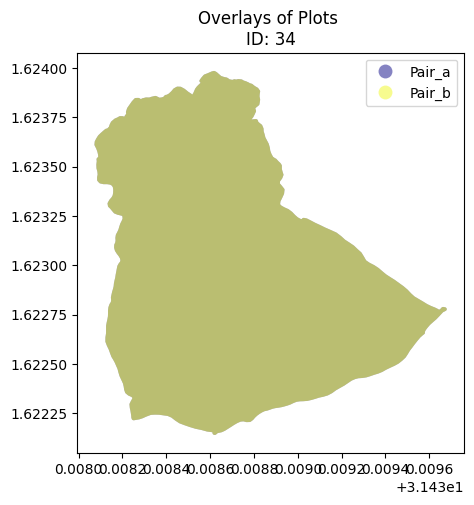

Overlap average percent: 0.356


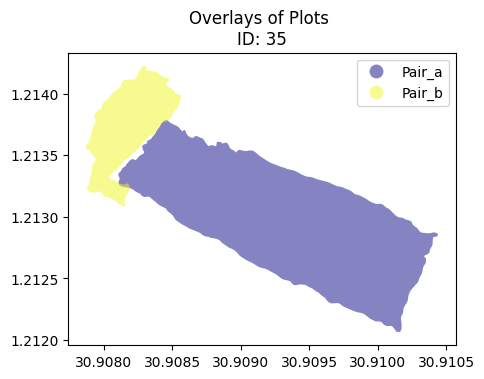

Overlap average percent: 2.155


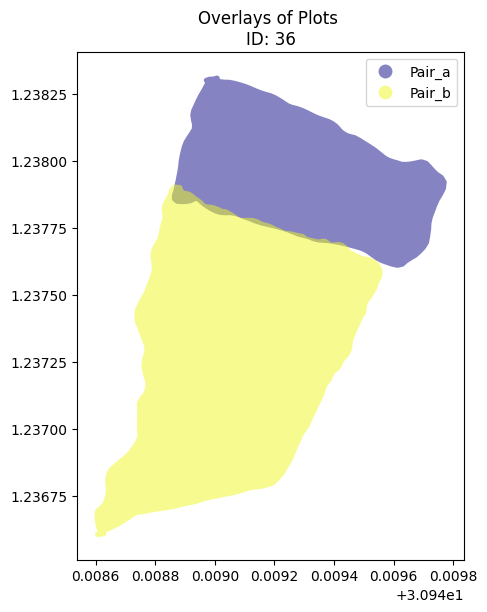

Overlap average percent: 100.0


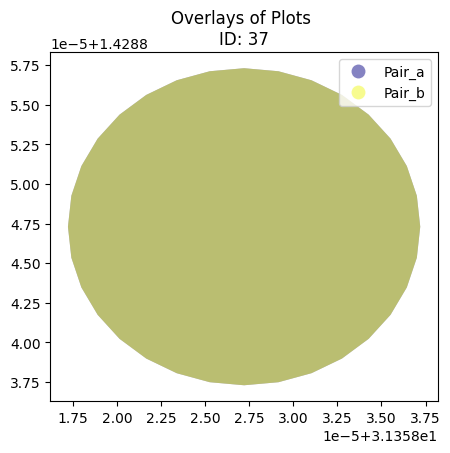

Overlap average percent: 100.0


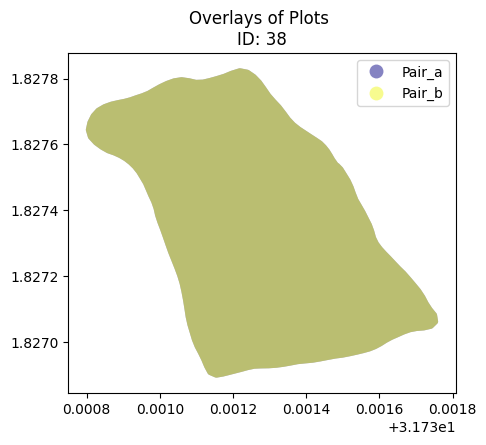

Overlap average percent: 0.938


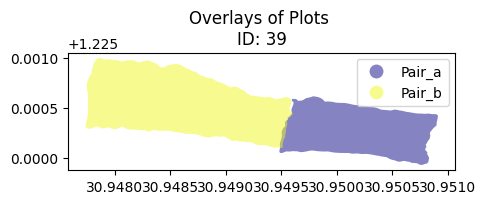

Overlap average percent: 89.964


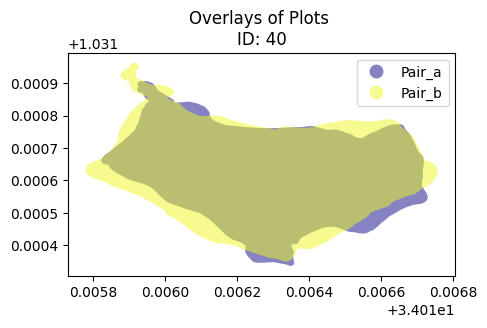

Overlap average percent: 78.043


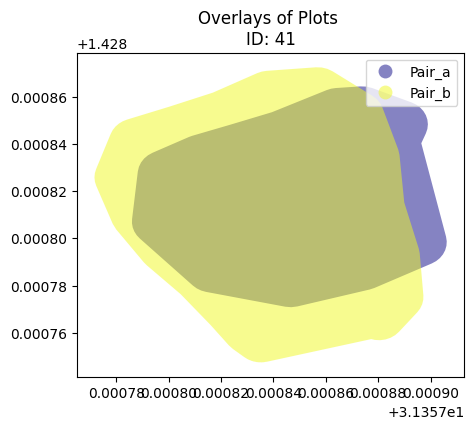

Overlap average percent: 5.863


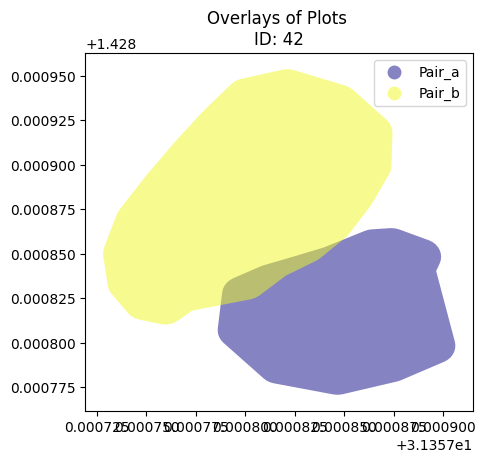

Overlap average percent: 39.247


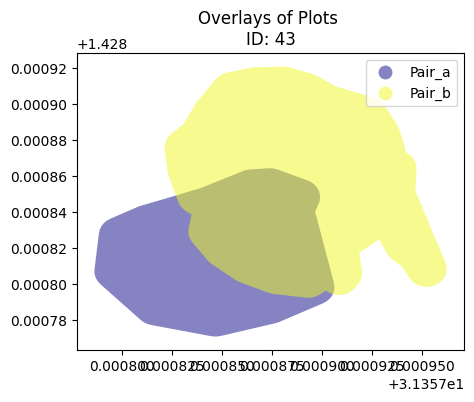

Overlap average percent: 38.348


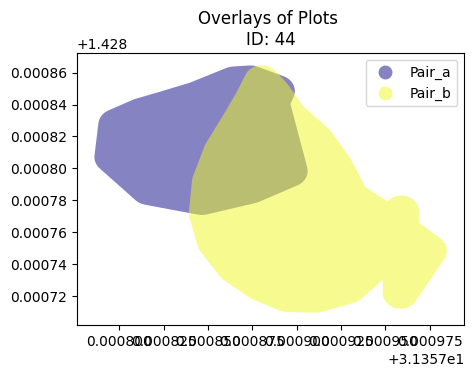

Overlap average percent: 1.666


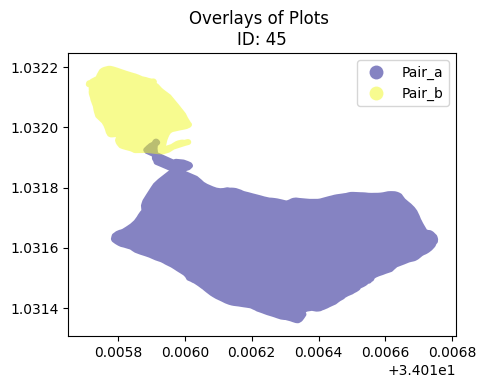

Overlap average percent: 0.354


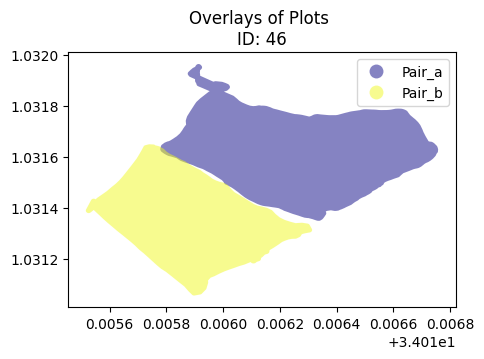

Overlap average percent: 12.521


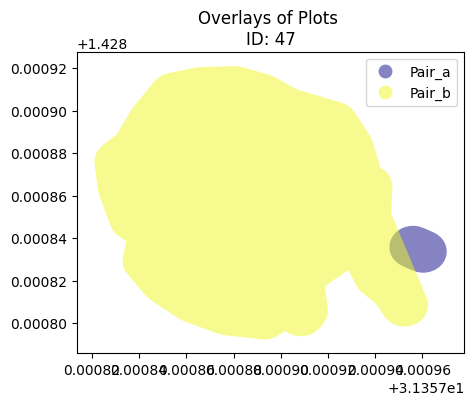

Overlap average percent: 17.169


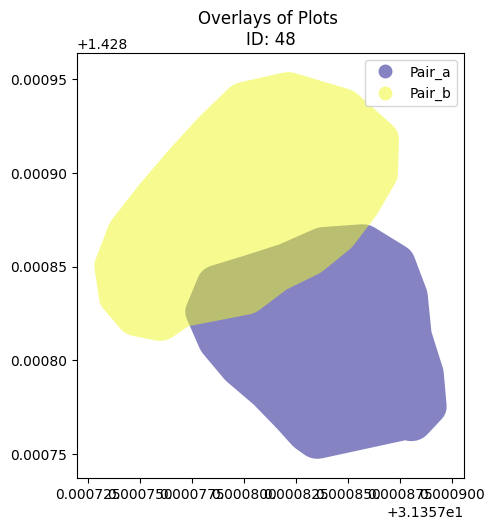

Overlap average percent: 31.405


In [ ]:
createPlotsPairs(gdf, 'Overlays of Plots', (5,10), 0.9)

# for slide in range(len(gdf)):
#     d = {'col1': ['Pair_a', 'Pair_b'], 'geometry': [gdf.Pair_a[slide], gdf.Pair_b[slide]]}
#     new = gpd.GeoDataFrame(d, crs='EPSG:4326')
    
#     fig, ax = plt.subplots(figsize=(10, 30))
#     new.plot(column = 'col1', ax=ax, alpha=0.5, aspect=0.9, cmap='tab20', legend= True)
#     plt.title("Overlays of Plots ID: {}".format(gdf.id[slide]))
#     plt.show()
    
    

In [128]:
# import plotly.express as px

# for slide in range(len(example)):
#     d = {'col1': ['Pair_a', 'Pair_b'], 'geometry': [gdf.Pair_a[slide], gdf.Pair_b[slide]]}
#     new = gpd.GeoDataFrame(d, crs='EPSG:4326')
    
# #     fig, ax = plt.subplots(figsize=(10, 30))
#     fig = px.choropleth(new, geojson=new.geometry, locations = new.col1)
#     fig.update_geos(fitbounds="locations", visible=False)
#     fig.show()
    
    

### Solution 3: needs review dataframes with more complicated plots of intersection between 5-95% overlap: 

Specific attention to cases of more complex plots where 1 plot seems to be inside the other plot- indicates error in measurements. 

Overlap average percent: 92.692


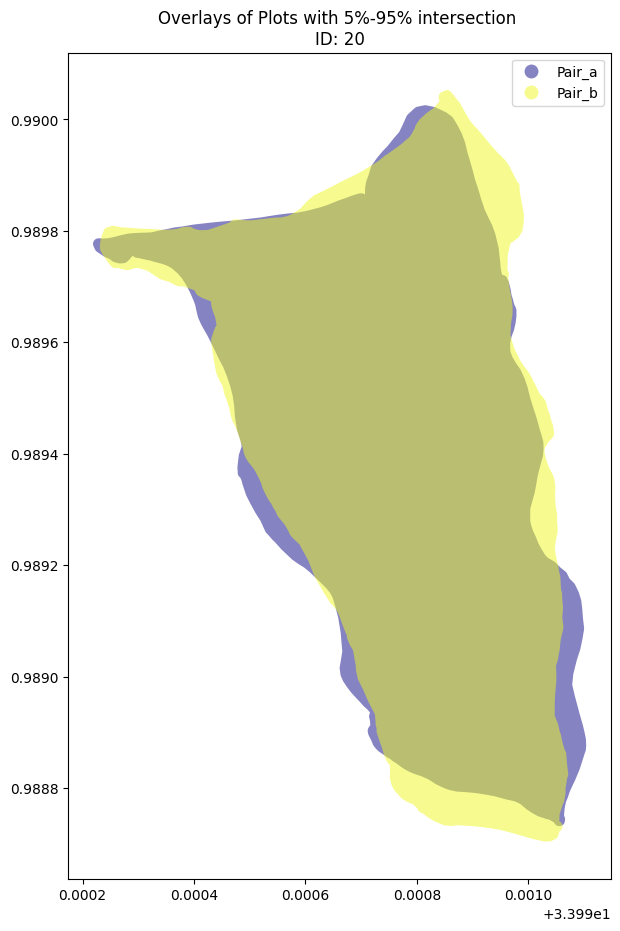

Overlap average percent: 68.761


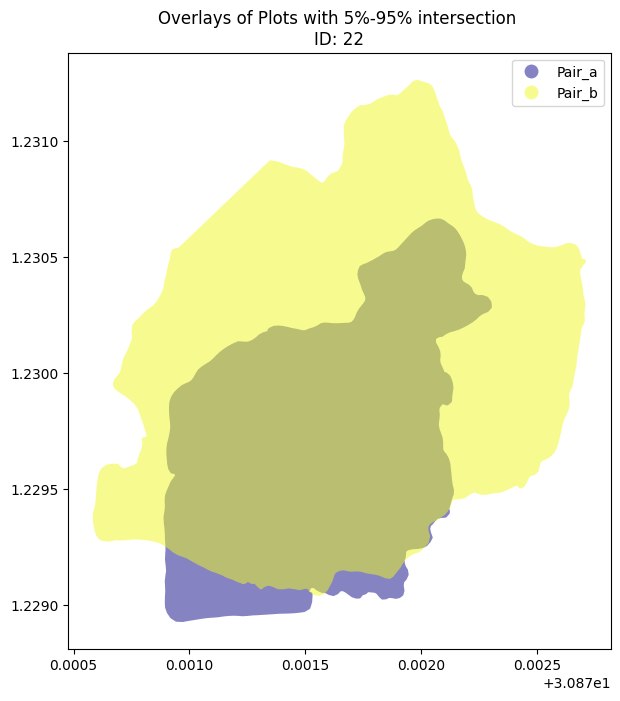

Overlap average percent: 61.092


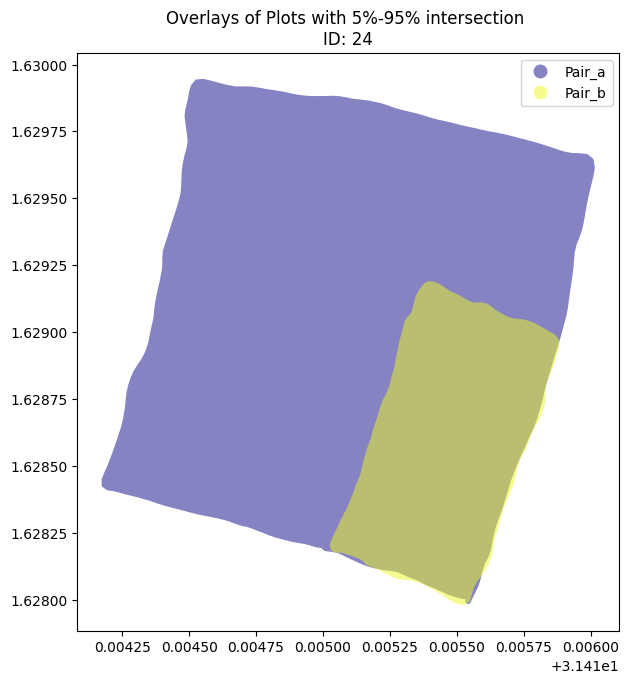

Overlap average percent: 89.964


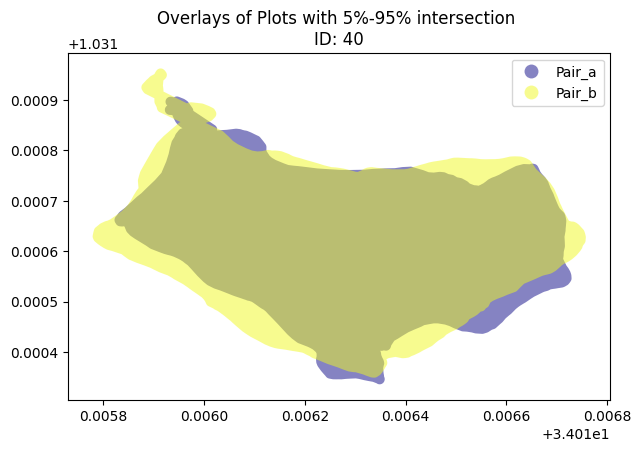

Overlap average percent: 78.043


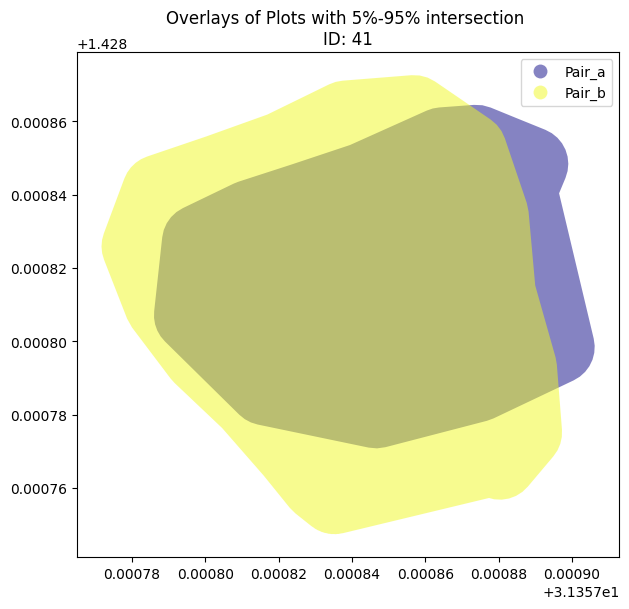

Overlap average percent: 5.863


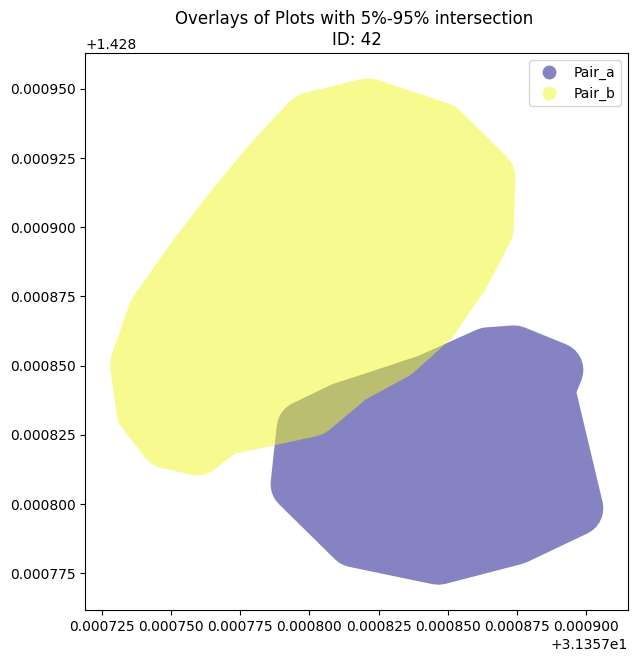

Overlap average percent: 39.247


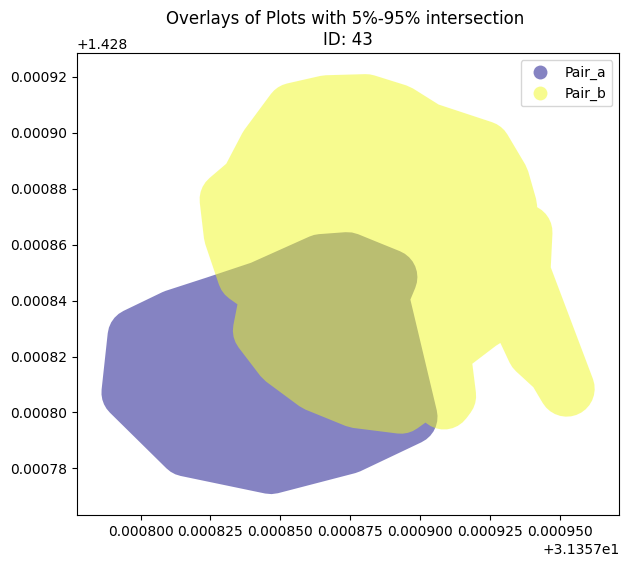

Overlap average percent: 38.348


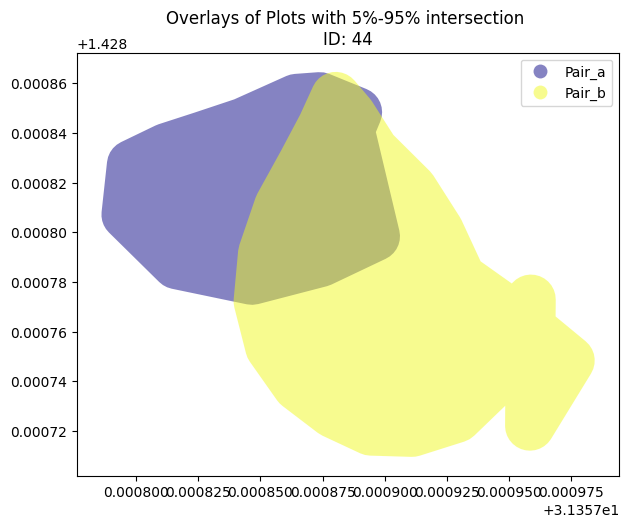

Overlap average percent: 12.521


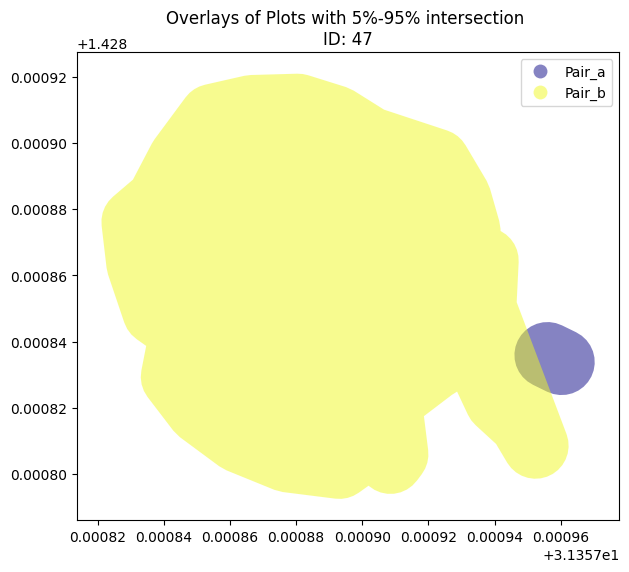

Overlap average percent: 17.169


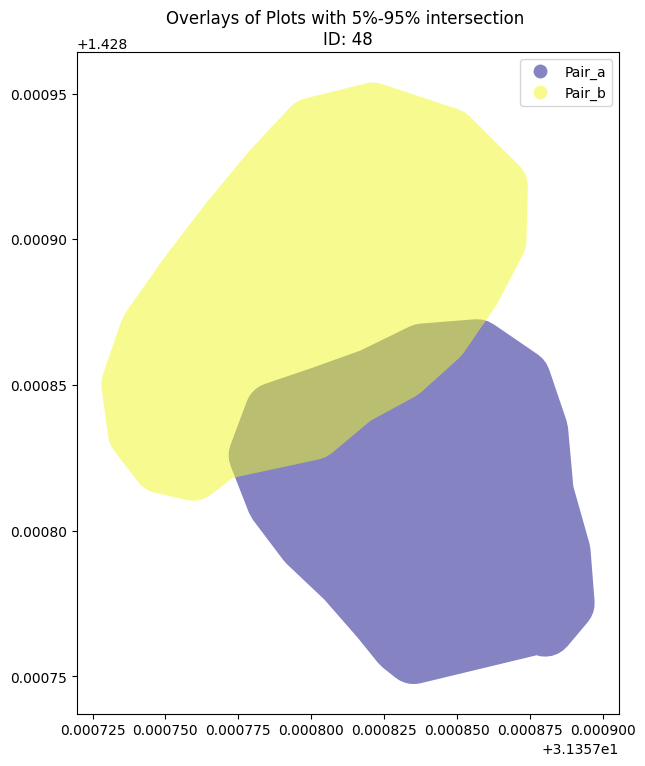

Overlap average percent: 31.405


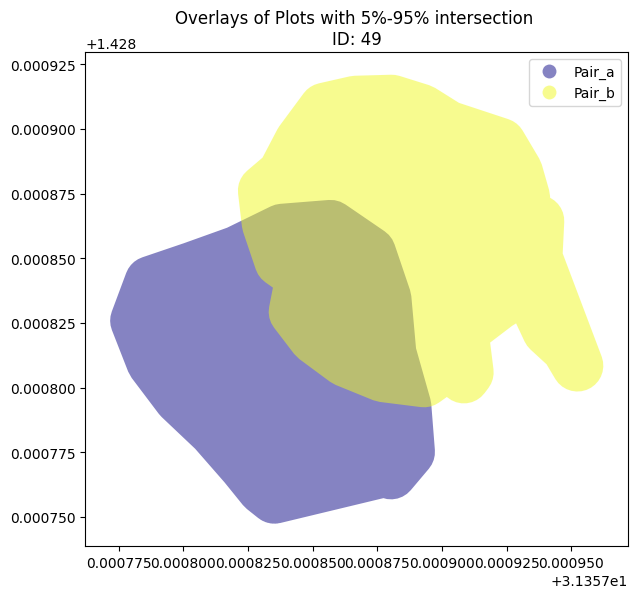

Overlap average percent: 34.995


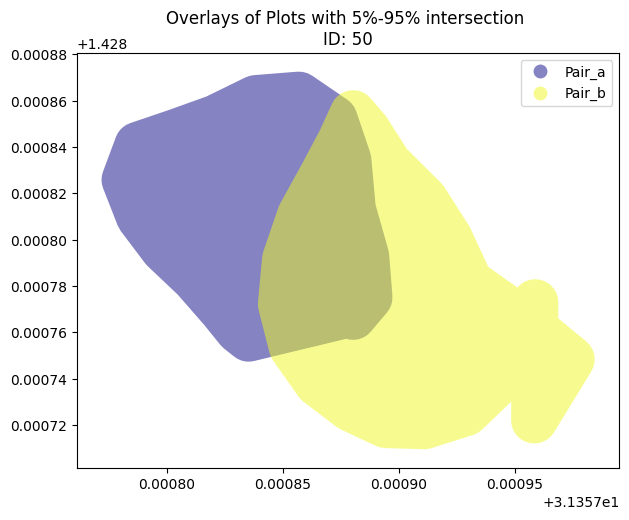

Overlap average percent: 18.15


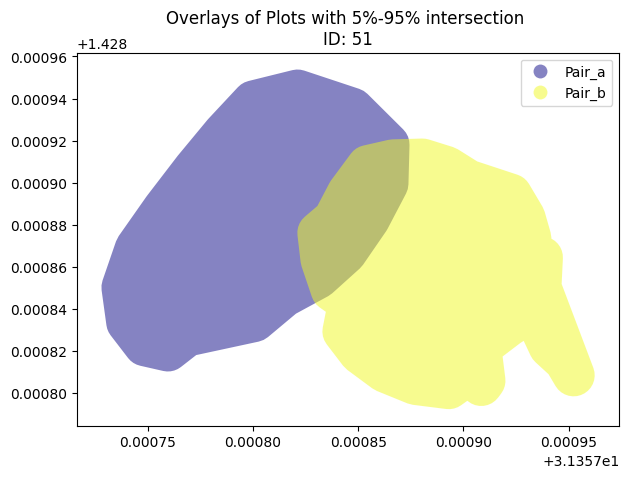

Overlap average percent: 38.575


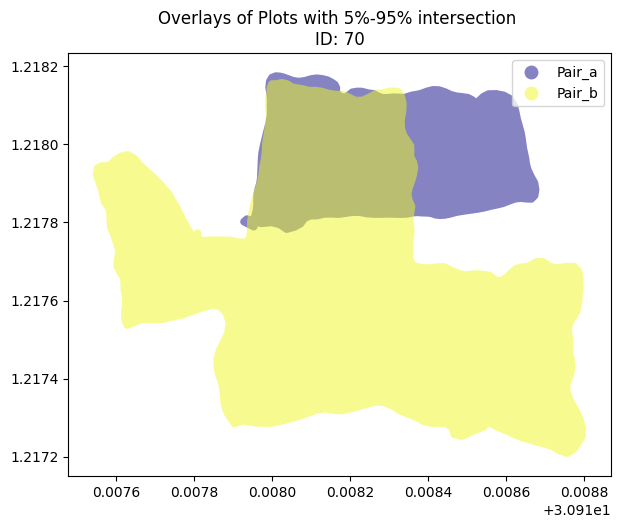

Overlap average percent: 90.543


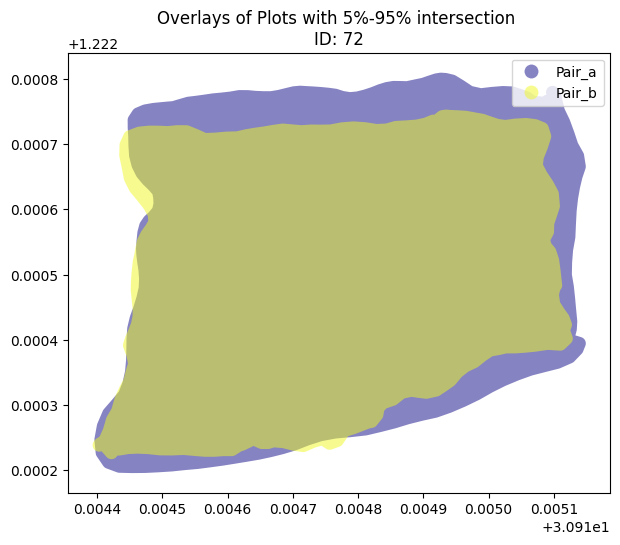

Overlap average percent: 74.722


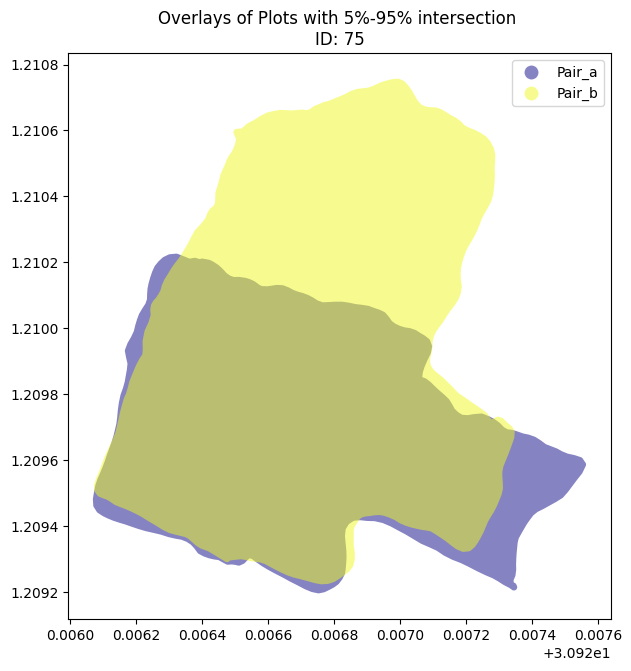

Overlap average percent: 50.004


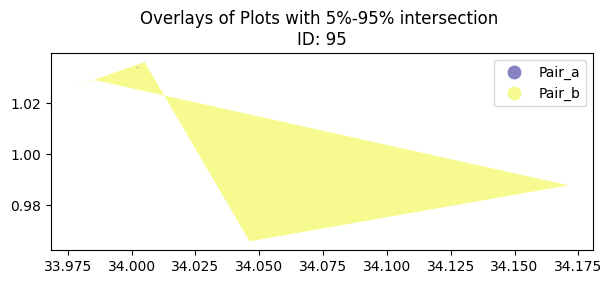

Overlap average percent: 50.003


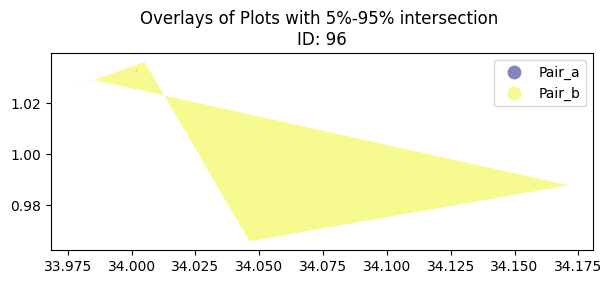

Overlap average percent: 50.002


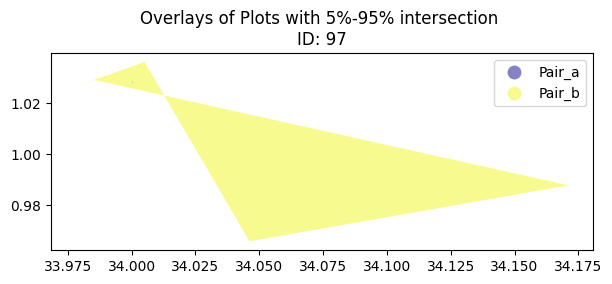

Overlap average percent: 50.007


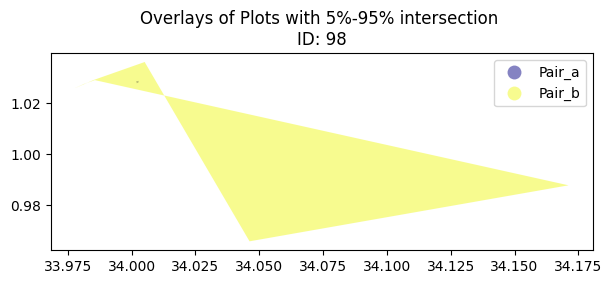

Overlap average percent: 50.002


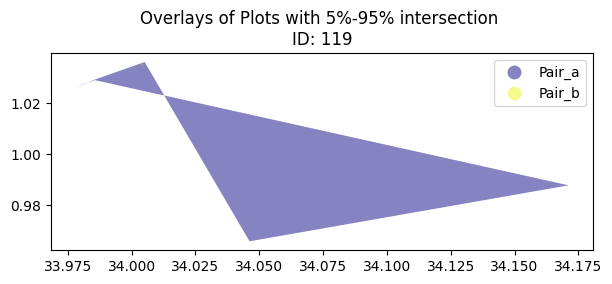

Overlap average percent: 19.495


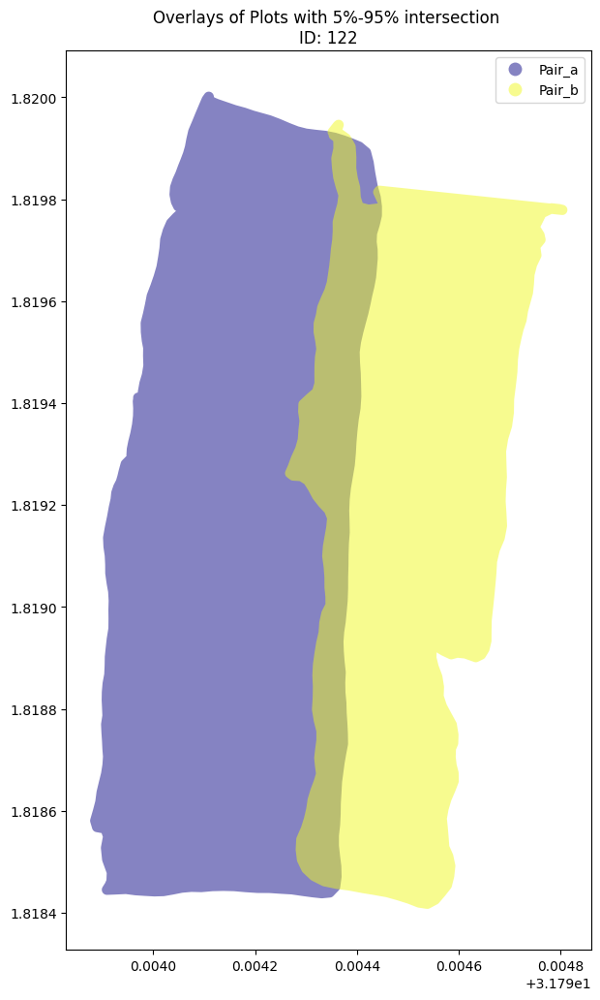

Overlap average percent: 19.495


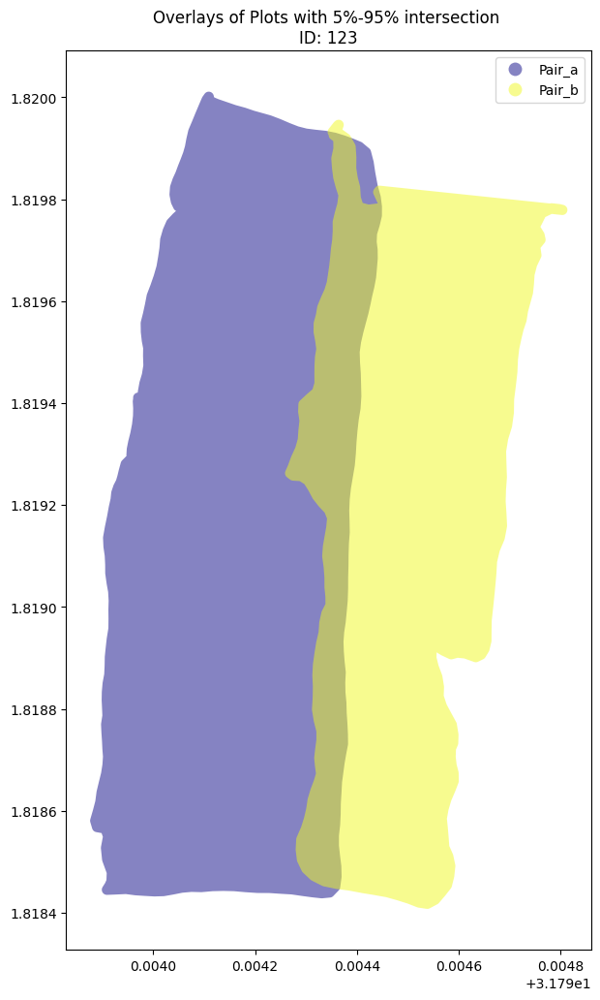

Overlap average percent: 25.863


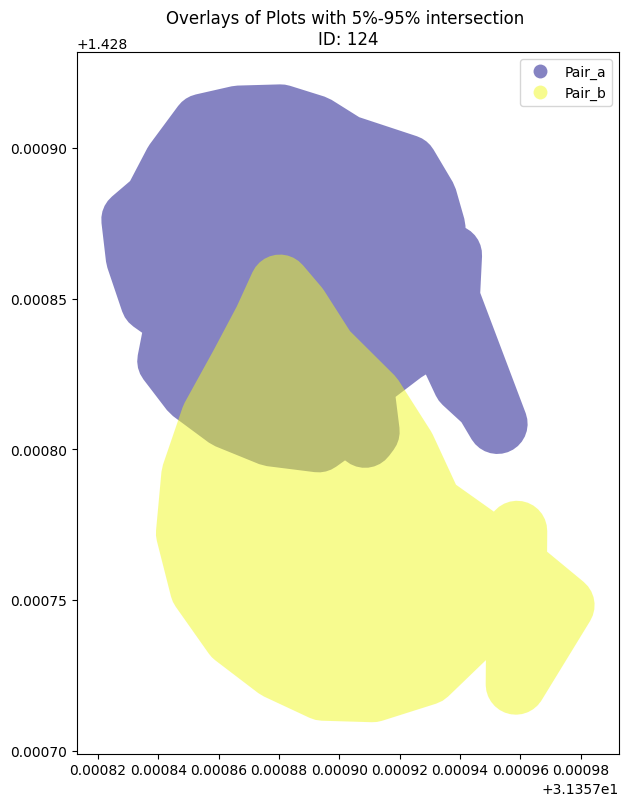

Overlap average percent: 86.028


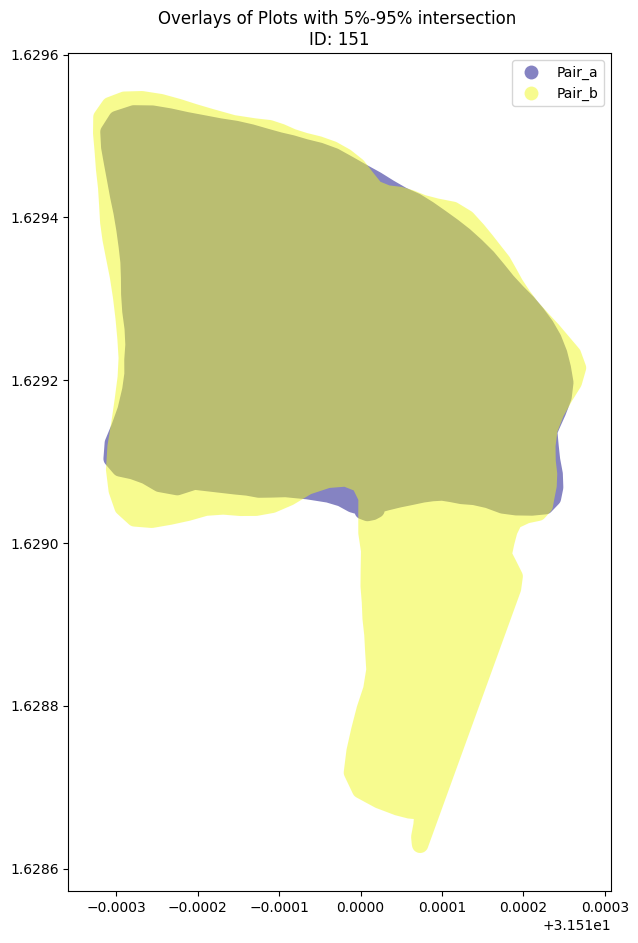

Overlap average percent: 86.028


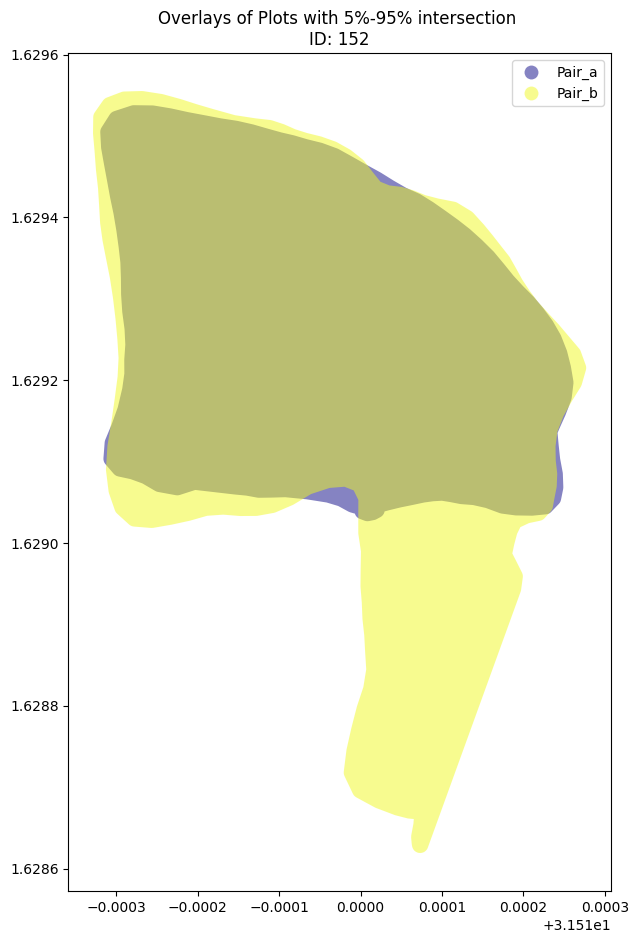

Overlap average percent: 86.028


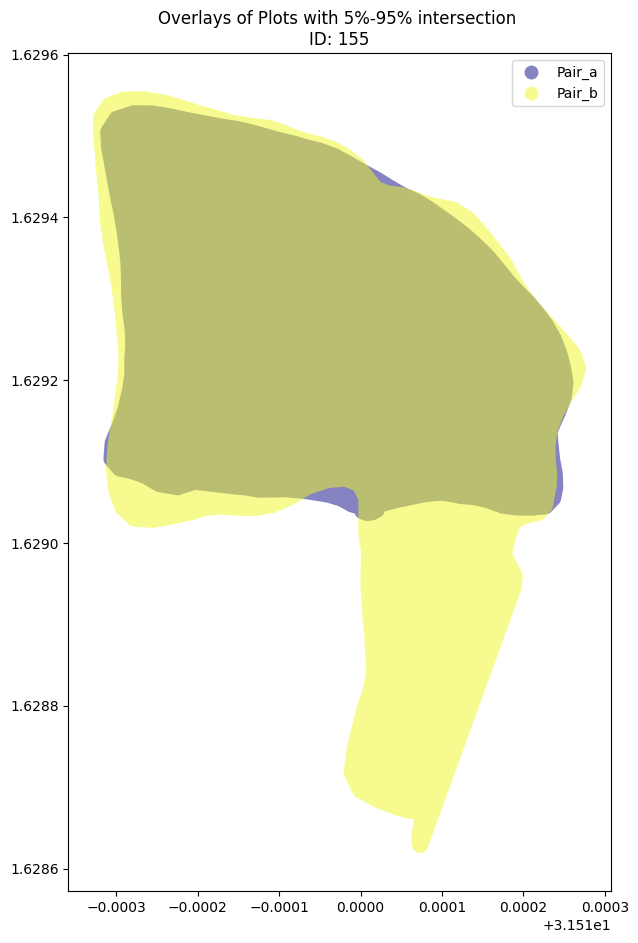

Overlap average percent: 86.028


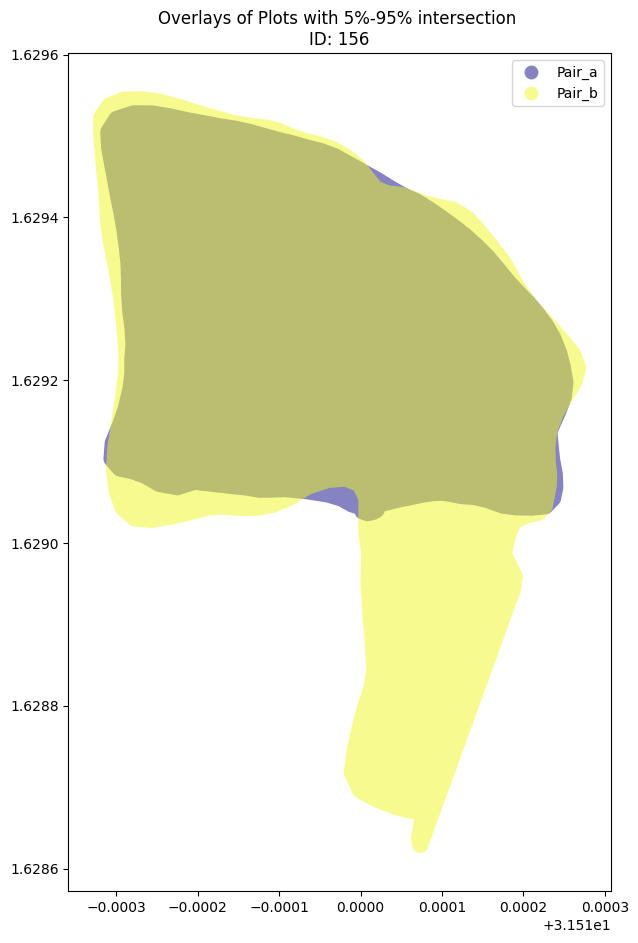

Overlap average percent: 12.521


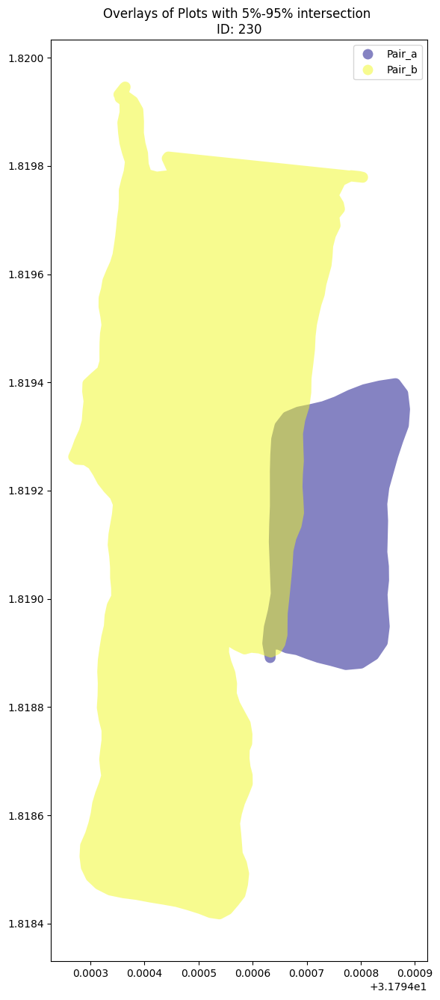

Overlap average percent: 12.521


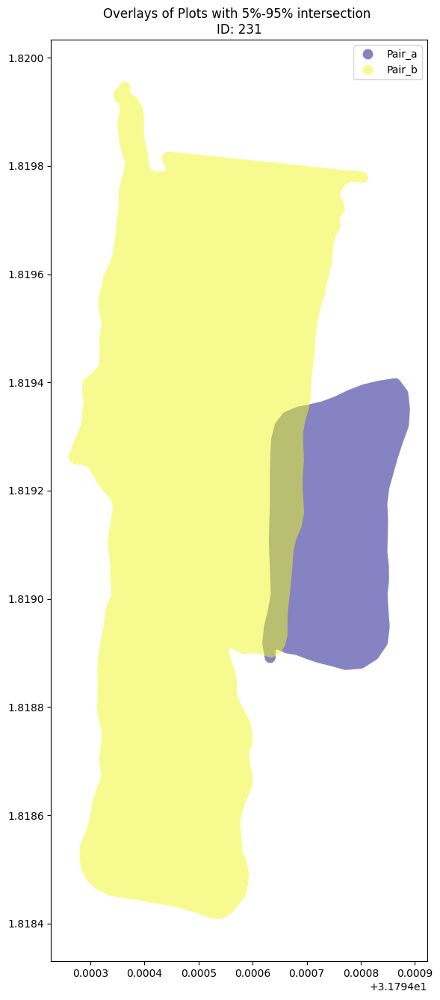

Overlap average percent: 94.312


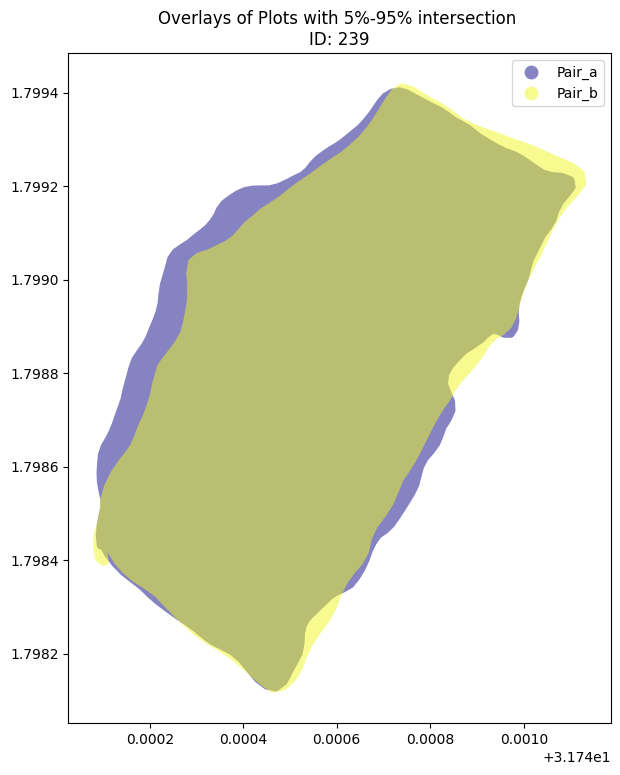

Overlap average percent: 7.66


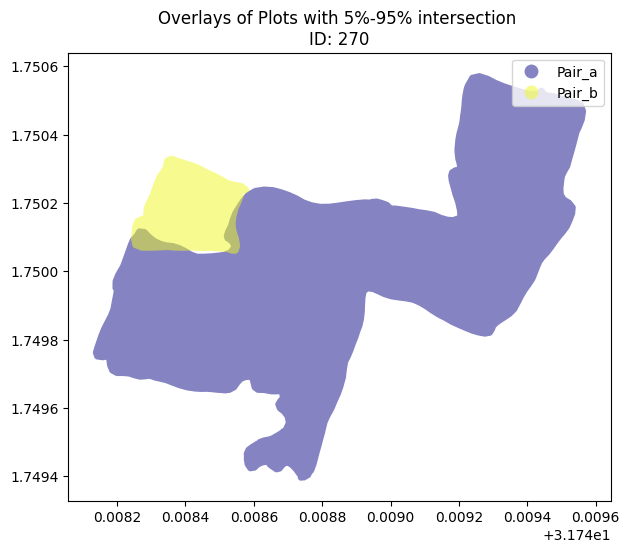

Overlap average percent: 5.373


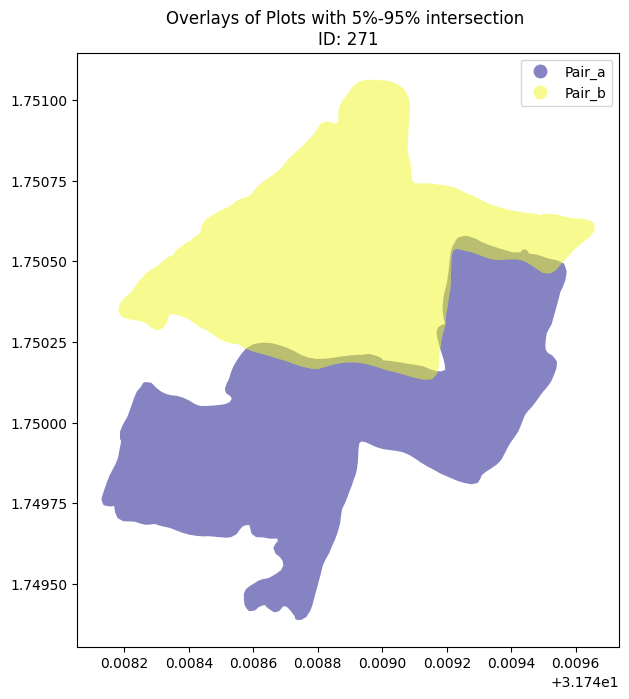

Overlap average percent: 5.593


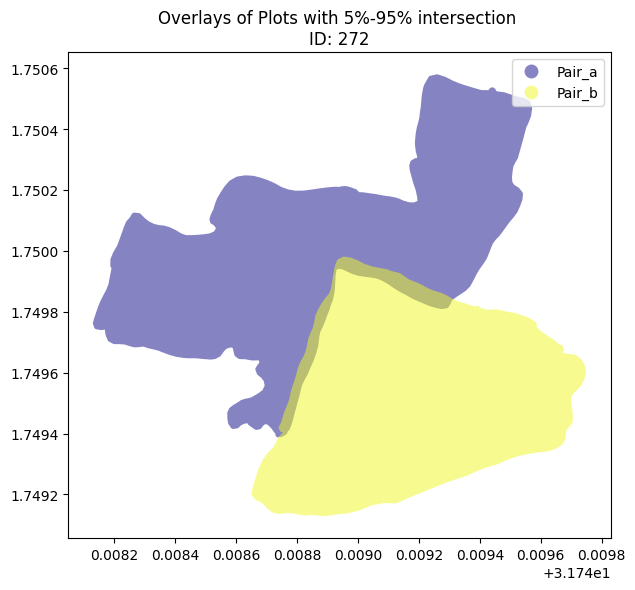

Overlap average percent: 63.144


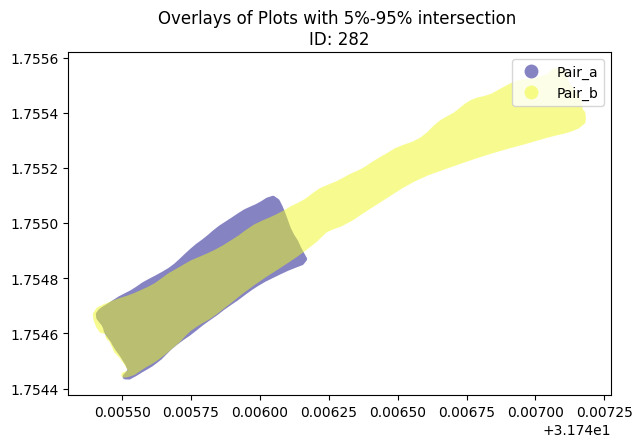

Overlap average percent: 25.786


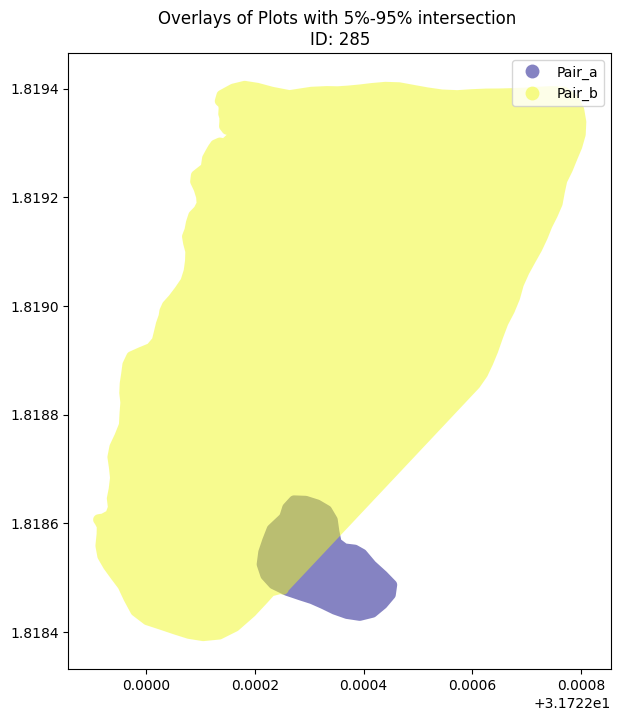

Overlap average percent: 93.47


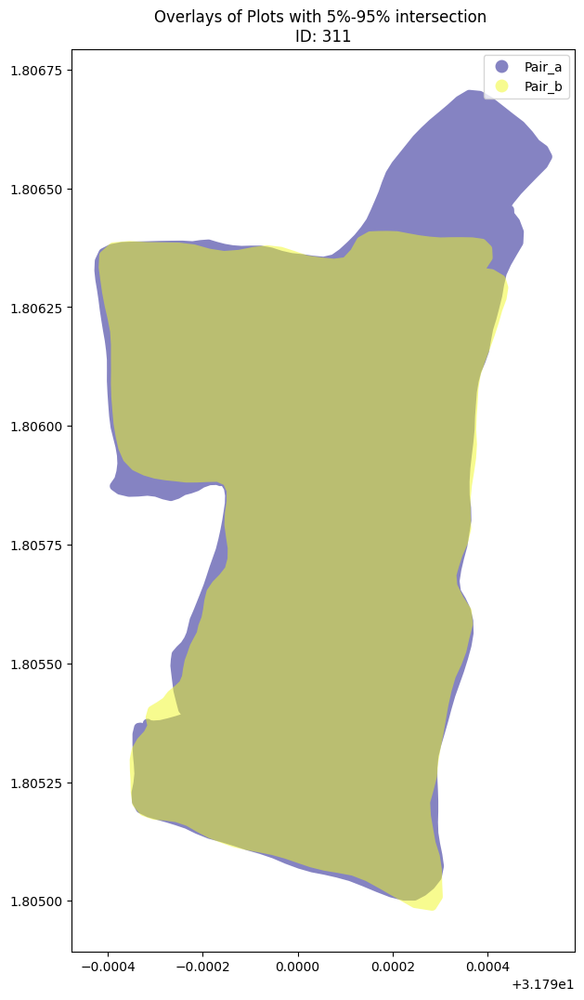

Overlap average percent: 93.47


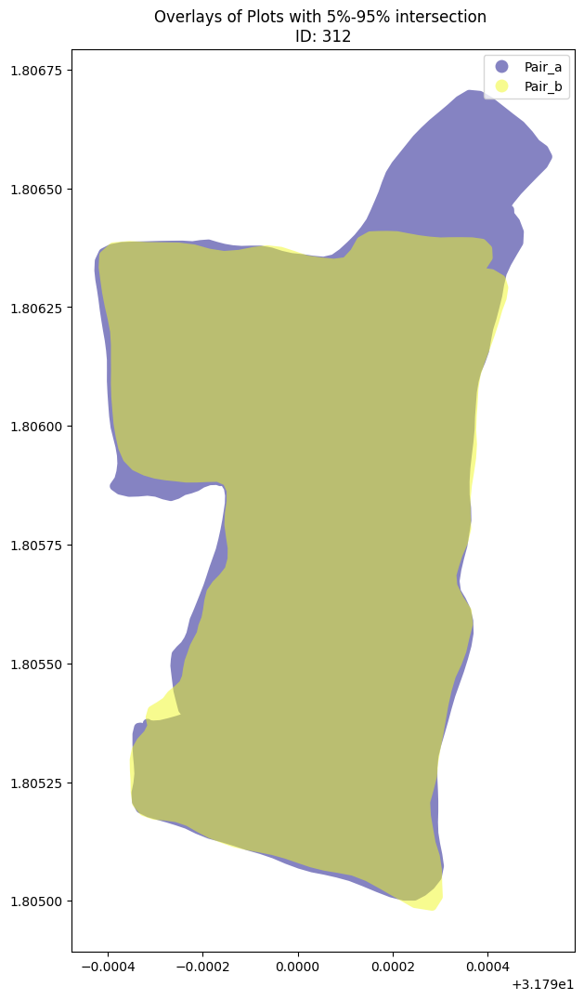

Overlap average percent: 93.47


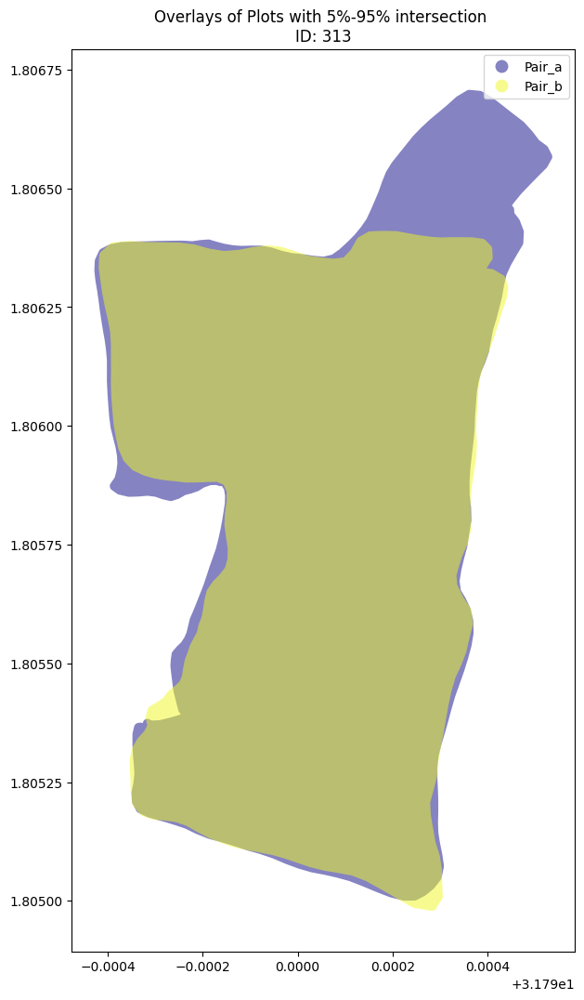

Overlap average percent: 93.47


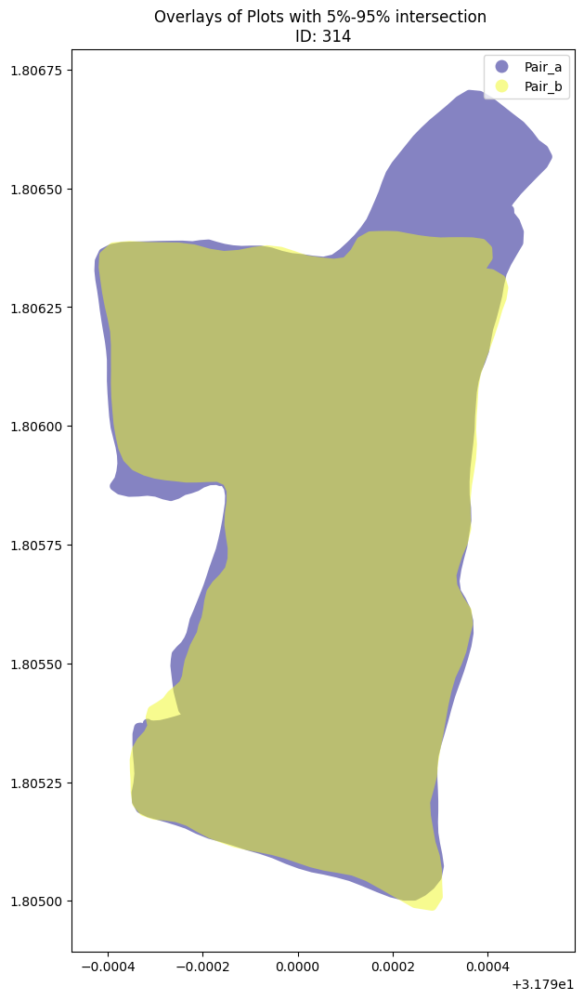

Overlap average percent: 11.445


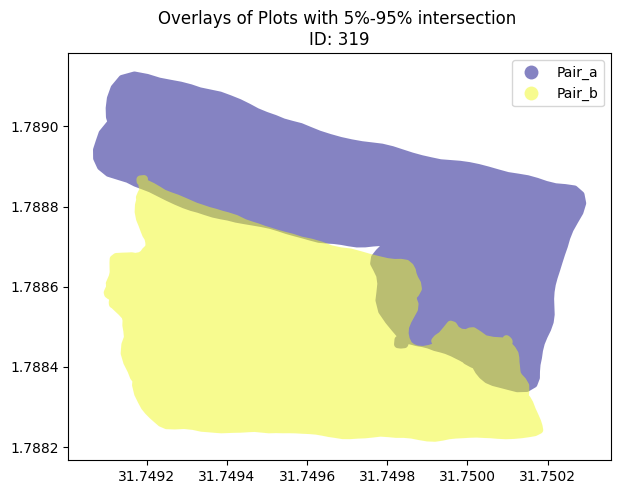

Overlap average percent: 11.445


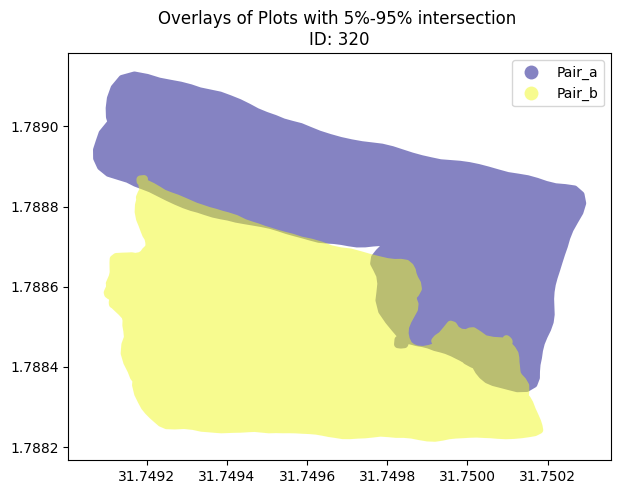

Overlap average percent: 11.445


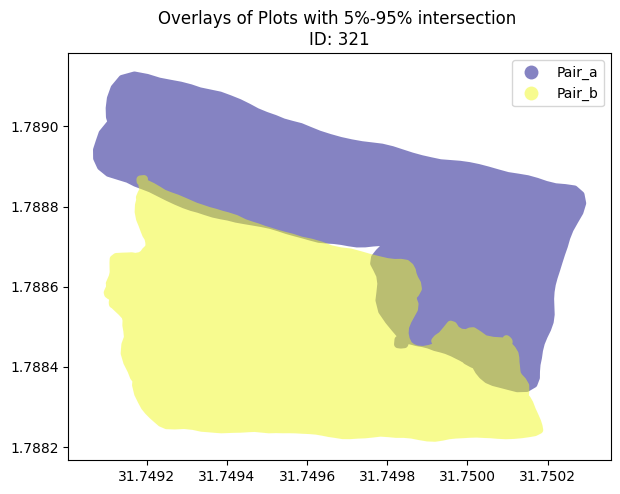

Overlap average percent: 12.631


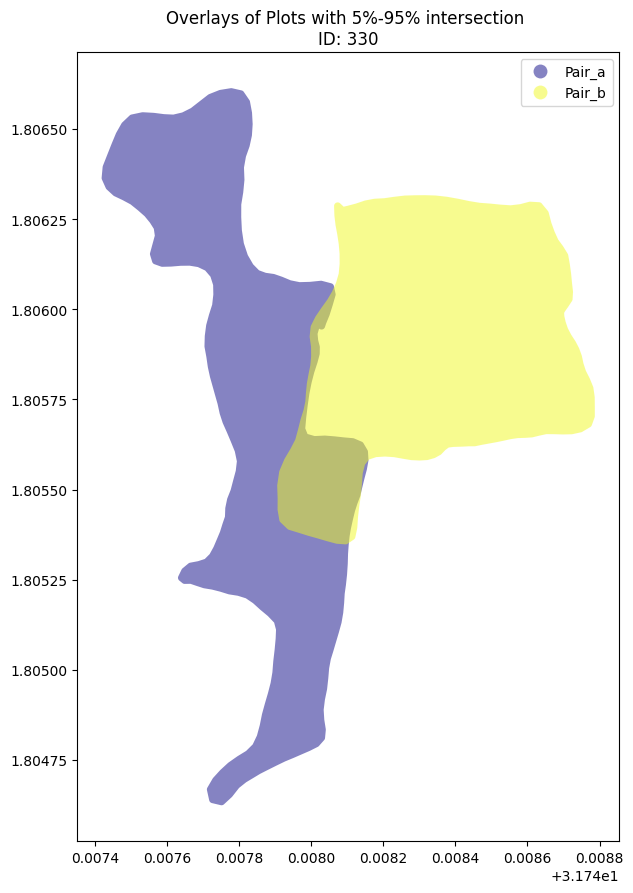

Overlap average percent: 12.631


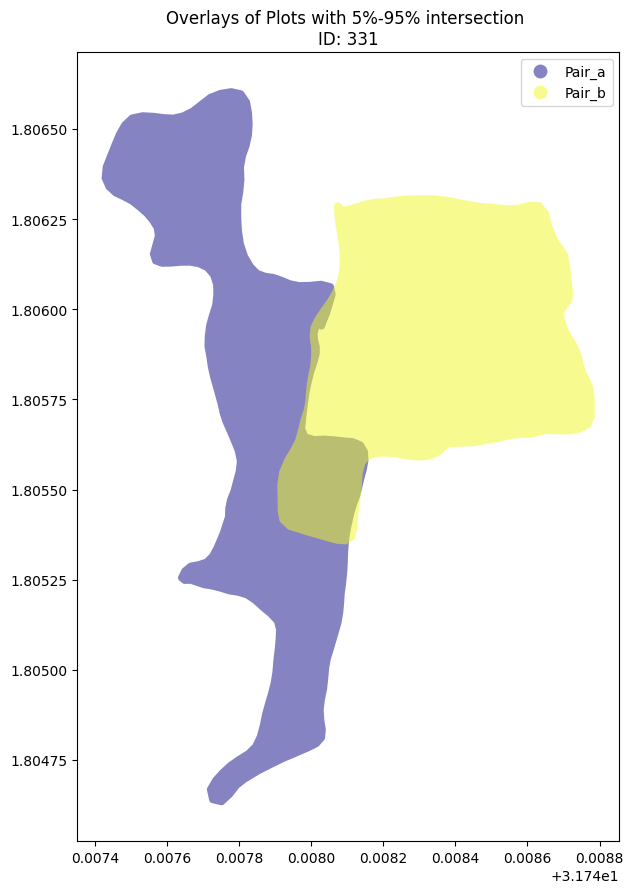

Overlap average percent: 81.396


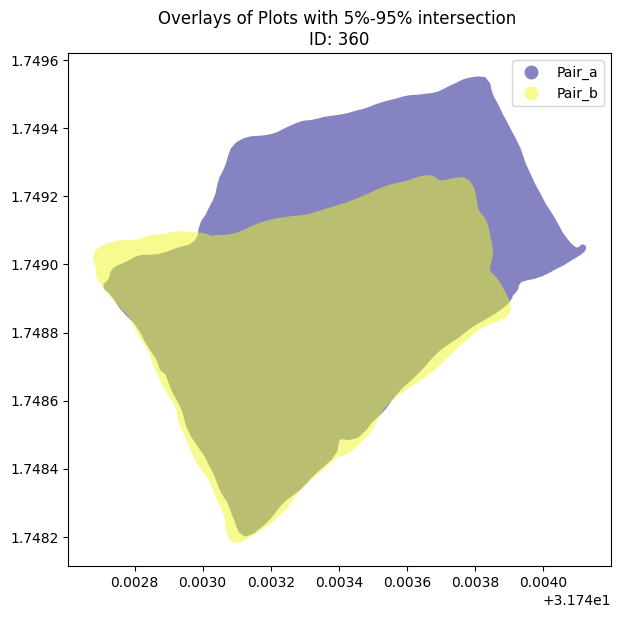

Overlap average percent: 6.997


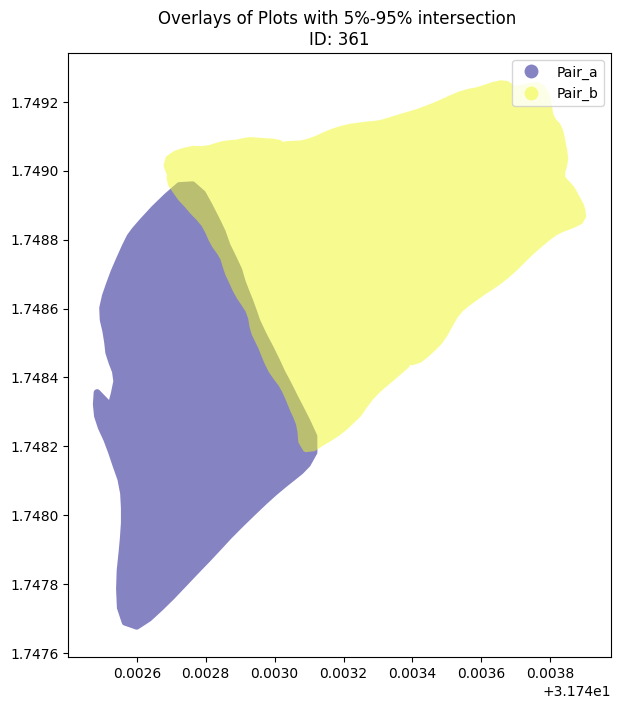

Overlap average percent: 91.71


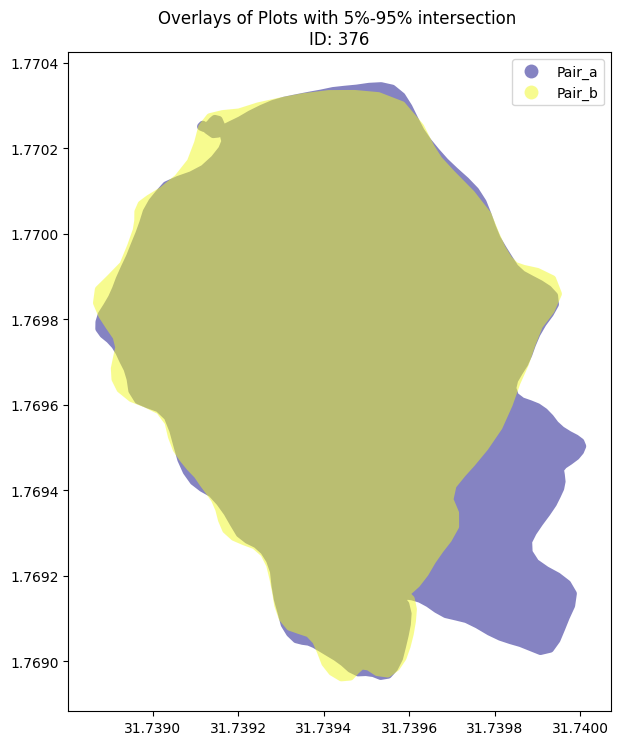

Overlap average percent: 12.521


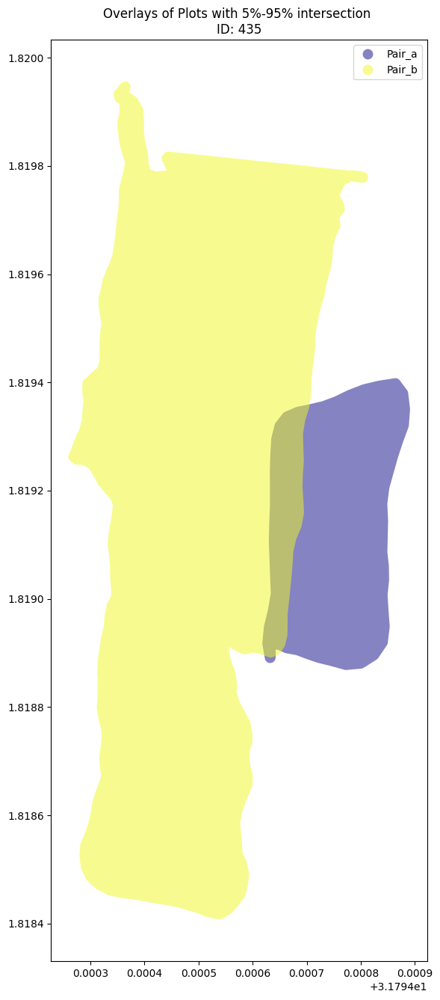

Overlap average percent: 12.521


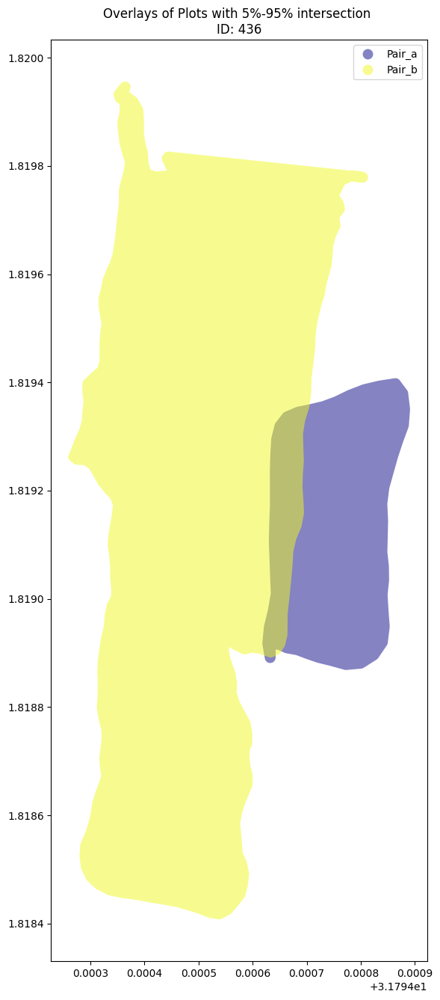

Overlap average percent: 15.094


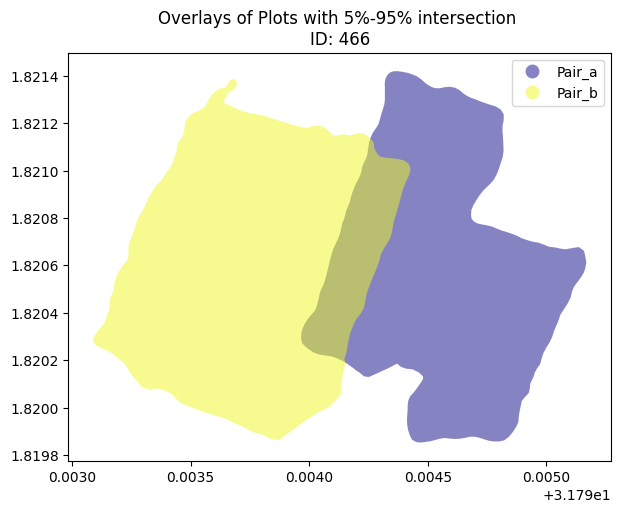

Overlap average percent: 15.094


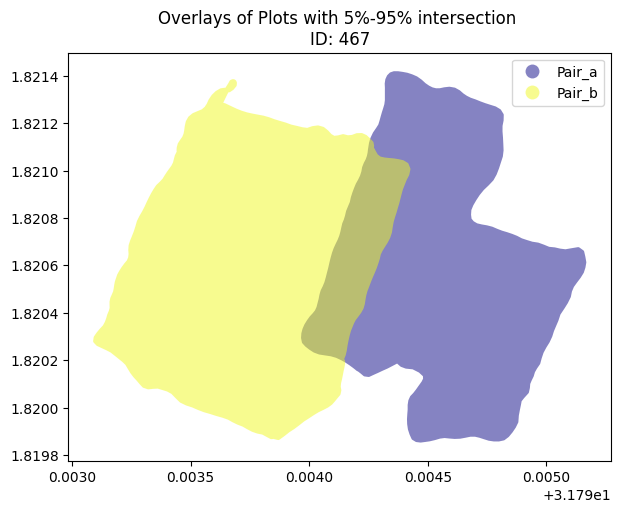

Overlap average percent: 15.094


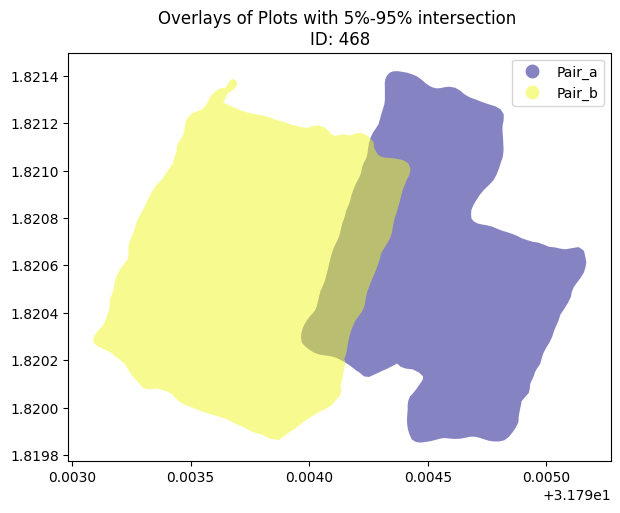

Overlap average percent: 15.094


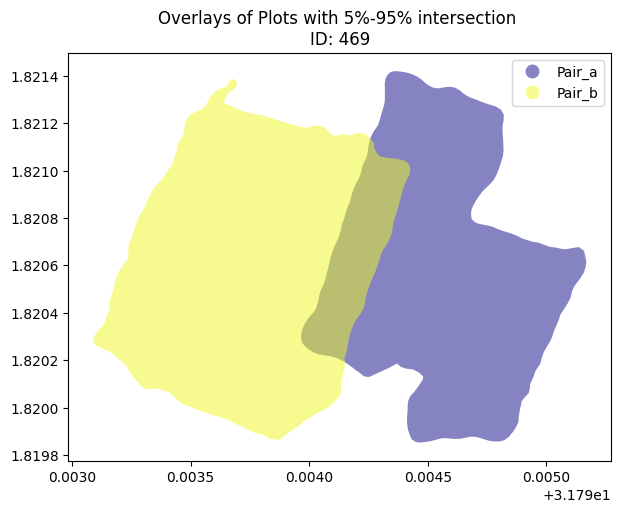

Overlap average percent: 12.631


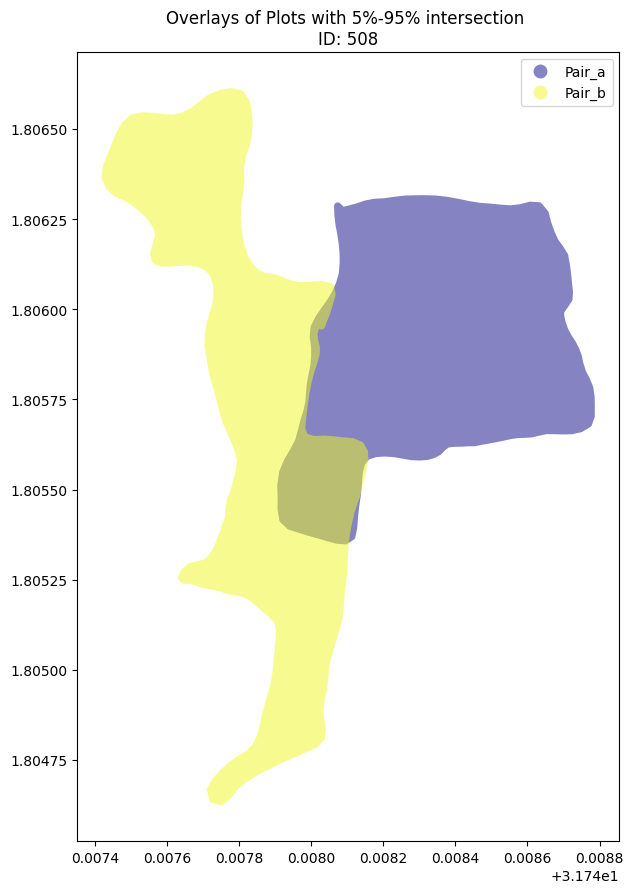

Overlap average percent: 12.631


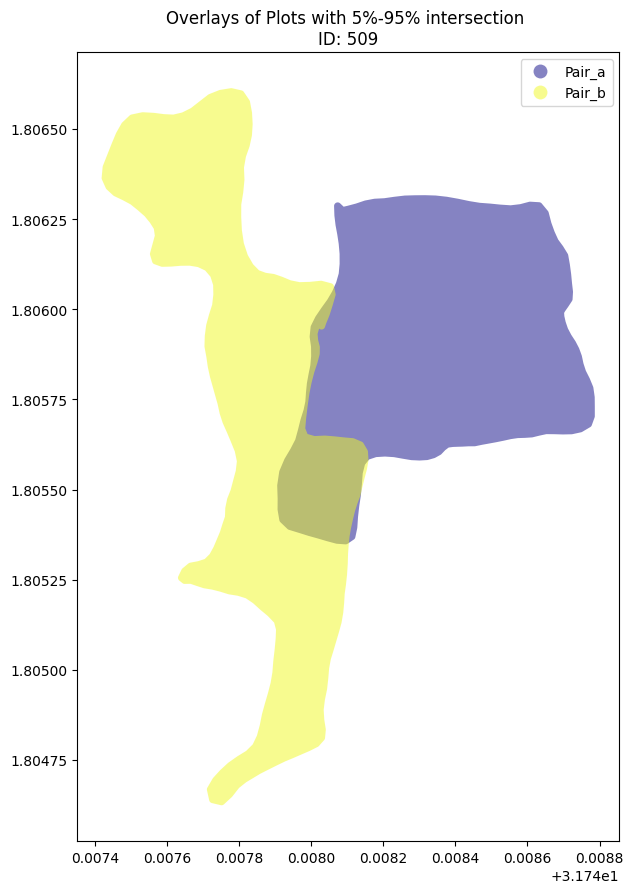

In [153]:
# Plots of the needs review and their overlaps 
createPlotsPairs(needs_review_overlaps, 'Overlays of Plots with 5%-95% intersection', (7,16), 1, True)


In [129]:
needs_review_overlaps.sort_values(by='overlap_average_percent', ascending=False)

,id,Pair_a,Pair_b,intersect_plots,difference_a,difference_b,overlap_area_plota_percent,overlap_area_plotb_percent,overlap_average_percent
30,239,"POLYGON ((31.74010 1.79842, 31.74010 1.79842, ...","POLYGON ((31.74011 1.79842, 31.74011 1.79840, ...","POLYGON ((31.74010 1.79842, 31.74009 1.79842, ...","MULTIPOLYGON (((31.74009 1.79849, 31.74009 1.7...","MULTIPOLYGON (((31.74011 1.79840, 31.74011 1.7...",91.697994,96.926735,94.312364
39,314,"POLYGON ((31.78967 1.80537, 31.78967 1.80537, ...","POLYGON ((31.79040 1.80633, 31.79041 1.80633, ...","POLYGON ((31.78968 1.80538, 31.78968 1.80538, ...","MULTIPOLYGON (((31.78967 1.80537, 31.78967 1.8...","MULTIPOLYGON (((31.79044 1.80629, 31.79044 1.8...",87.956935,98.984043,93.470489
36,311,"POLYGON ((31.78967 1.80537, 31.78967 1.80537, ...","POLYGON ((31.79040 1.80633, 31.79041 1.80633, ...","POLYGON ((31.78968 1.80538, 31.78968 1.80538, ...","MULTIPOLYGON (((31.78967 1.80537, 31.78967 1.8...","MULTIPOLYGON (((31.79044 1.80629, 31.79044 1.8...",87.956935,98.984043,93.470489
37,312,"POLYGON ((31.78967 1.80537, 31.78967 1.80537, ...","POLYGON ((31.79040 1.80633, 31.79041 1.80633, ...","POLYGON ((31.78968 1.80538, 31.78968 1.80538, ...","MULTIPOLYGON (((31.78967 1.80537, 31.78967 1.8...","MULTIPOLYGON (((31.79044 1.80629, 31.79044 1.8...",87.956935,98.984043,93.470489
38,313,"POLYGON ((31.78967 1.80537, 31.78967 1.80537, ...","POLYGON ((31.79040 1.80633, 31.79041 1.80633, ...","POLYGON ((31.78968 1.80538, 31.78968 1.80538, ...","MULTIPOLYGON (((31.78967 1.80537, 31.78967 1.8...","MULTIPOLYGON (((31.79044 1.80629, 31.79044 1.8...",87.956935,98.984043,93.470489
0,20,"POLYGON ((33.99025 0.98975, 33.99025 0.98975, ...","POLYGON ((33.99096 0.98973, 33.99096 0.98973, ...","POLYGON ((33.99025 0.98975, 33.99025 0.98975, ...","MULTIPOLYGON (((33.99023 0.98976, 33.99022 0.9...","MULTIPOLYGON (((33.99096 0.98973, 33.99096 0.9...",94.428789,90.955695,92.692242
47,376,"POLYGON ((31.73912 1.77024, 31.73912 1.77024, ...","POLYGON ((31.73886 1.76984, 31.73886 1.76984, ...","POLYGON ((31.73912 1.77024, 31.73912 1.77024, ...","MULTIPOLYGON (((31.73910 1.77025, 31.73910 1.7...","MULTIPOLYGON (((31.73886 1.76984, 31.73886 1.7...",86.141623,97.278216,91.709920
14,72,"POLYGON ((30.91507 1.22277, 30.91508 1.22277, ...","POLYGON ((30.91440 1.22225, 30.91440 1.22225, ...","POLYGON ((30.91477 1.22225, 30.91475 1.22225, ...","MULTIPOLYGON (((30.91508 1.22277, 30.91508 1.2...","MULTIPOLYGON (((30.91443 1.22233, 30.91443 1.2...",82.359954,98.725826,90.542890
3,40,"POLYGON ((34.01634 1.03134, 34.01633 1.03134, ...","POLYGON ((34.01636 1.03139, 34.01636 1.03139, ...","POLYGON ((34.01622 1.03139, 34.01622 1.03139, ...","MULTIPOLYGON (((34.01633 1.03134, 34.01633 1.0...","MULTIPOLYGON (((34.01636 1.03139, 34.01636 1.0...",94.967677,84.959626,89.963652
26,155,"POLYGON ((31.50978 1.62906, 31.50978 1.62906, ...","POLYGON ((31.51006 1.62863, 31.51006 1.62863, ...","POLYGON ((31.50978 1.62906, 31.50977 1.62906, ...","MULTIPOLYGON (((31.50969 1.62910, 31.50969 1.6...","MULTIPOLYGON (((31.51006 1.62863, 31.51006 1.6...",98.993093,73.063430,86.028262


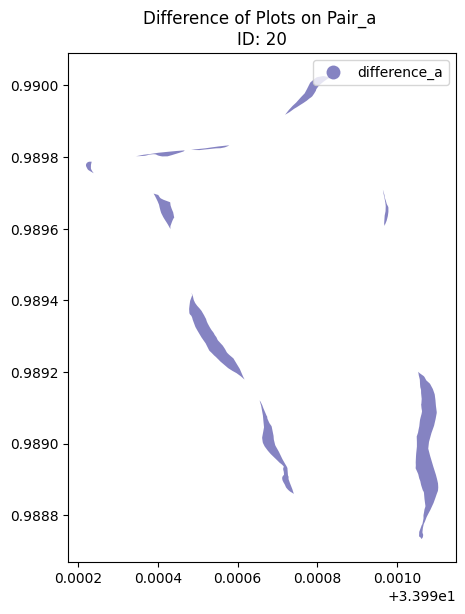

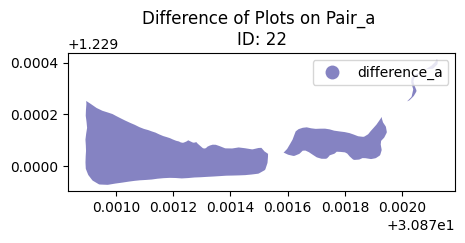

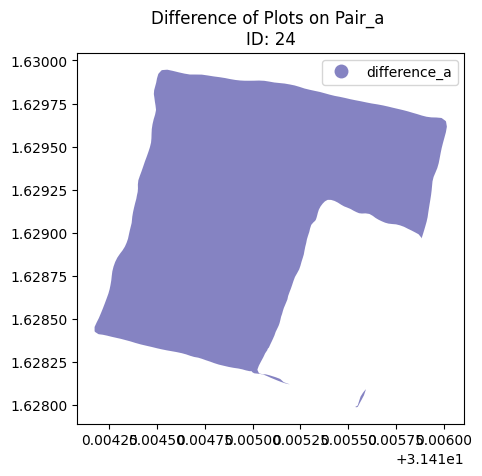

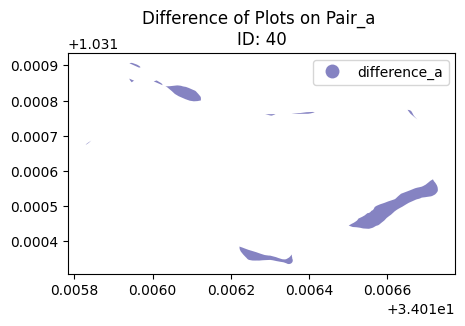

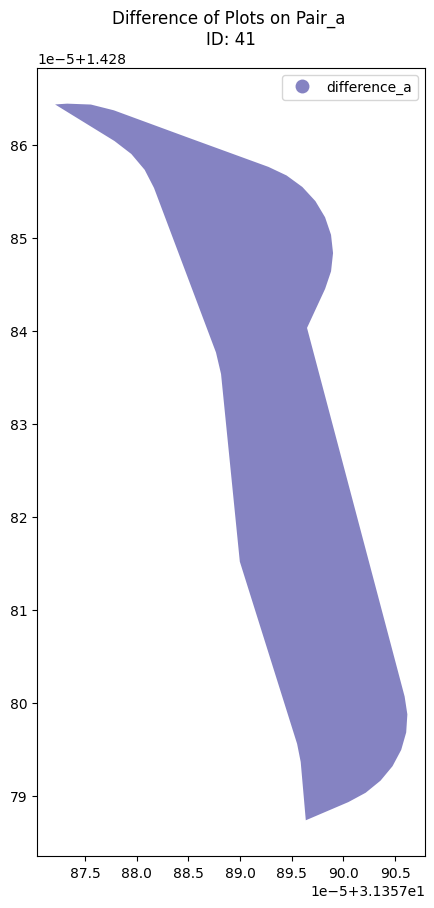

...

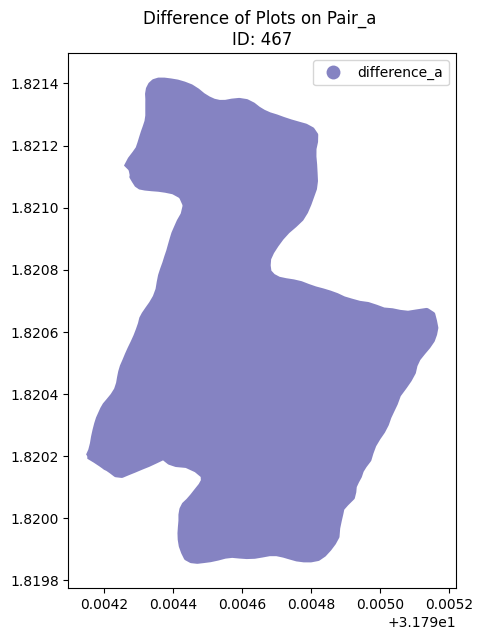

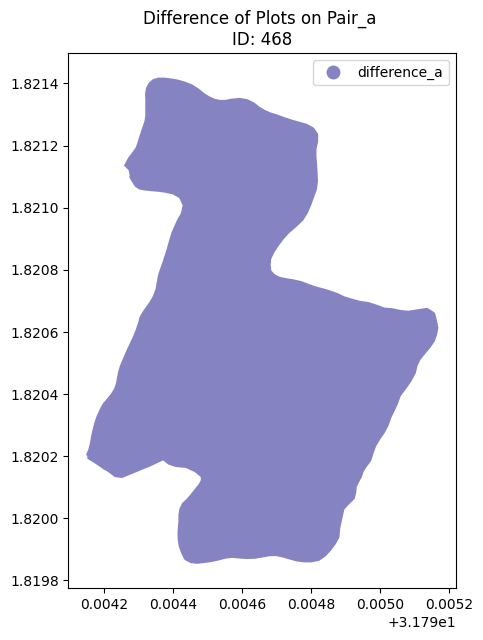

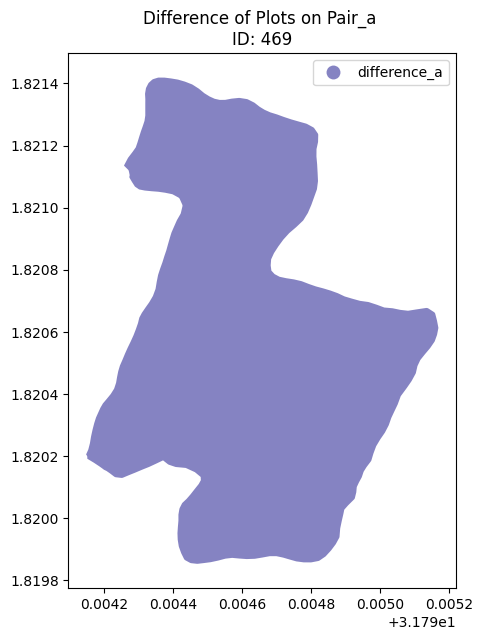

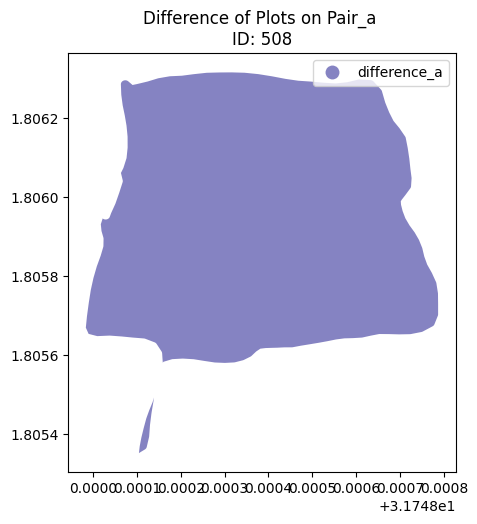

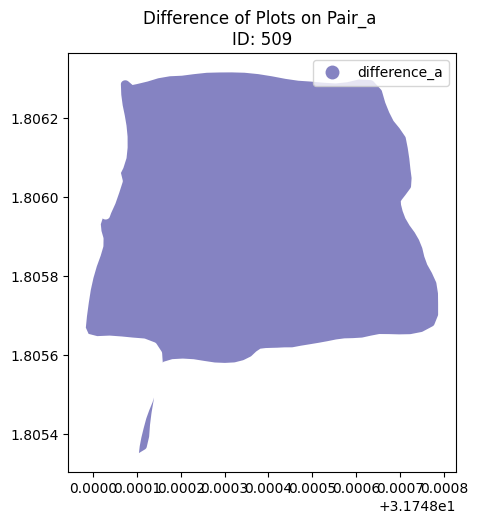

In [152]:
# Showing difference of Pair_a
createPlots(needs_review_overlaps, 'difference_a', 'Difference of Plots on Pair_a', (5,15), 0.9)


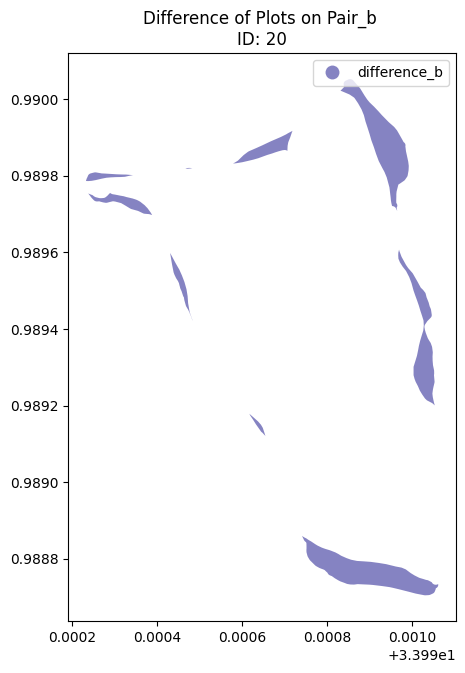

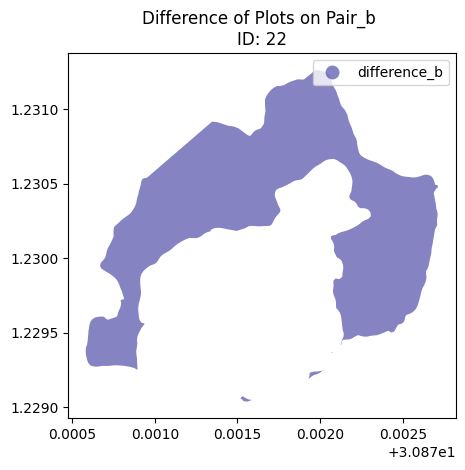

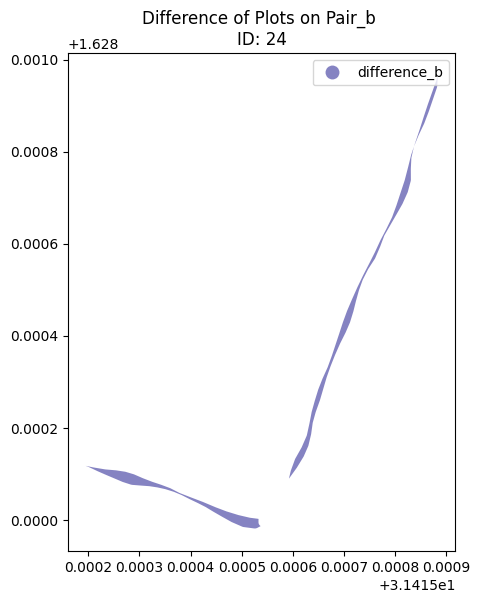

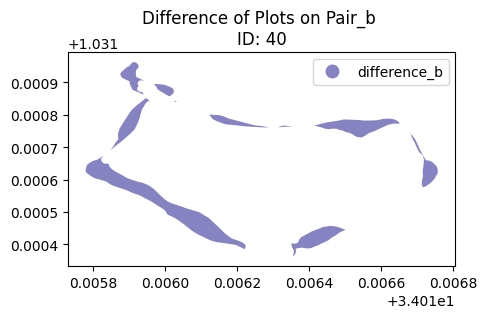

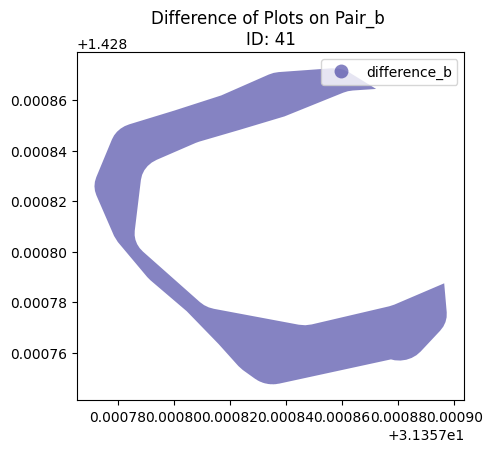

...

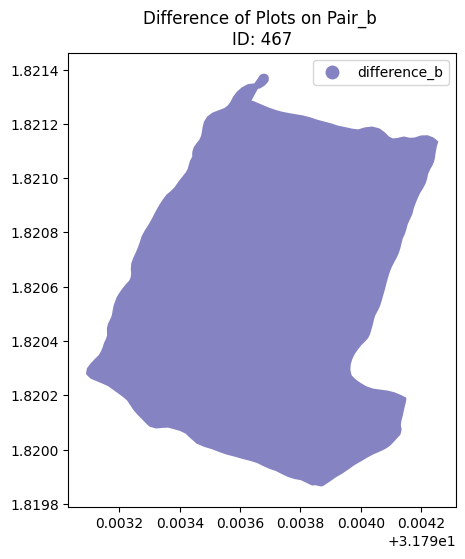

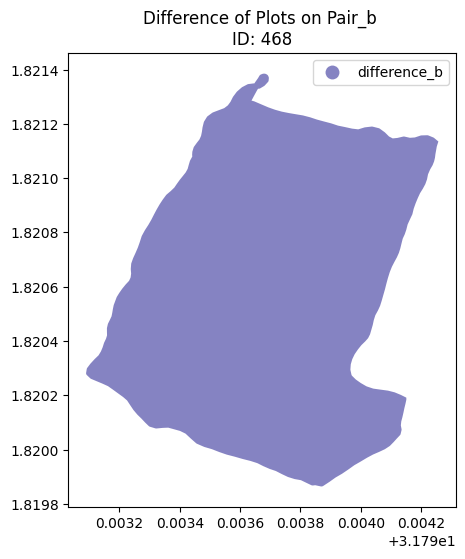

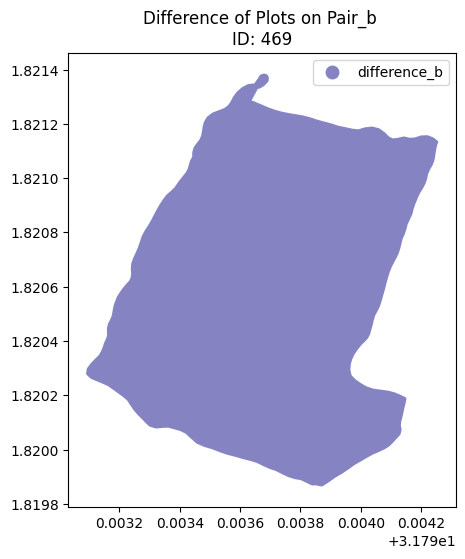

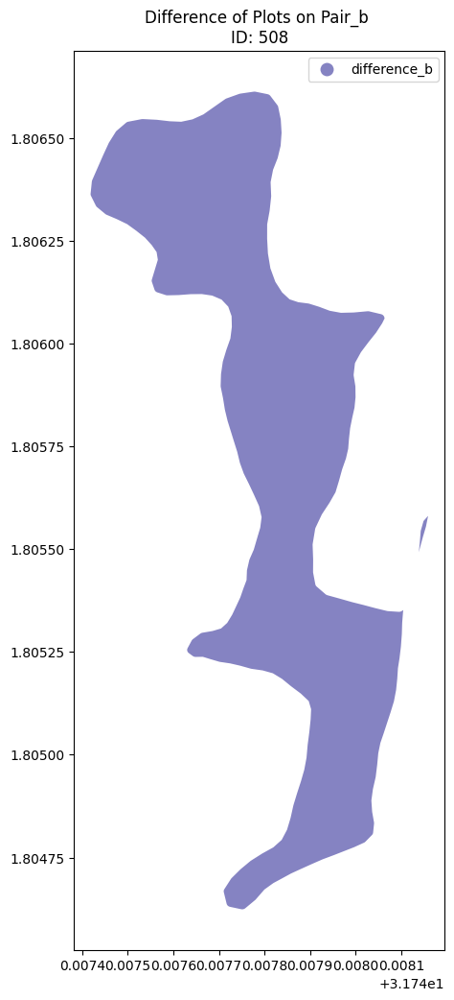

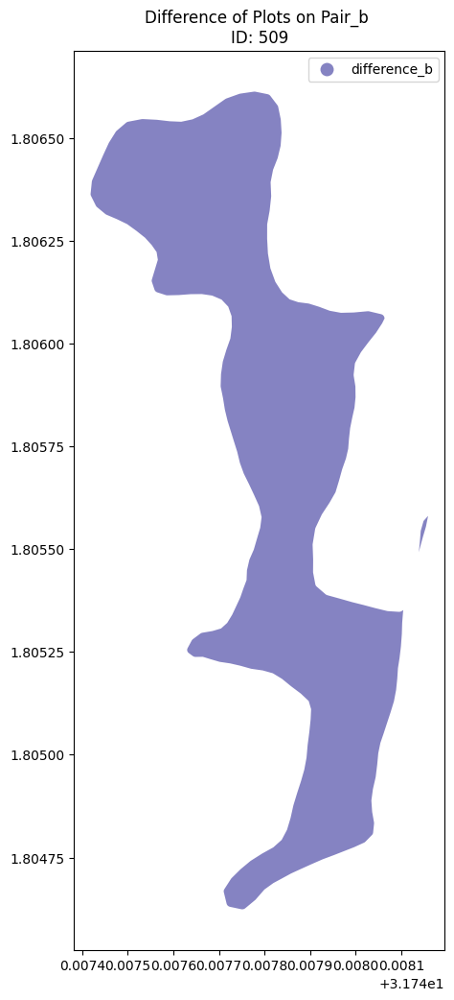

In [151]:
# Showing difference of Pair_b
createPlots(needs_review_overlaps, 'difference_b', 'Difference of Plots on Pair_b', (5,15), 0.9)


In [132]:
# needs_review_overlaps_df = needs_review_overlaps[['id', 'Pair_a', 'Pair_b', 'intersect_plots',
#        'overlap_area_plota_percent', 'overlap_area_plotb_percent',
#        'overlap_average_percent']]
needs_review_overlaps_df.to_csv('outputs/needs_review_overlaps.csv', index = False)

In [134]:
gdf_diff = needs_review_overlaps.copy()

# gdf_diff['diff_pairb'] = needs_review_overlaps['Pair_b'].difference(needs_review_overlaps['Pair_a'])
polygon_empty = gdf_diff[(gdf_diff['difference_a'] == (gdf_diff['difference_a'][16])) | (gdf_diff['difference_b'] == (gdf_diff['difference_b'][20]))]
polygon_empty

,id,Pair_a,Pair_b,intersect_plots,difference_a,difference_b,overlap_area_plota_percent,overlap_area_plotb_percent,overlap_average_percent
16,95,"POLYGON ((34.00284 1.03407, 34.00283 1.03407, ...","POLYGON ((33.98010 1.02693, 33.97797 1.02601, ...","POLYGON ((34.00283 1.03407, 34.00283 1.03405, ...",POLYGON EMPTY,"POLYGON ((33.97797 1.02601, 33.97796 1.02601, ...",100.000000,0.008068,50.004034
17,96,"POLYGON ((34.00169 1.03237, 34.00169 1.03238, ...","POLYGON ((33.98010 1.02693, 33.97797 1.02601, ...","POLYGON ((34.00169 1.03238, 34.00169 1.03238, ...",POLYGON EMPTY,"POLYGON ((33.97797 1.02601, 33.97796 1.02601, ...",100.000000,0.005731,50.002866
18,97,"POLYGON ((34.00025 1.02845, 34.00025 1.02845, ...","POLYGON ((33.98010 1.02693, 33.97797 1.02601, ...","POLYGON ((34.00025 1.02845, 34.00025 1.02845, ...",POLYGON EMPTY,"POLYGON ((33.97797 1.02601, 33.97796 1.02601, ...",100.000000,0.003904,50.001952
19,98,"POLYGON ((34.00186 1.02864, 34.00187 1.02865, ...","POLYGON ((33.98010 1.02693, 33.97797 1.02601, ...","POLYGON ((34.00187 1.02865, 34.00189 1.02866, ...",POLYGON EMPTY,"POLYGON ((33.97797 1.02601, 33.97796 1.02601, ...",100.000000,0.014244,50.007122
20,119,"POLYGON ((33.98010 1.02693, 33.97797 1.02601, ...","POLYGON ((34.00401 1.03542, 34.00401 1.03542, ...","POLYGON ((34.00401 1.03542, 34.00401 1.03542, ...","POLYGON ((33.97797 1.02601, 33.97796 1.02601, ...",POLYGON EMPTY,0.004945,100.000000,50.002472


In [135]:
polygon_empty.to_csv('outputs/polygon_empty_pairs.csv', index= False)

In [87]:
# polygon_empty[polygon_empty['diff_pairb'] != (polygon_empty['diff_pairb'][20])]
# polygon_empty[polygon_empty['difference'] != (polygon_empty['difference'][16])]

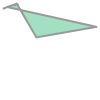

In [150]:
polygon_empty.difference_b[16]

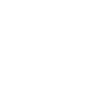

In [79]:
polygon_empty.intersect_plots[16]

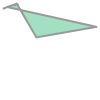

In [149]:
polygon_empty.difference_b[16]

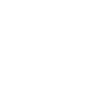

In [82]:
polygon_empty.Pair_a[16]

In [61]:
# print(gdf.Pair_a[94])

In [62]:
# print(gdf.Pair_b[94])

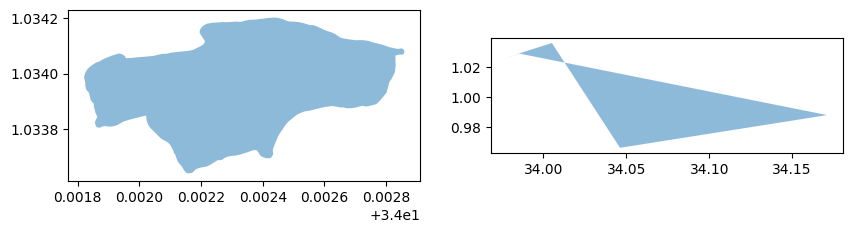

In [89]:
example = polygon_empty.loc[[16]].reset_index()

for slide in range(len(example)):
    d = {'col1': ['Pair_a'], 'geometry': [example.Pair_a[slide]]}
    e = {'col1': ['Pair_b'], 'geometry': [example.Pair_b[slide]]}

    new = gpd.GeoDataFrame(d, crs='EPSG:4326')
    new1 = gpd.GeoDataFrame(e, crs='EPSG:4326')

    fig, ax = plt.subplots(ncols = 2, figsize=(10, 30))
    new.plot(ax=ax[0], alpha=0.5, aspect=0.9, cmap='tab20', legend= True)
    new1.plot(ax= ax[1], alpha=0.5, aspect=0.9, cmap='tab20', legend= True)

    plt.show()
    
    

### Solutions and Recap

1) `full_overlaps_df`: 285 IDS where plot pairs intersected > 95%, Project managers can use one of the plots to measure the carbon. Also notifies that these trace farms were most likely duplicated as they are identical plots, but client will not need to go replot. 

2) `union_plots_df`: 172 IDS for plot pairs with average < 5%, assuming that plots have same carbon capture impact use the union plot to extrapolate the carbon count

3) `needs_review_df`: 56 IDS for plot pairs with 5% <= average overlap <= 95%, needs more reviewing with project managers and more data info on what was in each plot to determine if we can unionize these plots as well. 
 - Addtionally can use separate polygons, from difference_a, difference_b and intersect_plots to grab the carbon quantification and prevent double counting of carbon.
 

4) More complex plots: needs review from project managers, special attention to `empty_polygons.csv `

5) Improving operations, further data collection and analysis 
  - More data collection: type of trees/plants in the plot (help determine if we are able to combine/union the plots for carbon calculations), knowledge of the plot's allows us to combine plots and use that for extrapolation (ex for needs_review_df we can combine the plots using union if the type of farming is same)
  - Automated alerting system of these analysis process to speed up communication for project managers/ clients on data quality issues and complex trace farm overlaps
  - Better GPS system/ drone farming remote sensors (if $ allows) for improved precision of tracings data


In [ ]:
# gdf.loc[[0],'Pair_a'].boundary.plot()
# gdf.loc[[0],'Pair_b'].boundary.plot()